# CycleGAN 실습
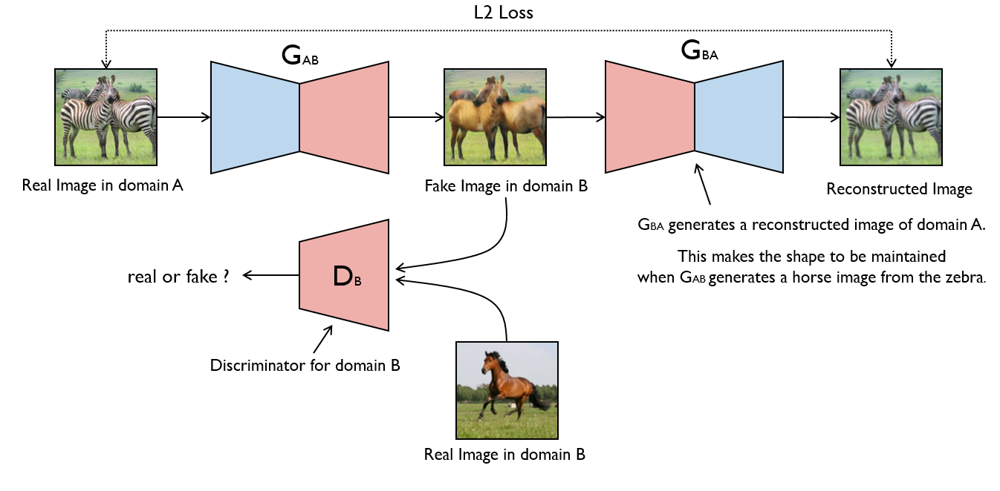
이전에 발표되었던 Pix2Pix가 paired training data를 필요로 하였다면, **CycleGAN은 unpaired한 training data를 대상으로 합니다.** 위의 그림에서 G(AB)를 통해 생성된 이미지들과 Real images를 D(B)에 넣어주면, D(B)는 G(AB)를 학습시키게 됩니다. 하지만, Real images와 같은 그림을 만들게 되는데, 이는 우리가 원하는 domain이 아니게 됩니다. 이를 해결하기 위해서, **Cycle-GAN은 Generator를 하나 더 도입하여서, G(BA)가 G(AB)가 생성한 이미지를 입력으로 받아서 생성한 결과를 실제 입력이미지와 L1 loss를 통해서 모양과 형태가 유사할 수 있도록 합니다.**

# 실습 모듈 불러오기

In [4]:
# pyTorch 관련 된 라이브러리.
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim # optimization에 관한 모듈.
import torchvision # 이미지 관련 전처리, pretrained된 모델, 데이터 로딩에 관한 패키지입니다.
import torchvision.datasets as datasets
import torchvision.transforms as T # 이미지 전처리 모듈입니다.
from torch.utils import data

# 기타 필요한 라이브러리.
import numpy as np
import matplotlib.pyplot as plt
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# DataLoader
cycleGAN의 경우에는 2가지의 서로 다른 도메인의 데이터를 사용하게 됩니다. 본 실습에서는 MNIST(손글씨 숫자데이터셋)과 SVHN(The Street View House Numbers(SVHN) 데이터 셋은 길거리에서 집 번호들을 찍은 데이터 셋 입니다. SVHN은 MNIST와 마찬가지로 숫자 데이터셋이나 구조가 MNIST정도로 단순하지 않고 색깔 등이 있는 현실 이미지 입니다) 2가지 도메인을 사용하여, 서로 바꿀 수 있게 됩니다. 

In [31]:
"""
torchvision.dataset 에서 Mnist 데이터를 불러와서 사용해 보겠습니다.
"""
def MNIST_DATA(root='./data/', download=True, batch_size=32, num_worker=0):
    transform = T.Compose([
        T.Resize(32),
        T.ToTensor(),
        T.Normalize([0.5], [0.5]) # Grayscale이기 때문
    ])
    
    mnist_train = datasets.MNIST(root=root, train=True, transform=transform, download=True)
    mnist_test = datasets.MNIST(root=root, train=False, transform=transform, download=True)

    """
    Data Loader 는 데이터와 batch size의 정보를 바탕으로 매 iteration 마다 주어진 데이터를 원하는 batch size 만큼 반환해주는 iterator입니다. 
    * Practical Guide : Batch size 는 어느정도가 좋나요? -- 클 수록 좋다는 소리가 있습니다. 하지만 gpu memeory 사이즈 한계에 의해 기본적으로 batch size 가 
    커질 수록 학습에 사용되는 gpu memory 사이즈가 큽니다. (Activation map을 저장해야 하기 때문입니다.) 기본적으로 2의 배수로 저장하는 것이 좋습니다.(Bit size 관련) 
    """
    
    train_loader = data.DataLoader(dataset=mnist_train, batch_size = batch_size, shuffle=True, num_workers=num_worker)
    test_loader = data.DataLoader(dataset=mnist_test, batch_size = batch_size, shuffle=False, num_workers=num_worker)
    
    return mnist_train, mnist_test, train_loader, test_loader

In [32]:
"""
torchvision.dataset 에서 SVHN 데이터를 불러와서 사용해 보겠습니다.
"""
def SVHN_DATA(root='./data/', download=True, batch_size=32, num_worker=0):
    transform = T.Compose([
        T.Resize(32),
        T.ToTensor(),
        T.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5]) # RGB에 대해 normalize 진행
    ])
    
    svhn_train = datasets.SVHN(root=root,
                               split='train', # SVHN 데이터의 경우 'split' argument로 train/test를 지정해 줍니다. 
                               transform=transform, download=True)
    svhn_test = datasets.SVHN(root=root,
                              split='test',
                              transform=transform, download=True)

    train_loader = data.DataLoader(dataset=svhn_train, batch_size = batch_size, shuffle=True, num_workers=num_worker)
    test_loader = data.DataLoader(dataset=svhn_test, batch_size = batch_size, shuffle=False, num_workers=num_worker)
    
    return svhn_train, svhn_test, train_loader, test_loader

In [33]:
# Dataloader들을 불러옵니다.
mnist_trainset, mnist_testset, mnist_trainloader, mnist_testloader = MNIST_DATA(batch_size = 4, num_worker=0) 
svhn_trainset, svhn_testset, svhn_trainloader, svhn_testloader = SVHN_DATA(batch_size = 4, num_worker=0) 

Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat


# MNIST, SVHN 데이터 시각화

In [37]:
''' 각 데이터 셋에서 0-9 숫자를 찾아서 프린트 해보겠습니다. '''
def show_images_by_class(dataset, cmap=None):
    per_class_index = []
    try:
        labels = dataset.targets # dataset의 레이블 정보를 배웁니다.
    except:
        labels = dataset.labels 
  
    for idx in range(10):
        try:
            per_class_index += [(labels == idx).nonzero()[1].item()]
        except:
            per_class_index += [(labels == idx).nonzero()[0][1].item()]

    images = dataset.data[torch.Tensor(per_class_index).long()]
  
    plt.figure(figsize=(16,160)) # 이미지 그릴 도화지의 크기 설정  
  
    for a in range(1, 11):      
        plt.subplot(1, 10, a) # 16x16 사이즈의 그림 10장을 보여줍니다
        try:
            plt.imshow(images[a-1], cmap)
        except:
            plt.imshow(images[a-1].transpose(1,2,0), cmap)
        plt.xticks([])
        plt.yticks([])  
    plt.show()  

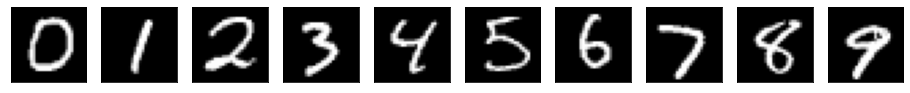

In [38]:
show_images_by_class(mnist_testset, cmap='gray')

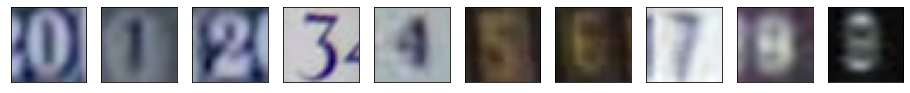

In [39]:
show_images_by_class(svhn_testset)

# Generator & Discriminator
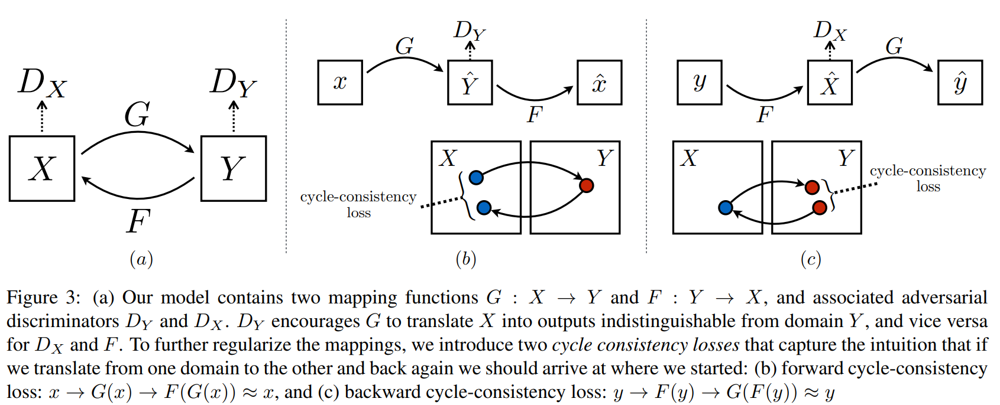<br><br>
**CycleGAN**은 2개의 Generator를 사용하여 cycle loss가 생성되는 것이 주요한 특징 중 하나입니다.

In [42]:
'''
코드 단순화를 위해 conv, deconv 함수들을 정의해 줍니다.

conv함수는 코드 단순화를 위한 convolution block 생성을 위한 함수입니다.
Conv -> Batchnorm -> Activation function 으로 이어지는 일련의 레이어를 생성합니다.

반면에 deconv함수는 코드 단순화를 위한 deconvolution block 생성을 위한 함수입니다.
Deconv -> Batchnorm -> Activation function 으로 이어지는 일련의 레이어를 생성합니다.
'''
def conv(c_in, c_out, k_size, stride=2, pad=1, bn=True, activation='relu'):
    layers = []
    
    # Conv layer
    layers.append(nn.Conv2d(c_in, c_out, k_size, stride, pad, bias=False))
    
    # Batch normalize
    if bn:
        layers.append(nn.BatchNorm2d(c_out))
        
    # Activation
    if activation == 'lrelu':
        layers.append(nn.LeakyReLU(0.2))
    elif activation == 'relu':
        layers.append(nn.ReLU())
    elif activation == 'tanh':
        layers.append(nn.Tanh())
    elif activation == 'none':
        pass
    
    return nn.Sequential(*layers)

def deconv(c_in, c_out, k_size, stride=2, pad=1, bn=True, activation='lrelu'):
    
    layers = []
    
    # Deconv.
    layers.append(nn.ConvTranspose2d(c_in, c_out, k_size, stride, pad, bias=False))
    
    # Batchnorm
    if bn:
        layers.append(nn.BatchNorm2d(c_out))
    
    # Activation
    if activation == 'lrelu':
        layers.append(nn.LeakyReLU(0.2))
    elif activation == 'relu':
        layers.append(nn.ReLU())
    elif activation == 'tanh':
        layers.append(nn.Tanh())
    elif activation == 'none':
        pass
                
    return nn.Sequential(*layers)

Generator와 Discriminator를 선언해 줍니다.<br> 
이 때 MNIST는 흑백 이미지이므로 채널이 1이라는 점과 SVHN은 컬러 이미지이므로 채널이 3이라는 것에 주의합니다!!! 

In [44]:
# Encoder, Decoder 기반의 Generator
class Generator(nn.Module):
    def __init__(self, in_dim=1, out_dim=3):
        super(Generator,self).__init__()
        
        # Encoding blocks
        self.conv1 = conv(c_in=in_dim, c_out=64, k_size=4) 
        self.conv2 = conv(64, 64*2, 4)
        
        # Intermediate blocks
        self.conv3 = conv(64*2, 64*2, 3, 1, 1)
        self.conv4 = conv(64*2, 64*2, 3, 1, 1)
        
        # Decoding blocks
        self.deconv1 = deconv(64*2, 64, 4)
        self.deconv2 = deconv(64, out_dim , 4, bn='False', activation='tanh')
        
    def forward(self, x):
        out = self.conv1(x)      # (B, 64, 16, 16)
        out = self.conv2(out)    # (B, 128, 8, 8)
        
        out = self.conv3(out)    # (B, 128, 8, 8)
        out = self.conv4(out)    # (B, 128, 8, 8)
        
        out = self.deconv1(out)  # (B, 64, 16, 16)
        out = self.deconv2(out)  # (B, out_dim, 32, 32)
        return out

In [45]:
# 4개의 conv layer로 구성
class Discriminator(nn.Module):
    def __init__(self, in_dim=1):
        super(Discriminator,self).__init__()
        self.conv1 = conv(in_dim, 64, 4, bn=False)
        self.conv2 = conv(64, 64*2, 4)
        self.conv3 = conv(64*2, 64*4, 4)
        self.fc = conv(64*4, 1, 4, 1, 0, bn=False, activation='none')
        
    def forward(self, x):
        out = self.conv1(x)    # (B, 64, 16, 16)
        out = self.conv2(out)  # (B, 128, 8, 8)
        out = self.conv3(out)  # (B, 256, 4, 4)
        out = self.fc(out).squeeze() # batch size에서 1인 dim을 다 날려버린다!
        out = torch.sigmoid(out) # 0,1 binary classification
        return out

# CycleGAN Model

In [47]:
G_ms = Generator(in_dim=1, out_dim=3).train().cuda() # MNIST -> SVNH generator with train mode
G_sm = Generator(in_dim=3, out_dim=1).train().cuda() # SVNH -> MNIST generator with train mode
D_m = Discriminator(in_dim=1).train().cuda() # MNIST data 판별하는 discriminator
D_s = Discriminator(in_dim=3).train().cuda() # SVNH data 판별하는 dsicriminator

# Adam Optimizer 선언
g_optimizer = optim.Adam(list(G_ms.parameters()) + list(G_sm.parameters()), lr=0.0002, betas=(0.5, 0.99)) # G_ms, G_sm 모두 학습
d_optimizer = optim.Adam(list(D_m.parameters()) + list(D_s.parameters()), lr=0.0002, betas=(0.5, 0.99)) # D_m, D_s 모두 학습

# Fixed된 이미지를 프린팅하는 함수
def show_images(images):
    print_list = []
    for i in range(2):
        print_list += [images[0][i], images[1][i], images[2][i]]
  
    for i in range(2):
        print_list += [images[3][i], images[4][i], images[5][i]] 
    plt.figure(figsize=(8,14)) # 세로 사이즈 40, 가로 사이즈 20*3
  
    for a in range(1, 7):
        target_img = print_list[a-1]
        if target_img.shape[0] == 3:
            target_img = target_img.transpose(1, 2, 0)
            cmap = None
        else:
            target_img = target_img.transpose(1, 2, 0).squeeze()
            cmap = plt.cm.gray
        plt.subplot(4, 3, a)
        plt.imshow(target_img, cmap)
        plt.xticks([])
        plt.yticks([])
    for a in range(7, 13):
        target_img = print_list[a-1]
        if target_img.shape[0] == 3:
            target_img = target_img.transpose(1, 2, 0)
            cmap = None
        else:
            target_img = target_img.transpose(1, 2, 0).squeeze()
            cmap = plt.cm.gray
        plt.subplot(4, 3, a)
        plt.imshow(target_img, cmap)
        plt.xticks([])
        plt.yticks([])      
    plt.show()    

# Train CycleGAN

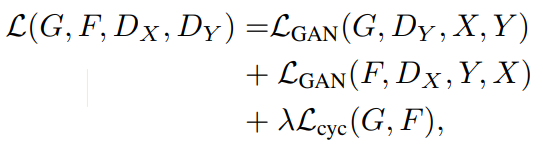
CycleGAN의 학습시 loss함수는 크게 4가지로 분류됩니다.
- D: Real images들을 1로 분류하기 위한 loss (d_loss_real)
- D: Fake images들을 0로 분류하기 위한 loss (d_loss_fake)
- G: D를 속이는 Fake images들을 만들기 위한 (D에서 1로 분류함) loss (g_loss (1))
- G: 다시 돌아 갔을 때 reconstruction을 위한 cycle loss (g_loss (2))

Step[0/50000], d_real_loss: 0.0047, d_fake_loss: 0.0001, g_loss: 1.0501


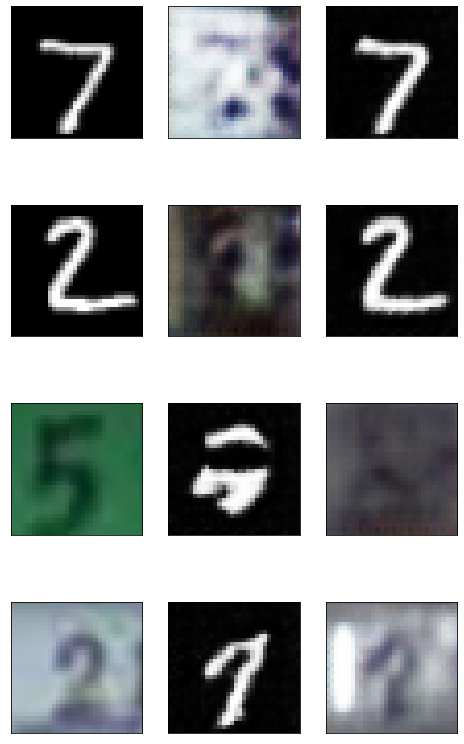

Step[200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0376, g_loss: 1.1583


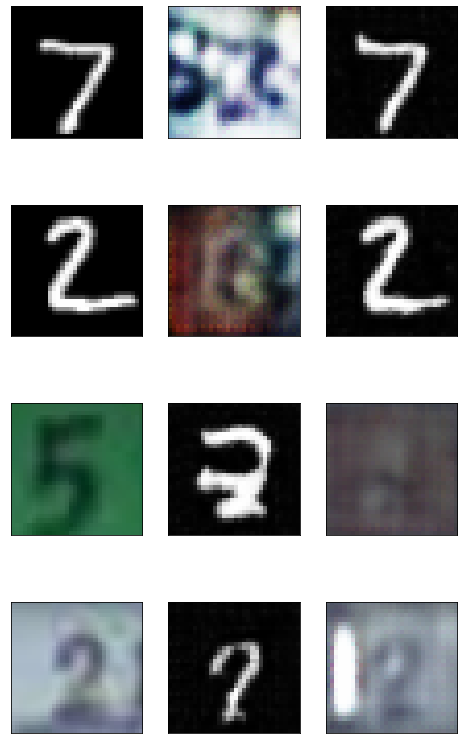

Step[400/50000], d_real_loss: 0.0137, d_fake_loss: 0.0038, g_loss: 1.0211


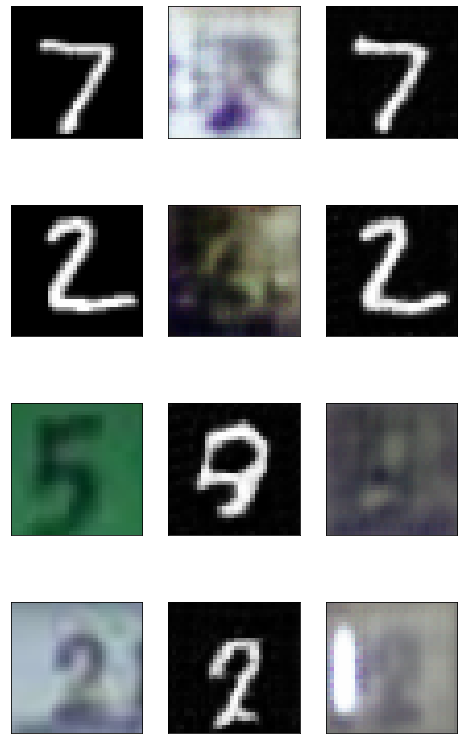

Step[600/50000], d_real_loss: 0.0183, d_fake_loss: 0.0000, g_loss: 1.0487


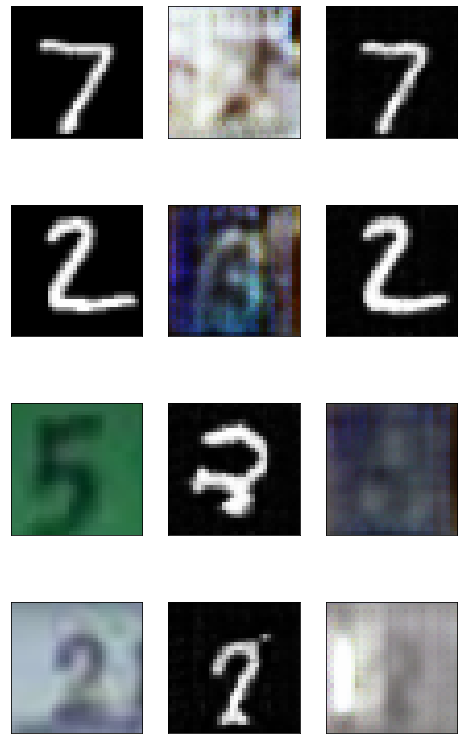

Step[800/50000], d_real_loss: 0.0235, d_fake_loss: 0.0003, g_loss: 1.0654


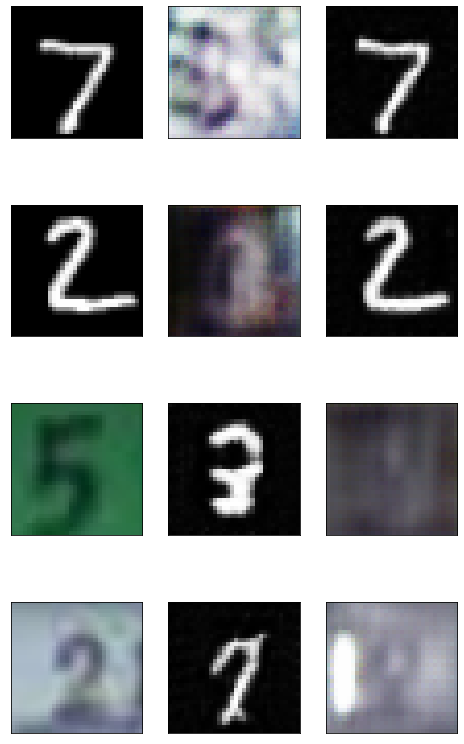

Step[1000/50000], d_real_loss: 0.0002, d_fake_loss: 0.0002, g_loss: 1.0779


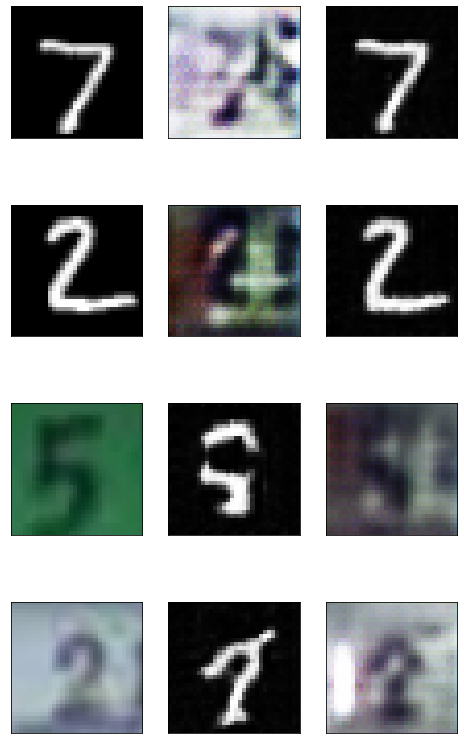

Step[1200/50000], d_real_loss: 0.5255, d_fake_loss: 0.0045, g_loss: 1.0540


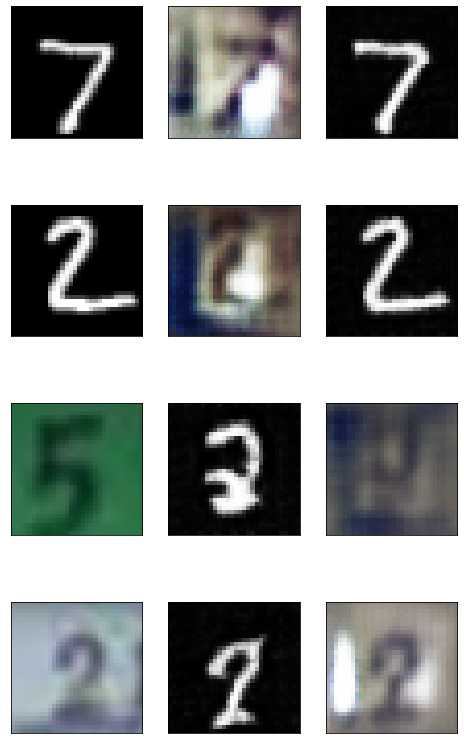

Step[1400/50000], d_real_loss: 0.0015, d_fake_loss: 0.0021, g_loss: 1.0778


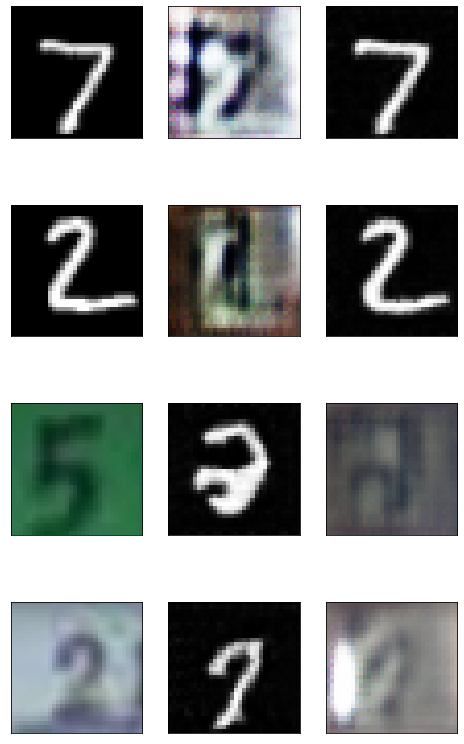

Step[1600/50000], d_real_loss: 0.0001, d_fake_loss: 0.0057, g_loss: 1.0574


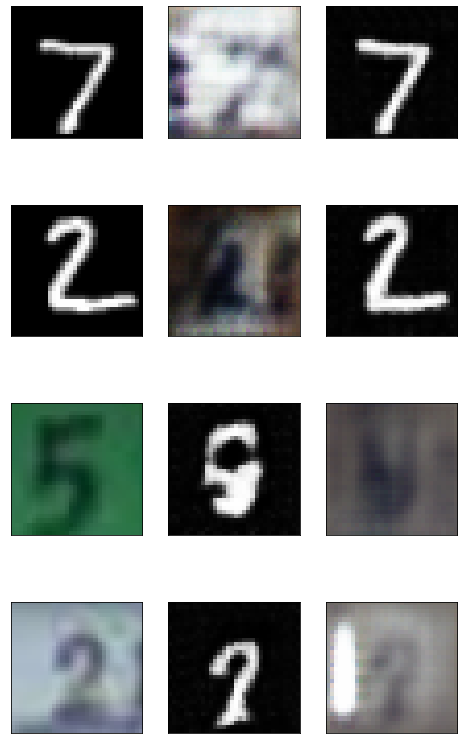

Step[1800/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.1069


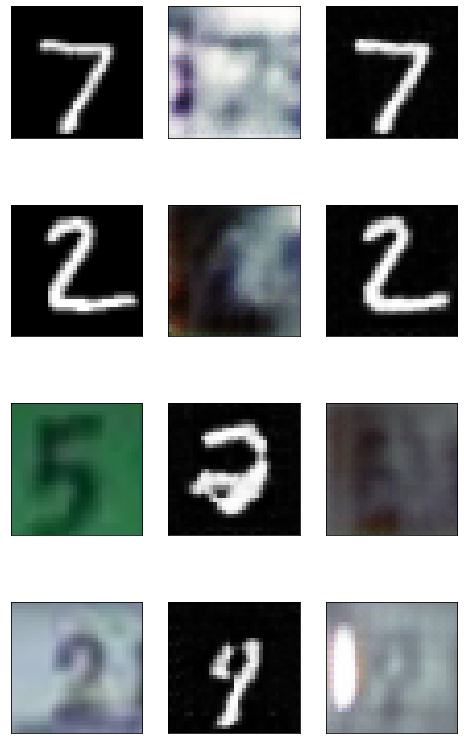

Step[2000/50000], d_real_loss: 0.0006, d_fake_loss: 0.0002, g_loss: 1.1702


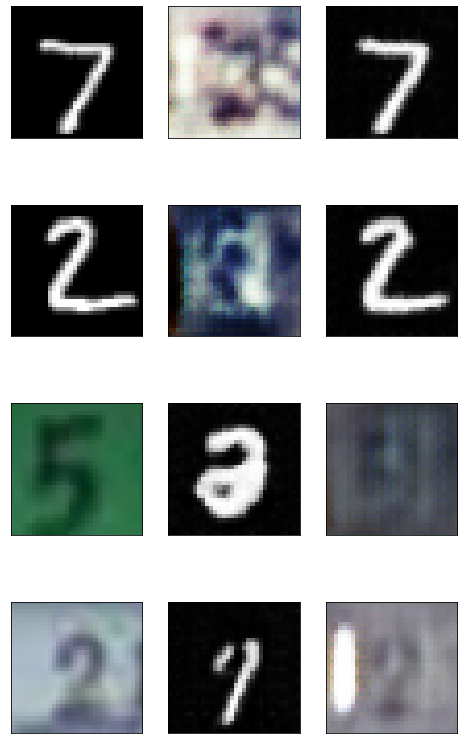

Step[2200/50000], d_real_loss: 0.0034, d_fake_loss: 0.0000, g_loss: 1.2103


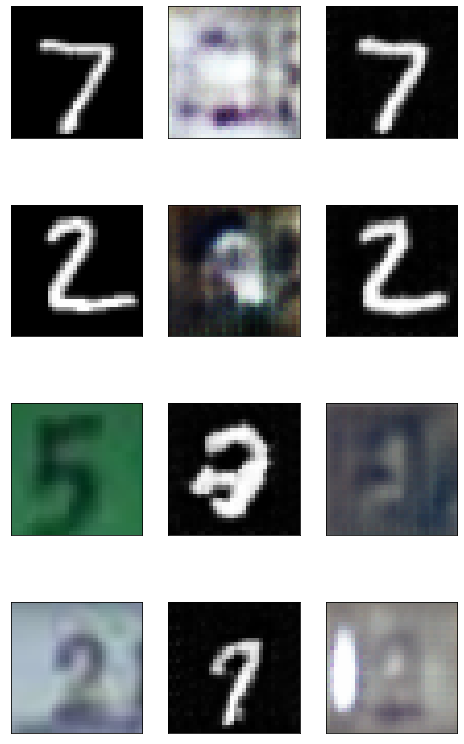

Step[2400/50000], d_real_loss: 0.0086, d_fake_loss: 0.0004, g_loss: 1.1244


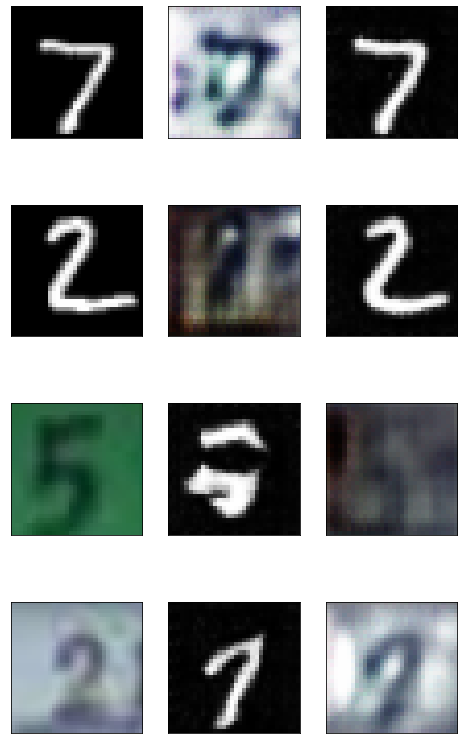

Step[2600/50000], d_real_loss: 0.0155, d_fake_loss: 0.0009, g_loss: 1.0325


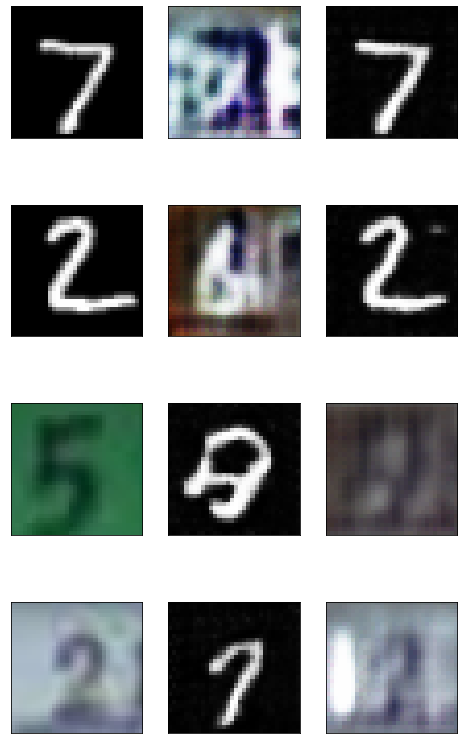

Step[2800/50000], d_real_loss: 0.0162, d_fake_loss: 0.0000, g_loss: 1.1140


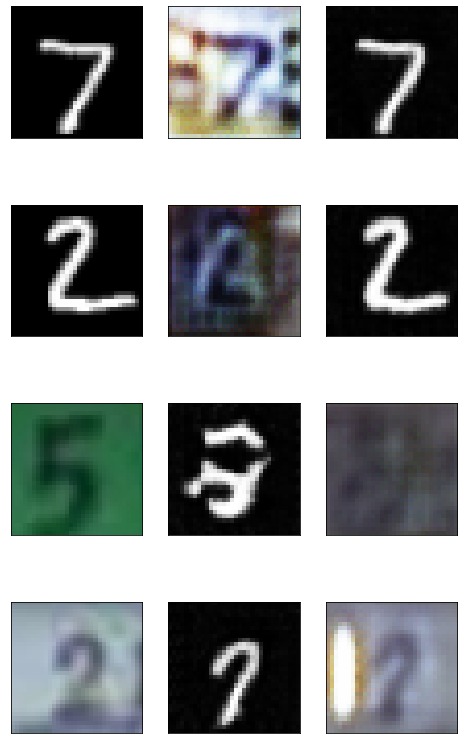

Step[3000/50000], d_real_loss: 0.0044, d_fake_loss: 0.0006, g_loss: 1.0513


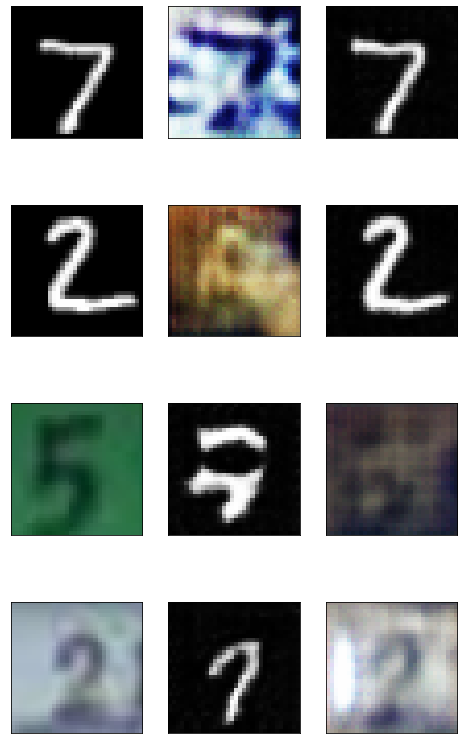

Step[3200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0221, g_loss: 1.0641


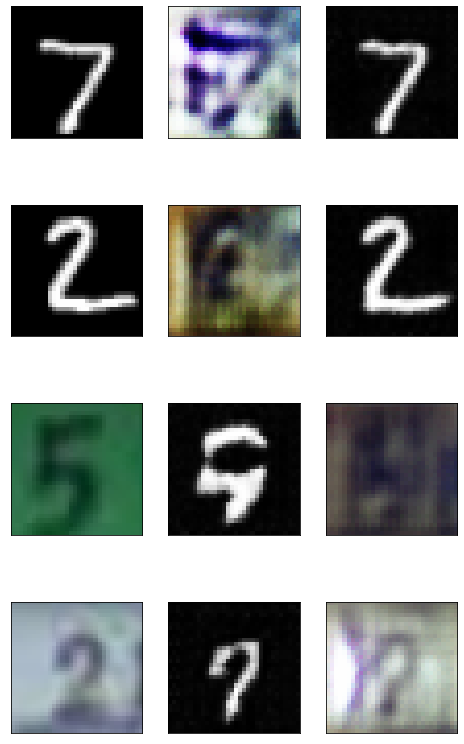

Step[3400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0005, g_loss: 1.0394


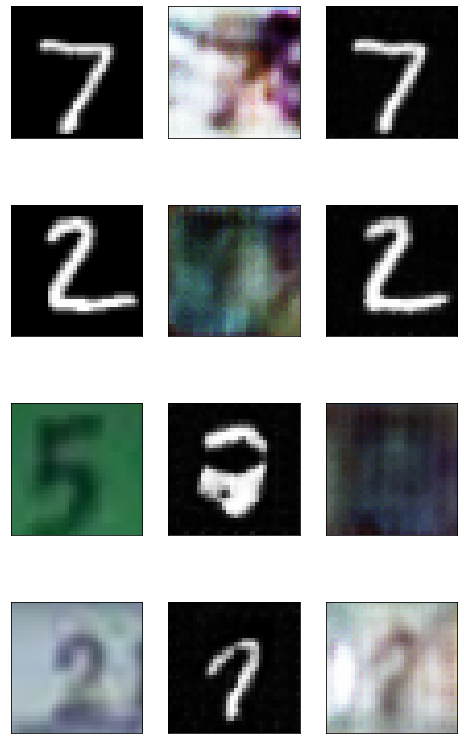

Step[3600/50000], d_real_loss: 0.0335, d_fake_loss: 0.0010, g_loss: 1.0267


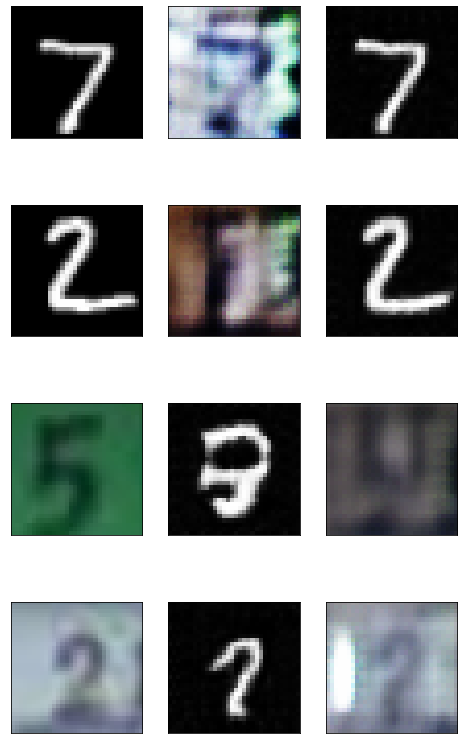

Step[3800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0013, g_loss: 1.1108


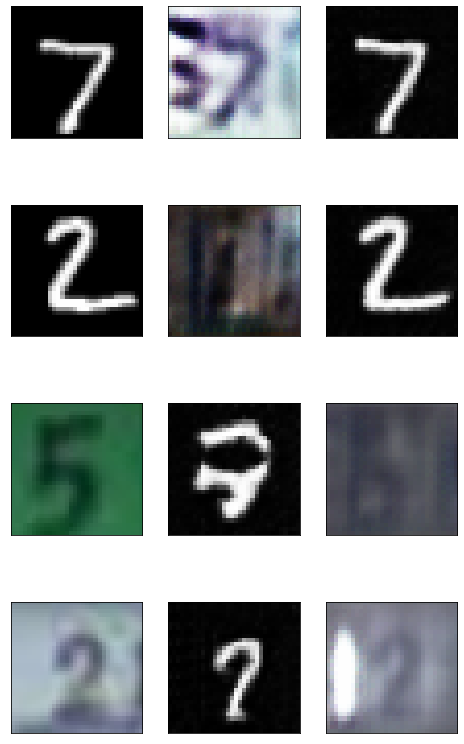

Step[4000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0199, g_loss: 1.0610


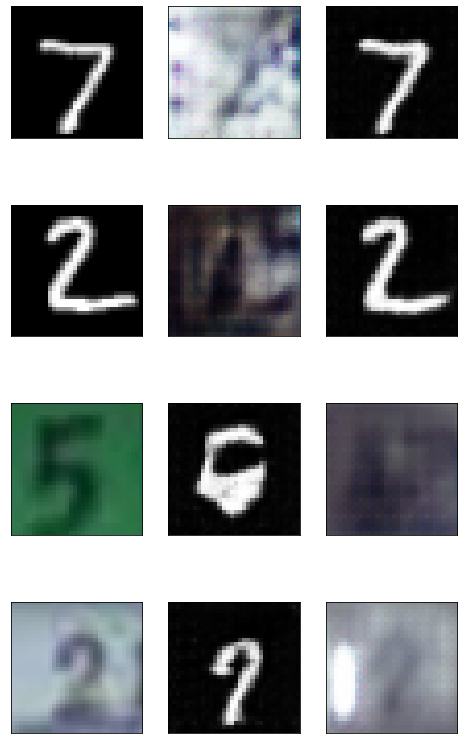

Step[4200/50000], d_real_loss: 0.0006, d_fake_loss: 0.0729, g_loss: 1.0634


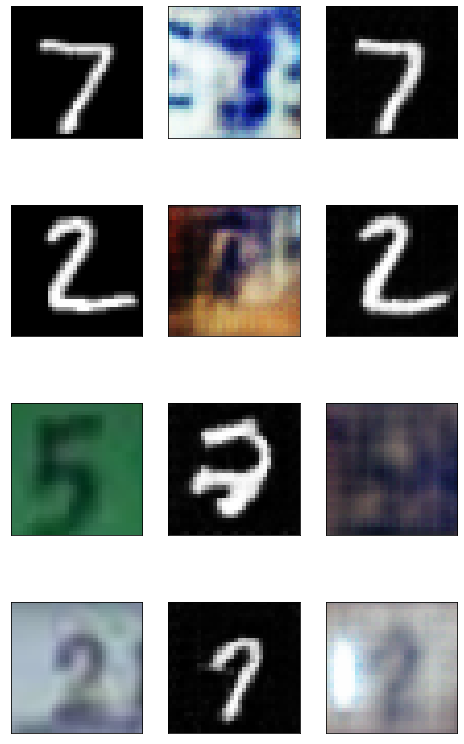

Step[4400/50000], d_real_loss: 0.0004, d_fake_loss: 0.0544, g_loss: 1.1088


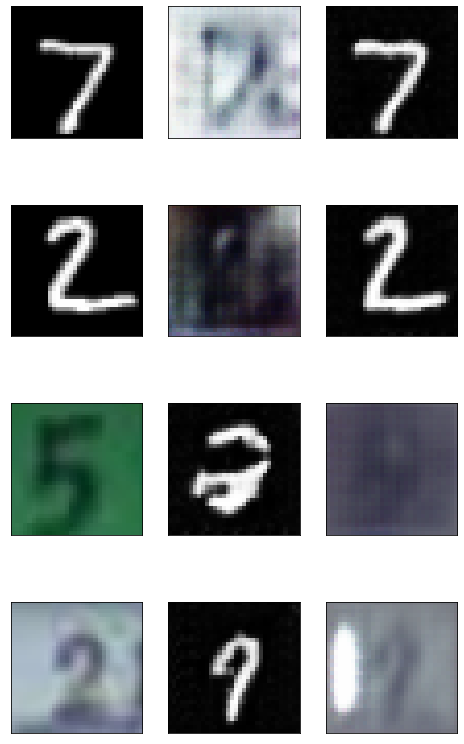

Step[4600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0005, g_loss: 1.2708


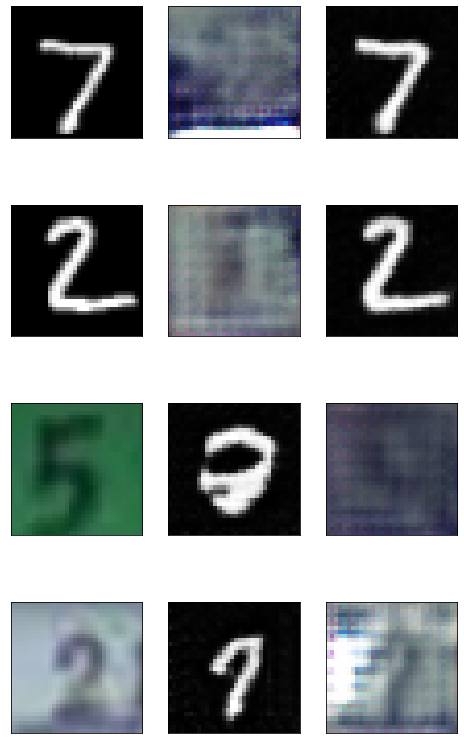

Step[4800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0660


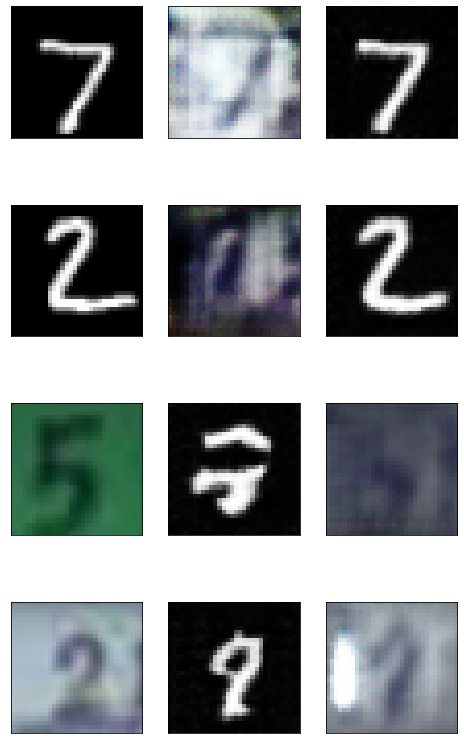

Step[5000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0003, g_loss: 1.0666


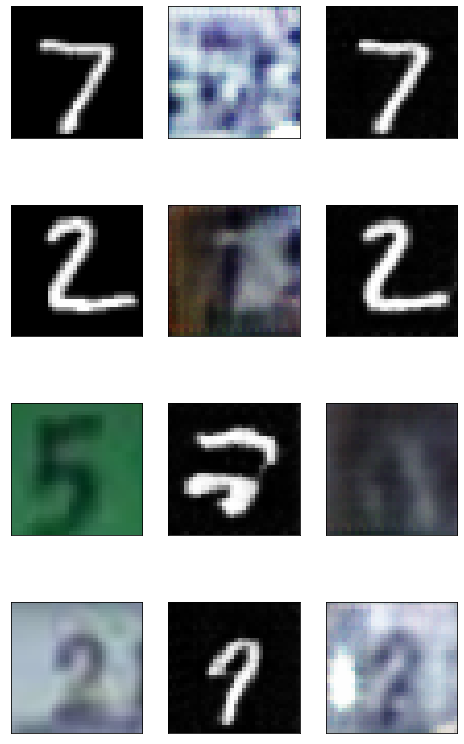

Step[5200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1724


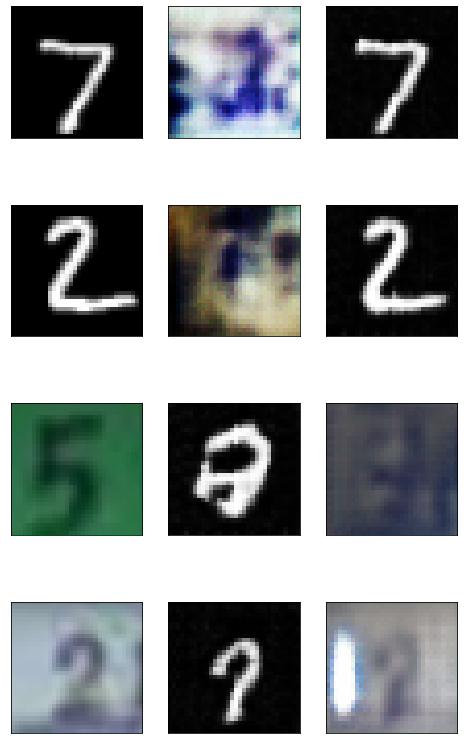

Step[5400/50000], d_real_loss: 0.0004, d_fake_loss: 0.0002, g_loss: 1.0637


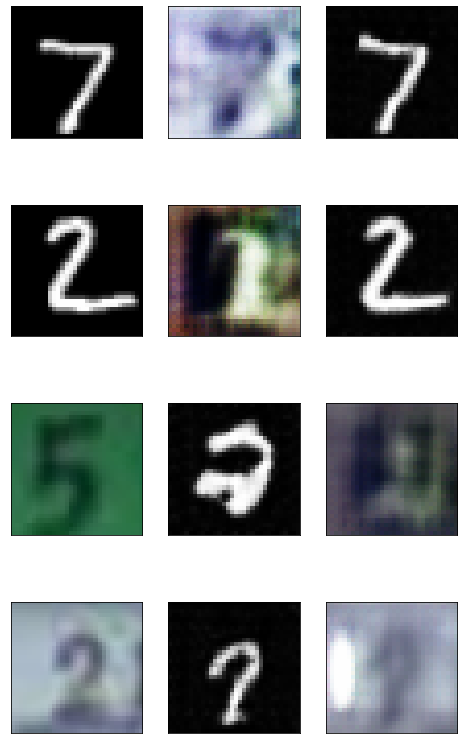

Step[5600/50000], d_real_loss: 0.0084, d_fake_loss: 0.0022, g_loss: 1.0575


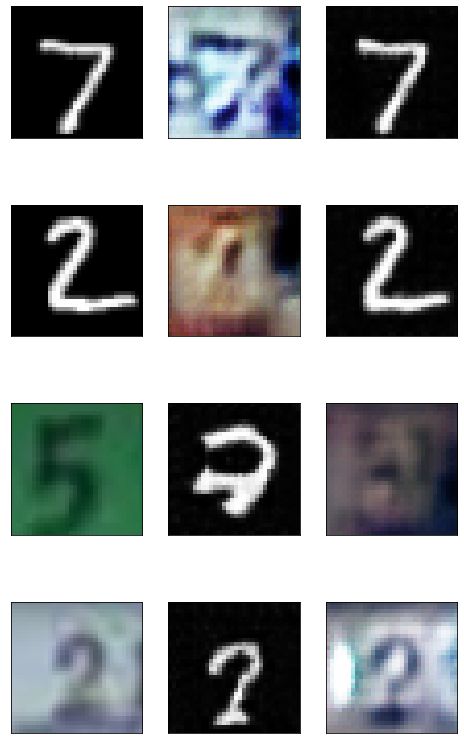

Step[5800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0003, g_loss: 1.0784


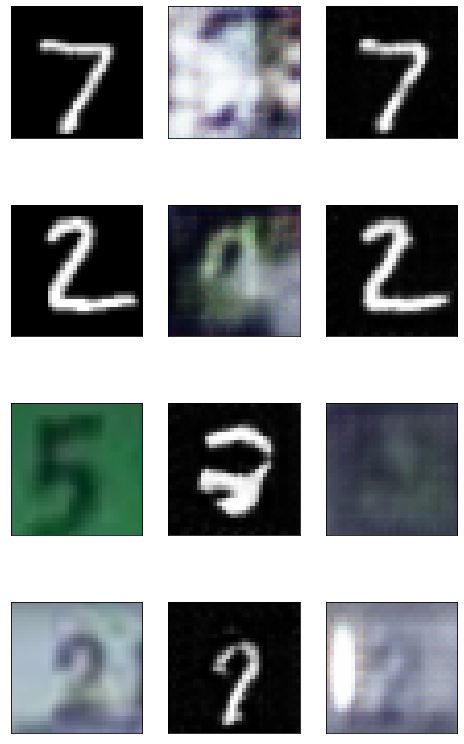

Step[6000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0077, g_loss: 1.0801


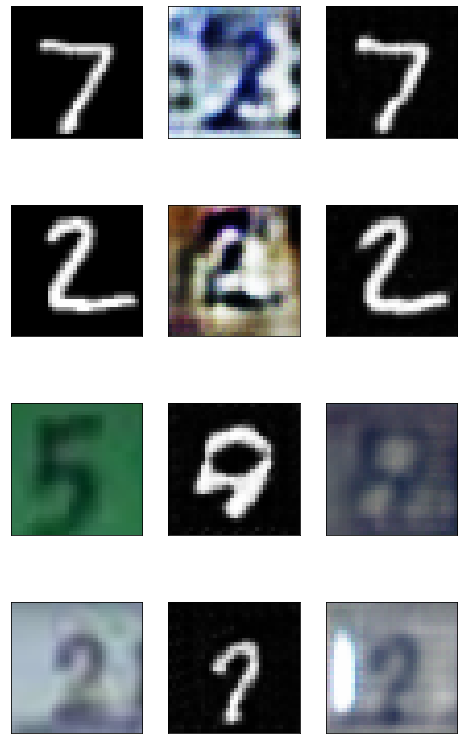

Step[6200/50000], d_real_loss: 0.0019, d_fake_loss: 0.0079, g_loss: 1.0262


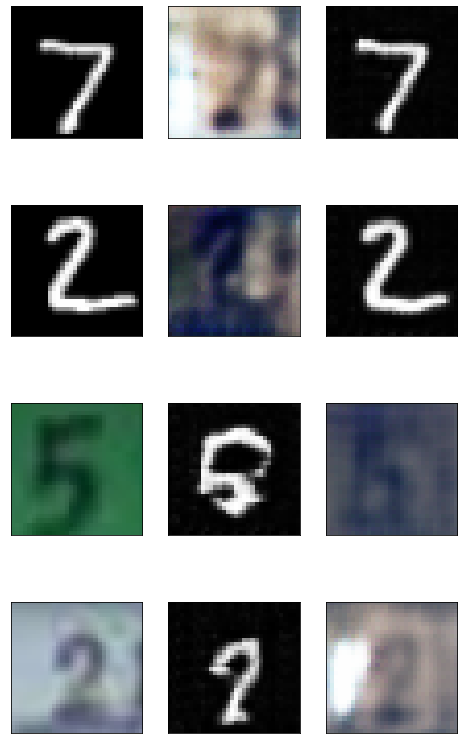

Step[6400/50000], d_real_loss: 0.0035, d_fake_loss: 0.0002, g_loss: 1.0805


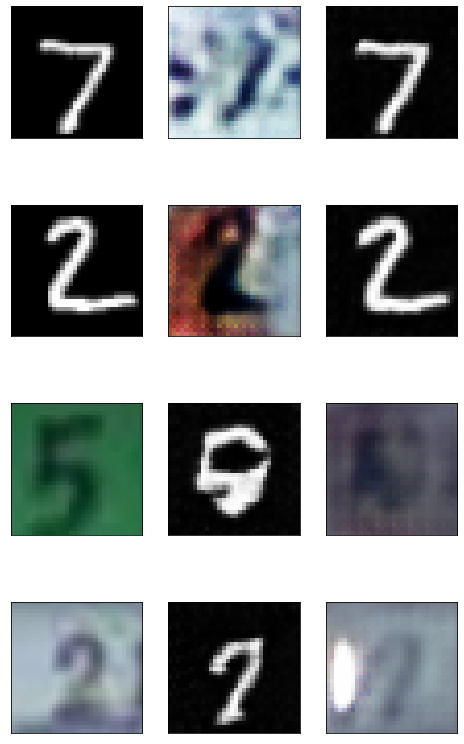

Step[6600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0019, g_loss: 1.0553


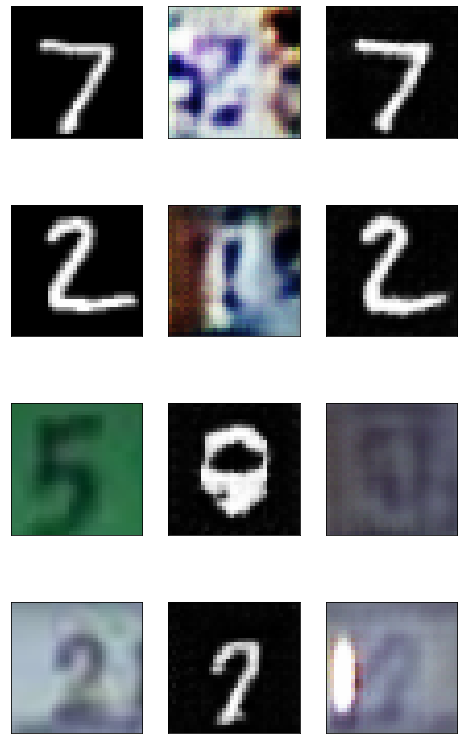

Step[6800/50000], d_real_loss: 0.0009, d_fake_loss: 0.0000, g_loss: 1.0916


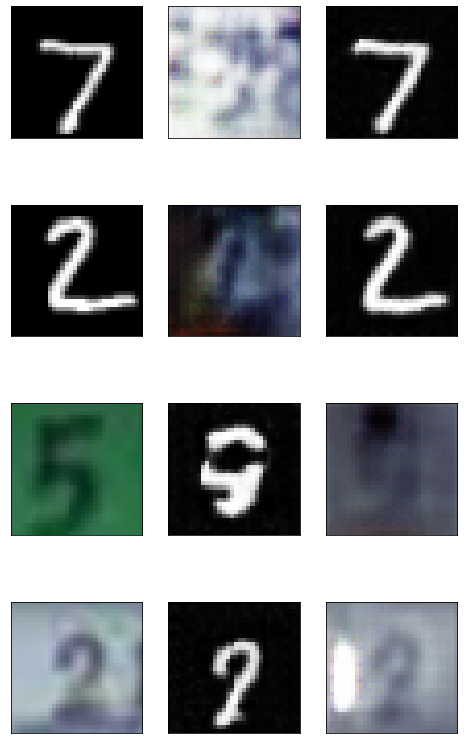

Step[7000/50000], d_real_loss: 0.0077, d_fake_loss: 0.0001, g_loss: 1.1736


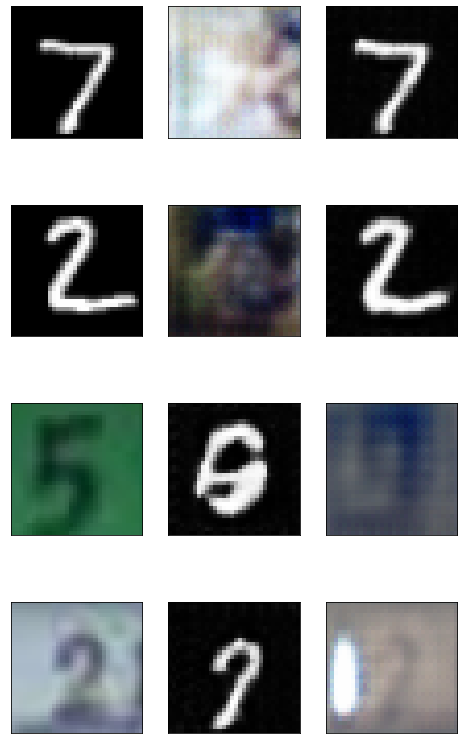

Step[7200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0003, g_loss: 1.2063


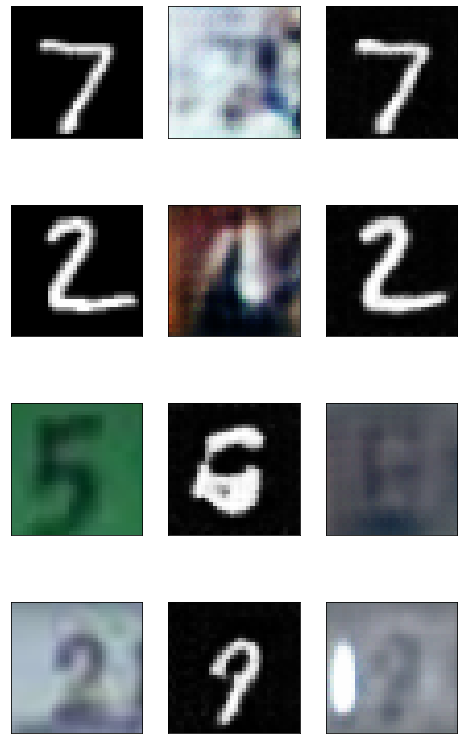

Step[7400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.1370


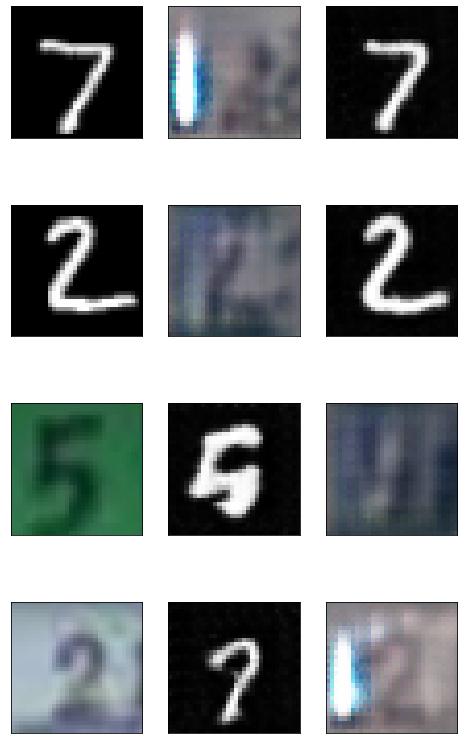

Step[7600/50000], d_real_loss: 0.0000, d_fake_loss: 0.4718, g_loss: 0.9830


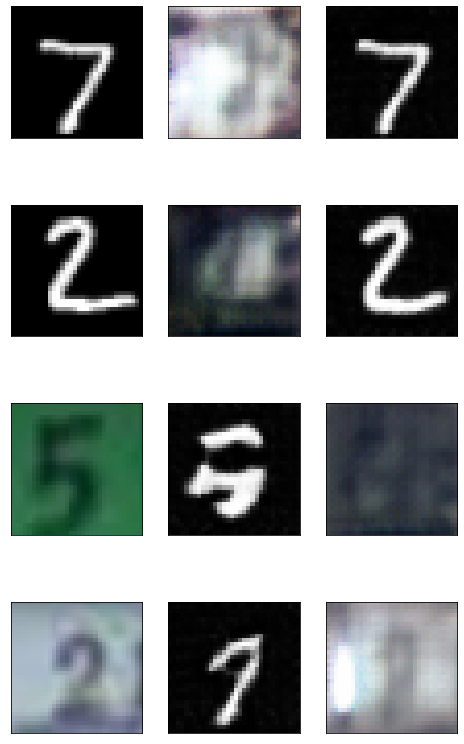

Step[7800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0911


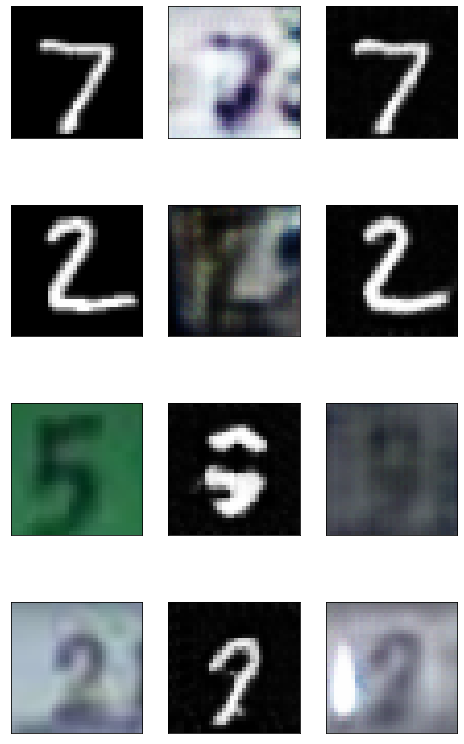

Step[8000/50000], d_real_loss: 0.0220, d_fake_loss: 0.0025, g_loss: 1.0425


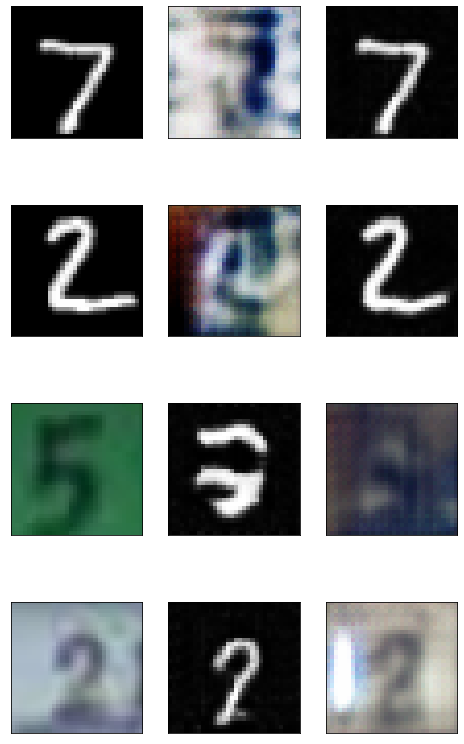

Step[8200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0771


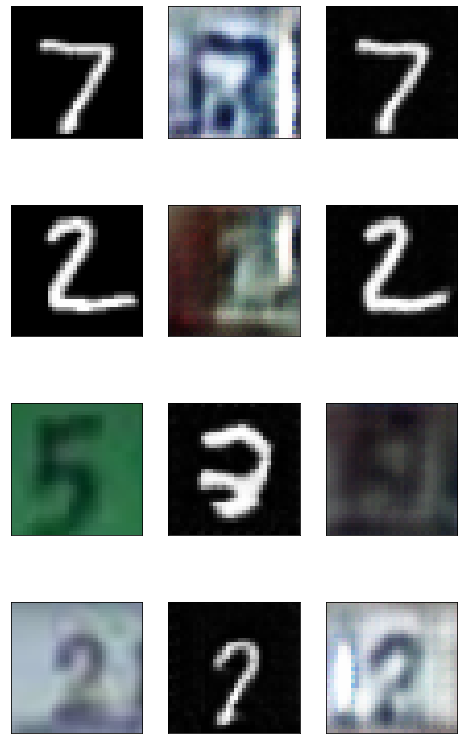

Step[8400/50000], d_real_loss: 0.0686, d_fake_loss: 0.0004, g_loss: 1.0266


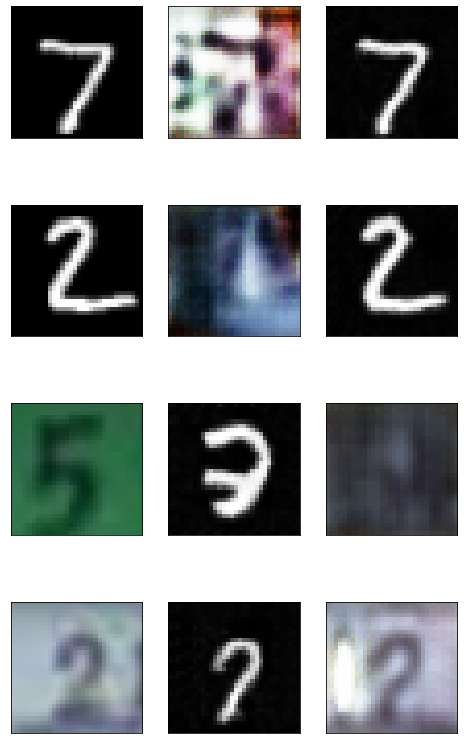

Step[8600/50000], d_real_loss: 0.0104, d_fake_loss: 0.0029, g_loss: 1.0422


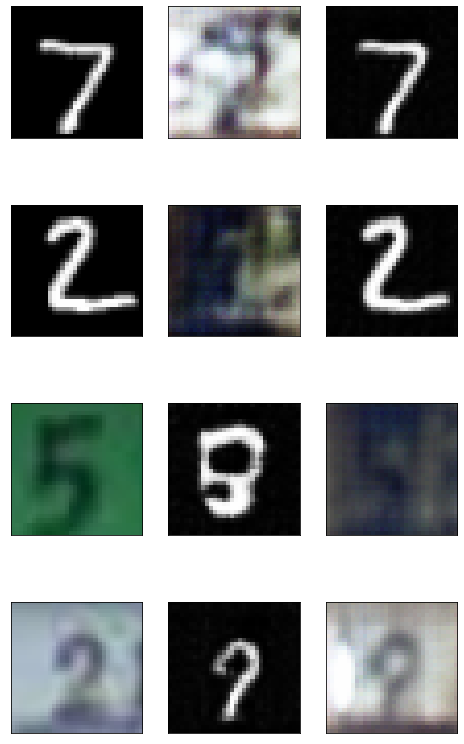

Step[8800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0019, g_loss: 1.1156


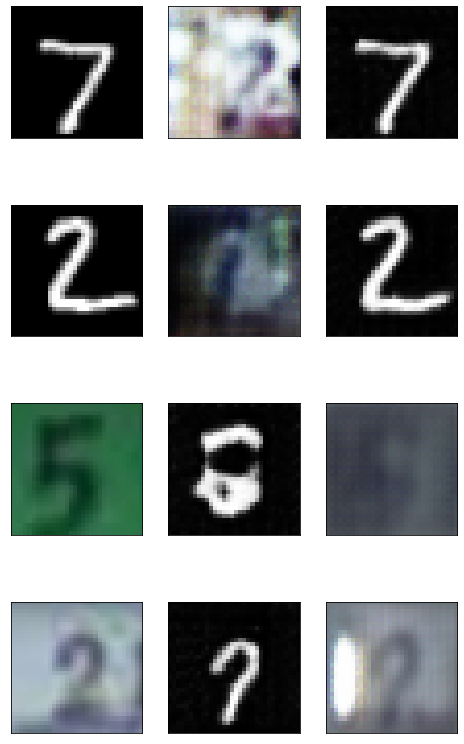

Step[9000/50000], d_real_loss: 0.0002, d_fake_loss: 0.0011, g_loss: 1.0752


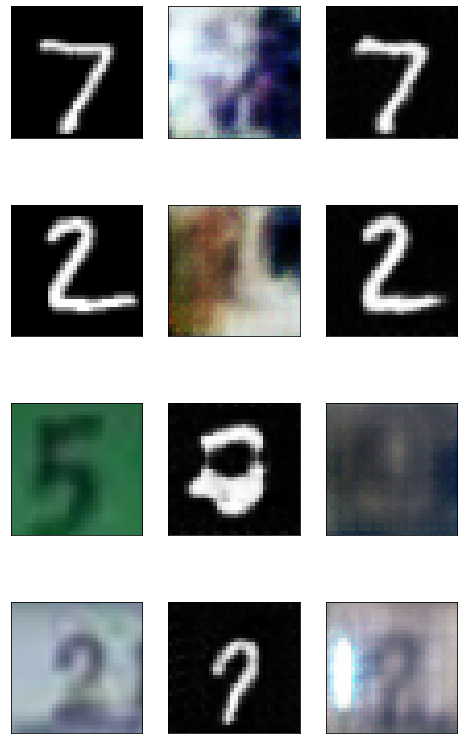

Step[9200/50000], d_real_loss: 0.4953, d_fake_loss: 0.0000, g_loss: 1.0627


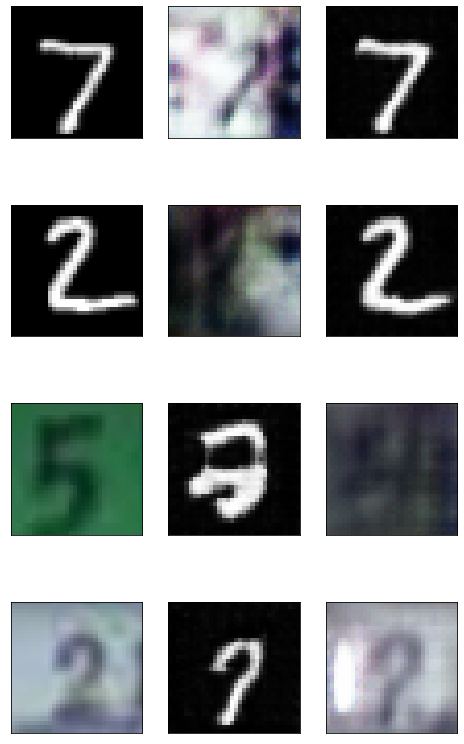

Step[9400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1319


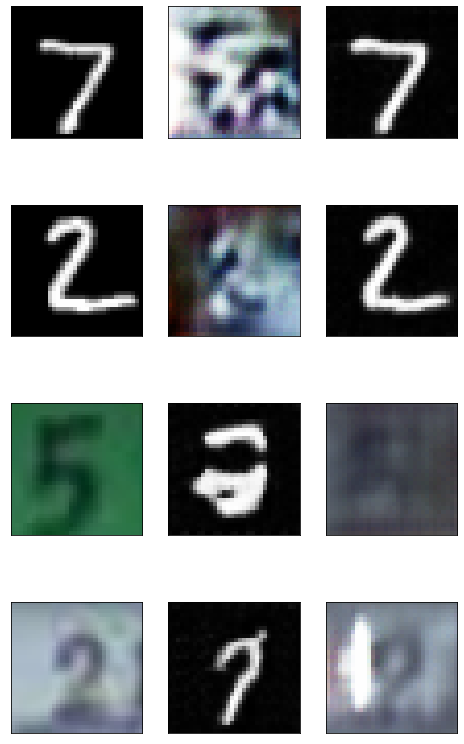

Step[9600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0044, g_loss: 1.2233


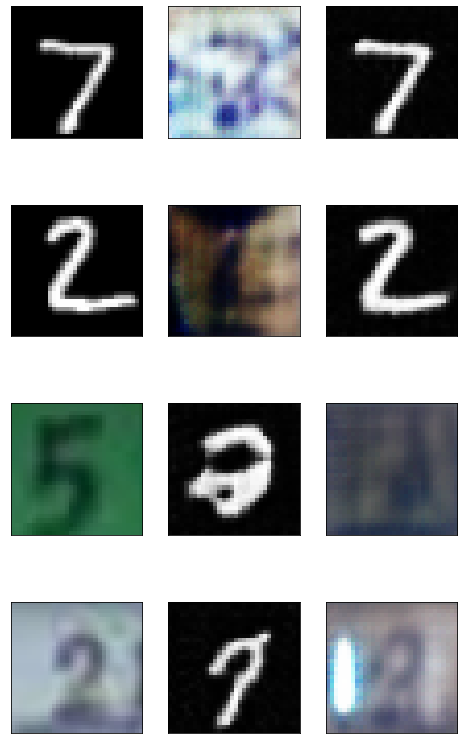

Step[9800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0581


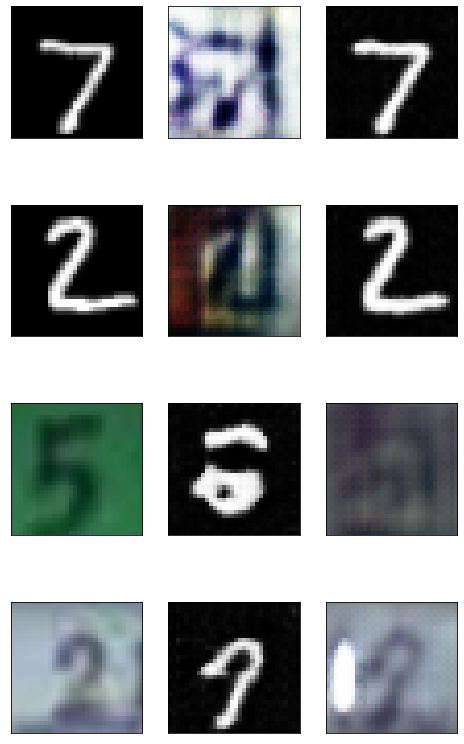

Step[10000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0630


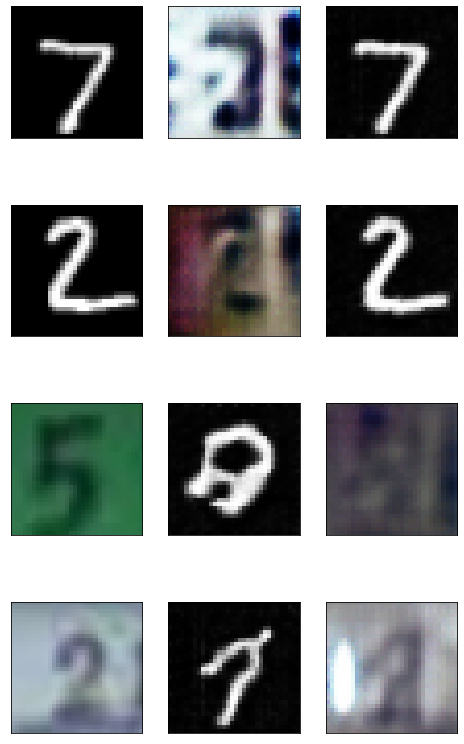

Step[10200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0002, g_loss: 1.1413


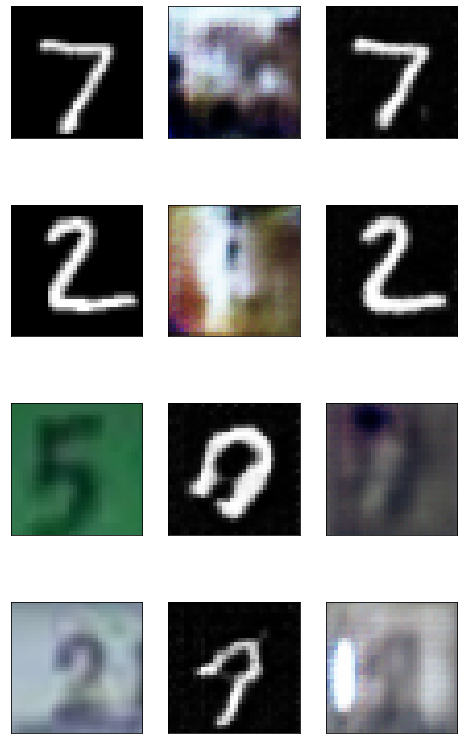

Step[10400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0017, g_loss: 1.0742


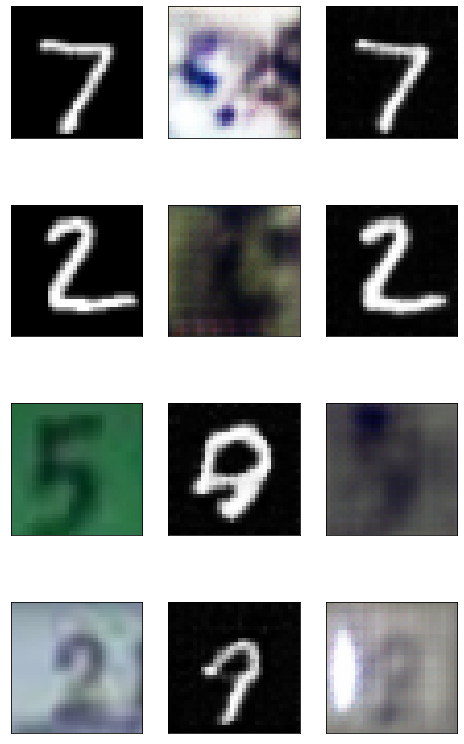

Step[10600/50000], d_real_loss: 0.0018, d_fake_loss: 0.0085, g_loss: 1.0413


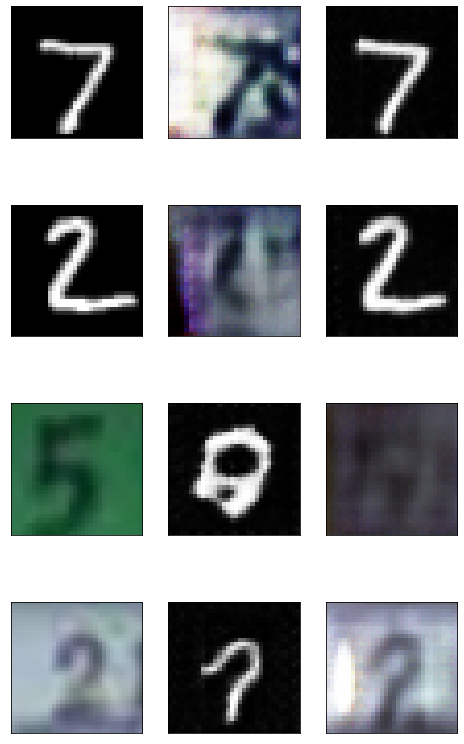

Step[10800/50000], d_real_loss: 0.0001, d_fake_loss: 0.0032, g_loss: 1.0686


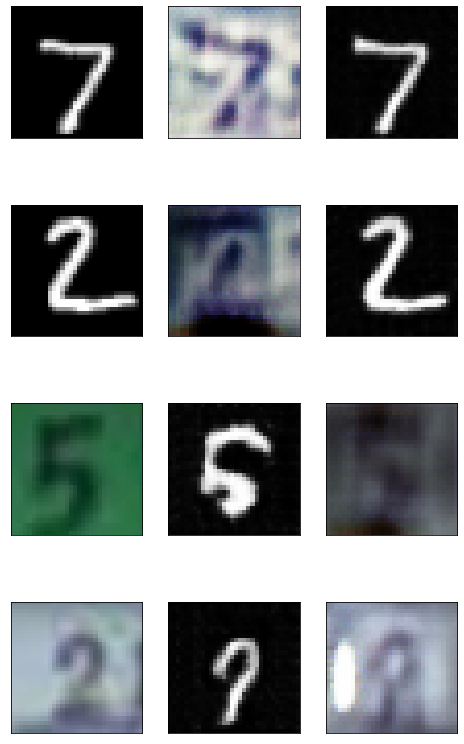

Step[11000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0020, g_loss: 1.0419


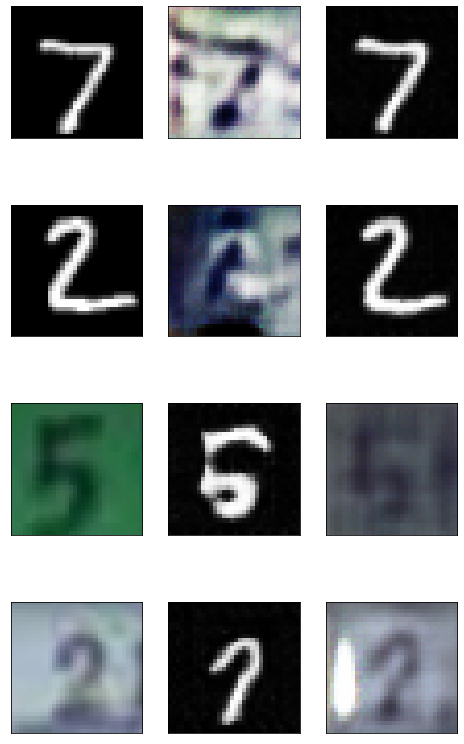

Step[11200/50000], d_real_loss: 0.0080, d_fake_loss: 0.0092, g_loss: 1.0593


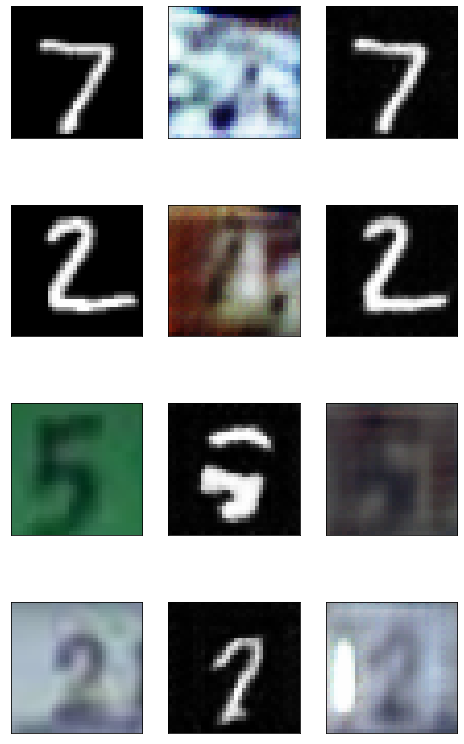

Step[11400/50000], d_real_loss: 0.0032, d_fake_loss: 0.0004, g_loss: 1.0612


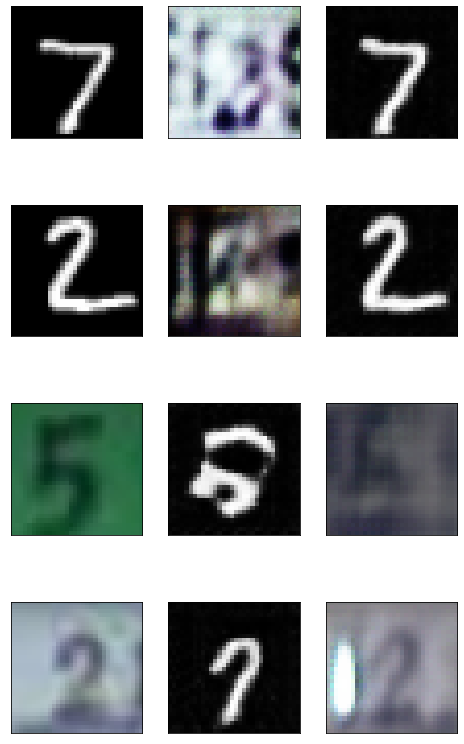

Step[11600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0003, g_loss: 1.0427


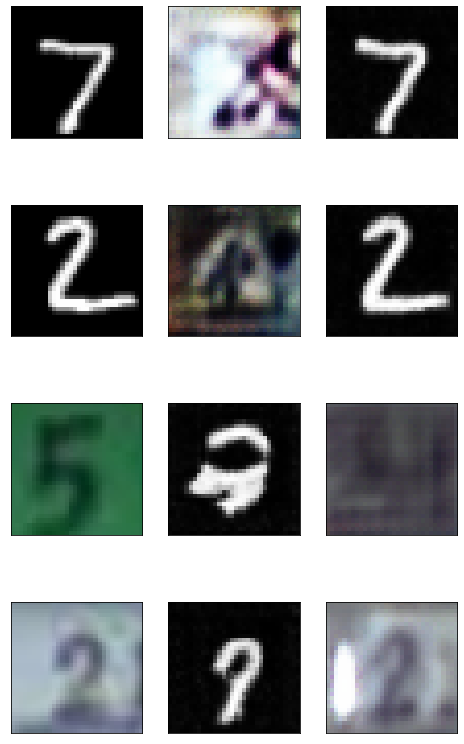

Step[11800/50000], d_real_loss: 0.0001, d_fake_loss: 0.0062, g_loss: 1.0708


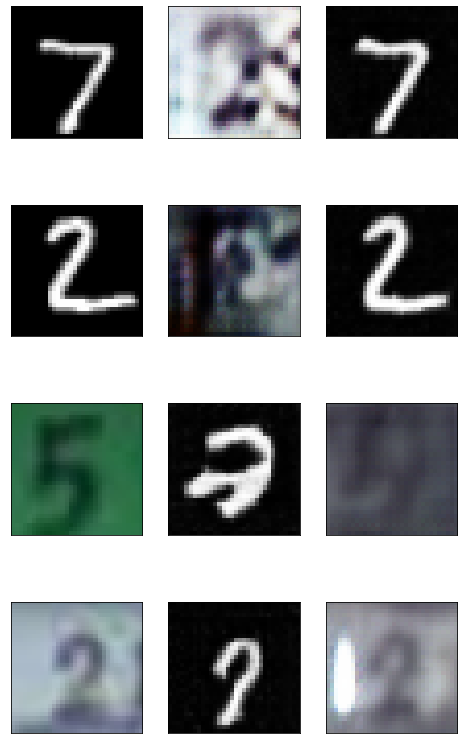

Step[12000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1137


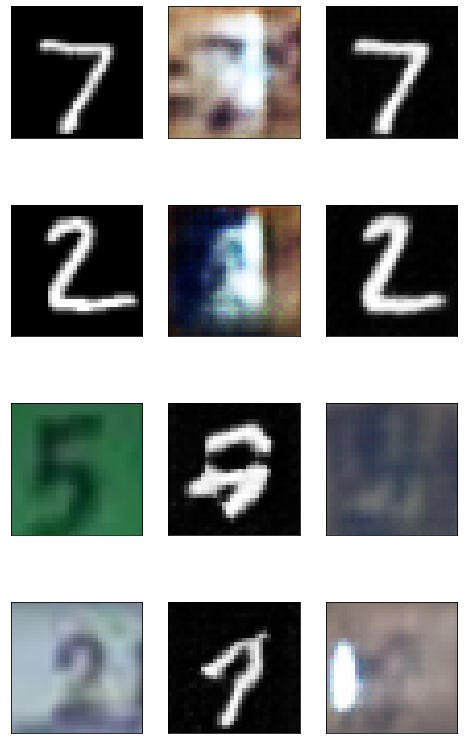

Step[12200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1803


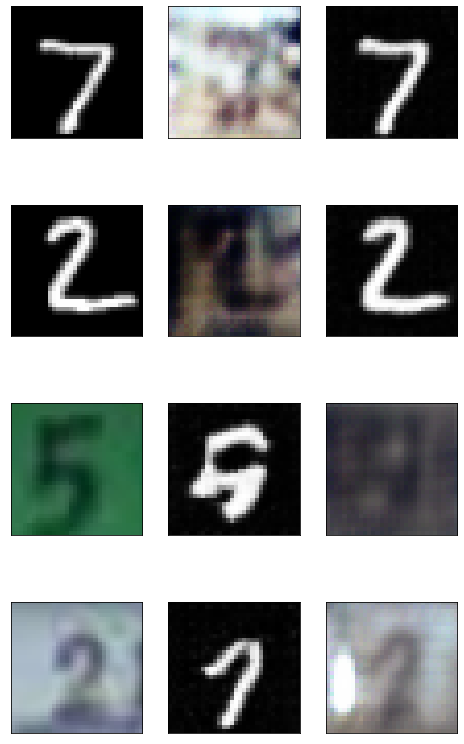

Step[12400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0047, g_loss: 1.0690


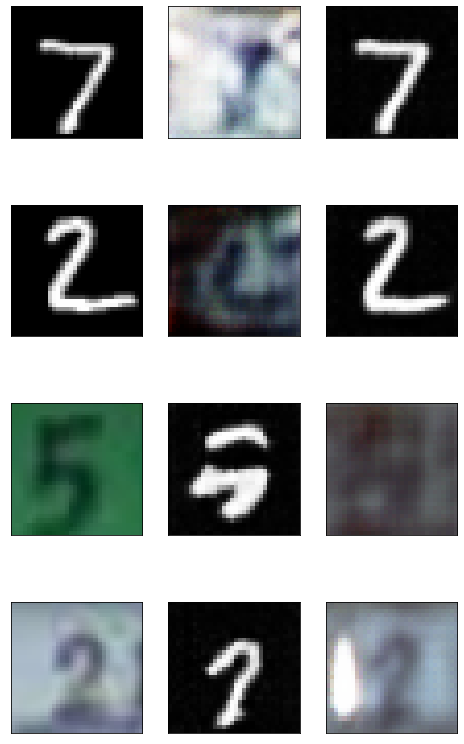

Step[12600/50000], d_real_loss: 0.0001, d_fake_loss: 0.0001, g_loss: 1.0337


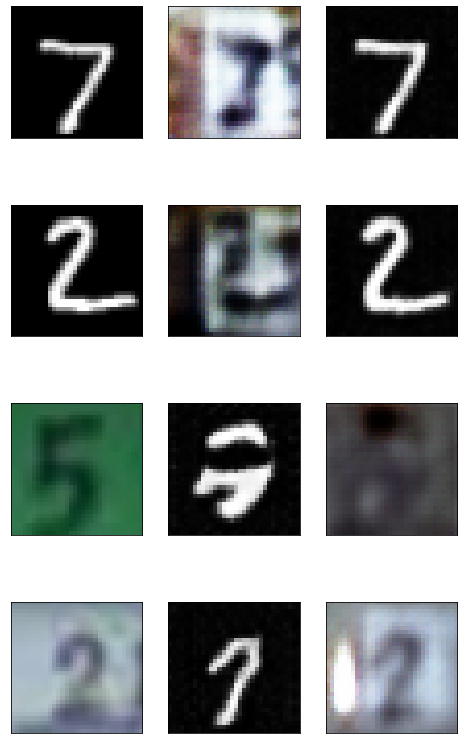

Step[12800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1175


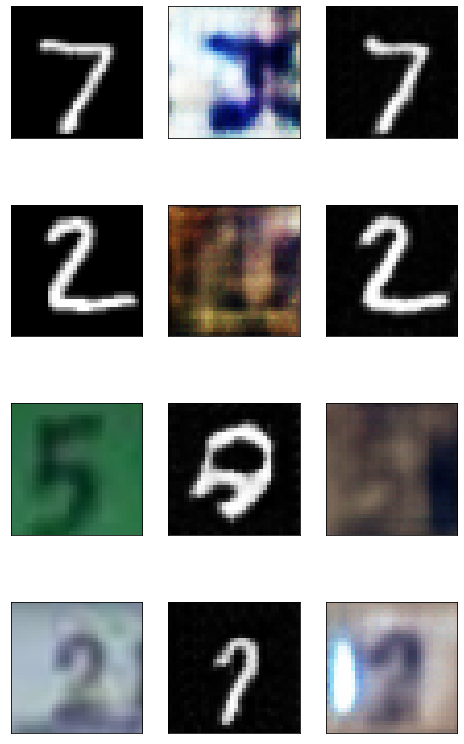

Step[13000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0418


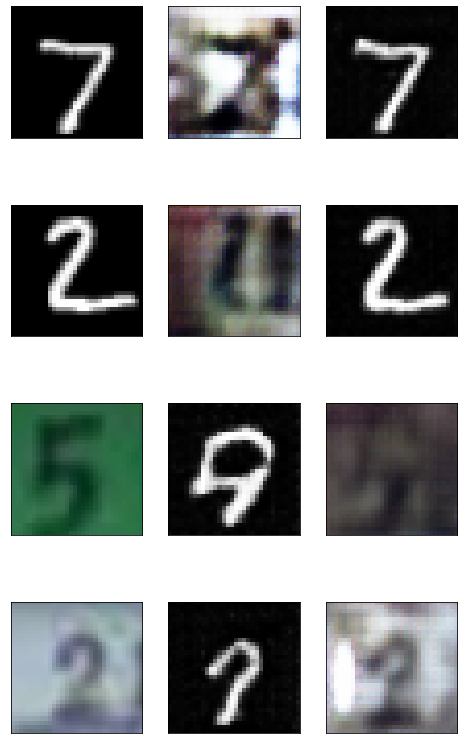

Step[13200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0710


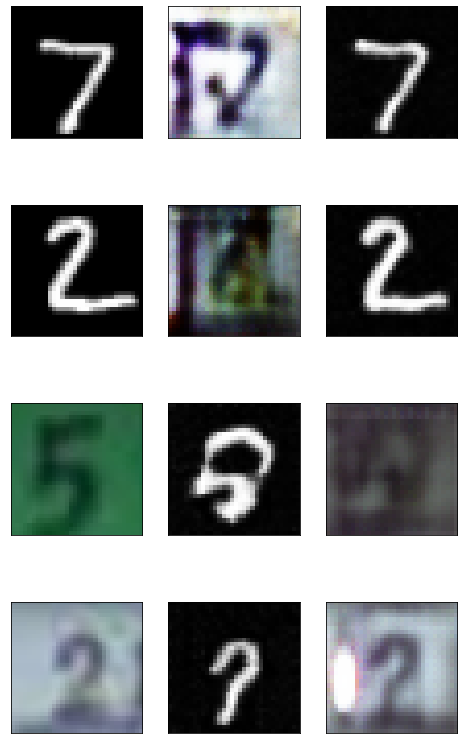

Step[13400/50000], d_real_loss: 0.0074, d_fake_loss: 0.0043, g_loss: 1.0503


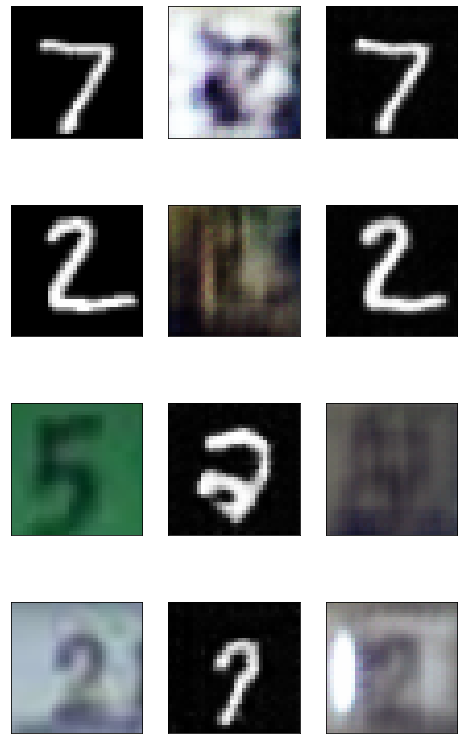

Step[13600/50000], d_real_loss: 0.0036, d_fake_loss: 0.0000, g_loss: 1.0412


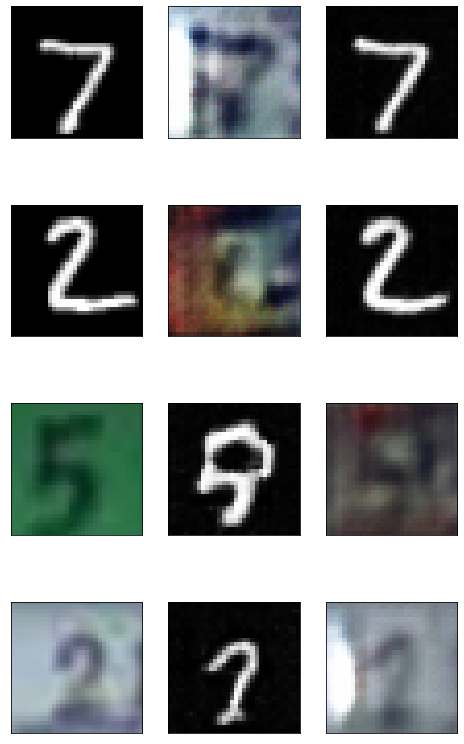

Step[13800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1249


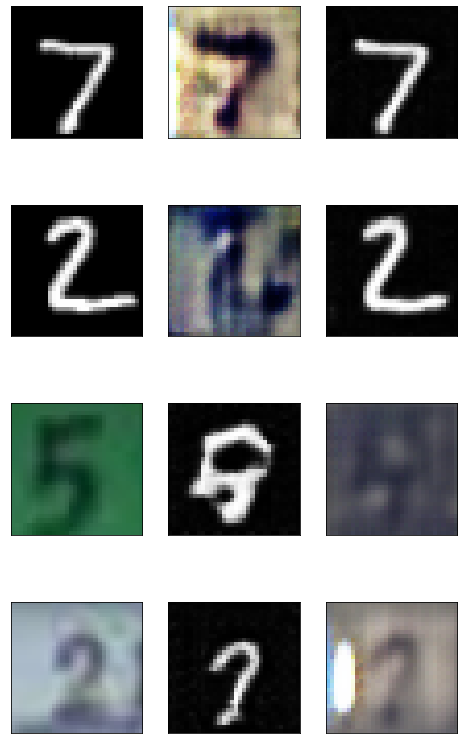

Step[14000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0002, g_loss: 1.0703


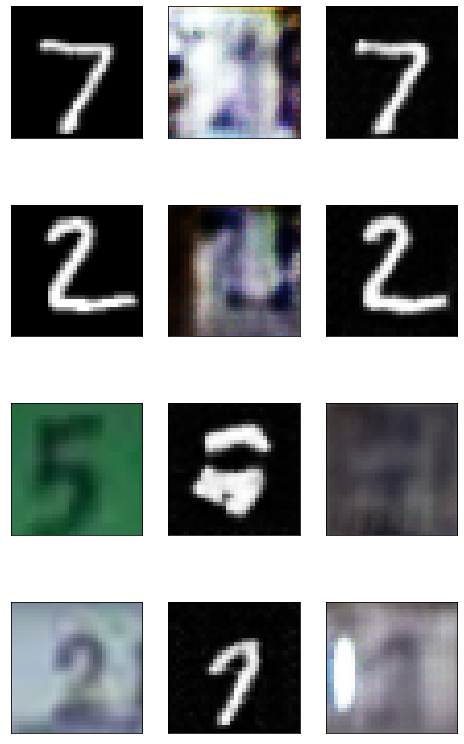

Step[14200/50000], d_real_loss: 0.0047, d_fake_loss: 0.0000, g_loss: 1.0402


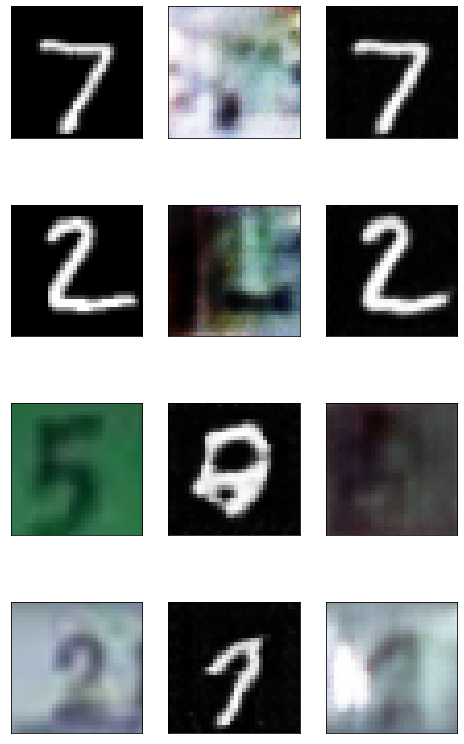

Step[14400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.1304


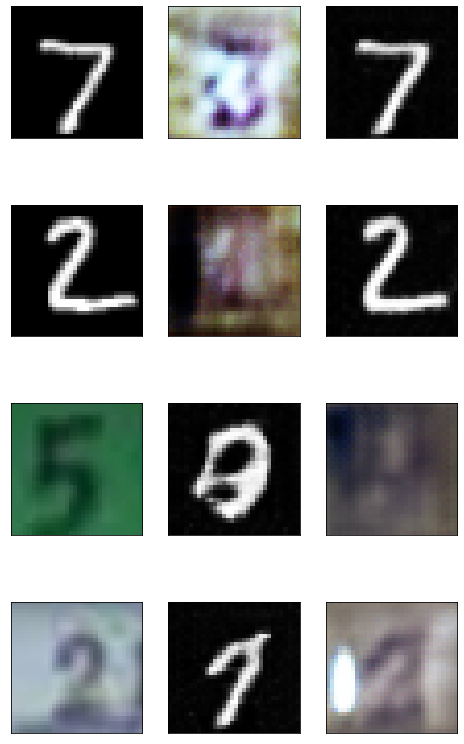

Step[14600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.2606


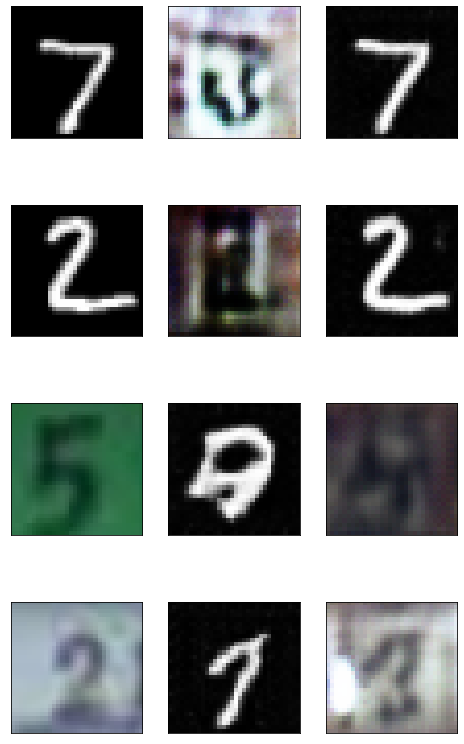

Step[14800/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.0458


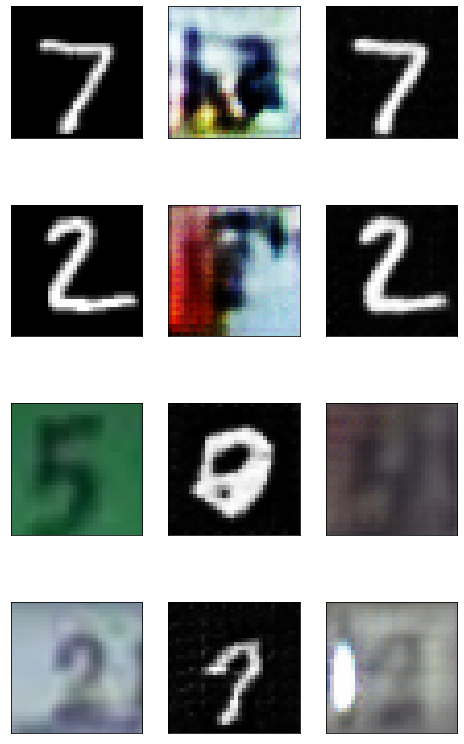

Step[15000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0475


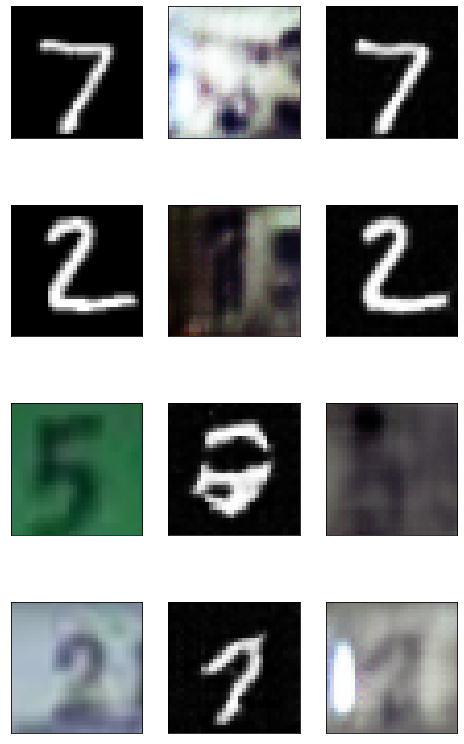

Step[15200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1187


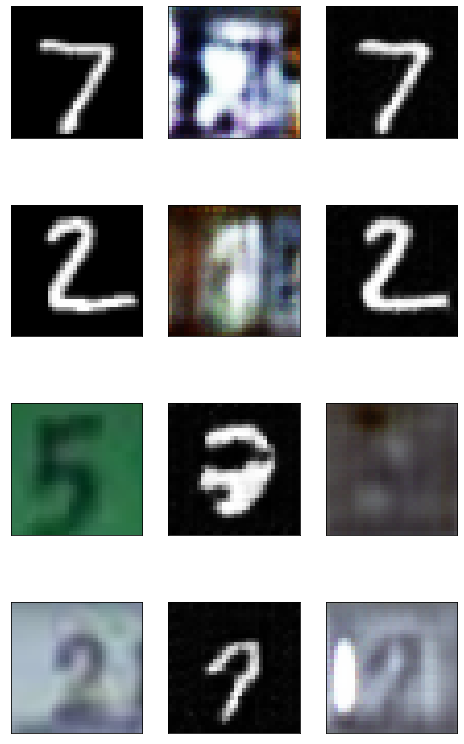

Step[15400/50000], d_real_loss: 0.0096, d_fake_loss: 0.0005, g_loss: 1.0854


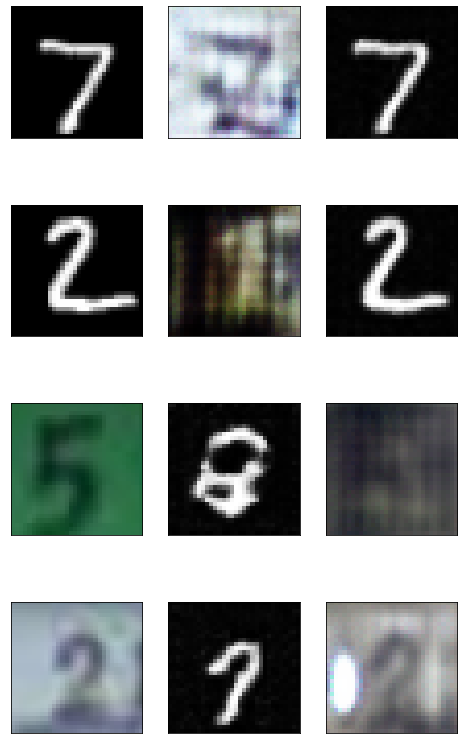

Step[15600/50000], d_real_loss: 0.2287, d_fake_loss: 0.0003, g_loss: 1.0361


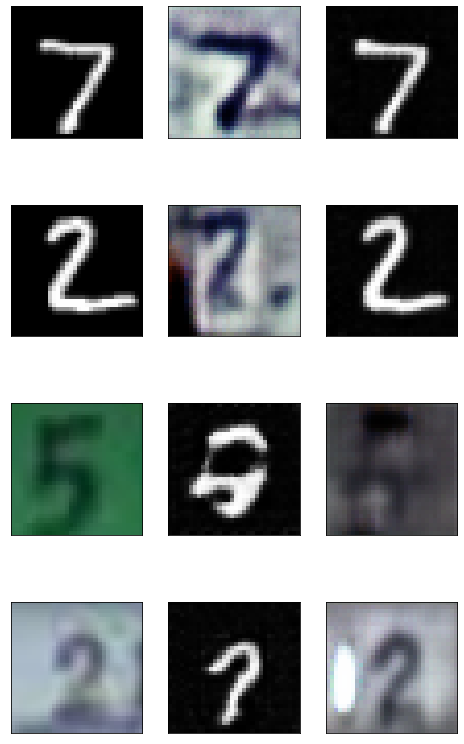

Step[15800/50000], d_real_loss: 0.0071, d_fake_loss: 0.0000, g_loss: 1.0466


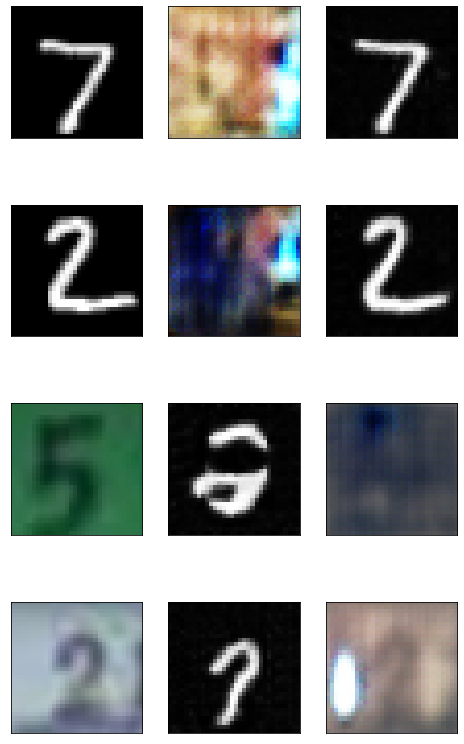

Step[16000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0519, g_loss: 1.0494


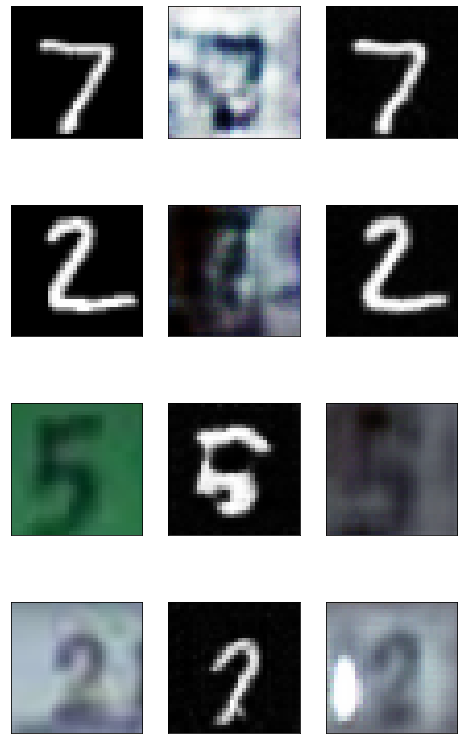

Step[16200/50000], d_real_loss: 0.0621, d_fake_loss: 0.0000, g_loss: 1.0535


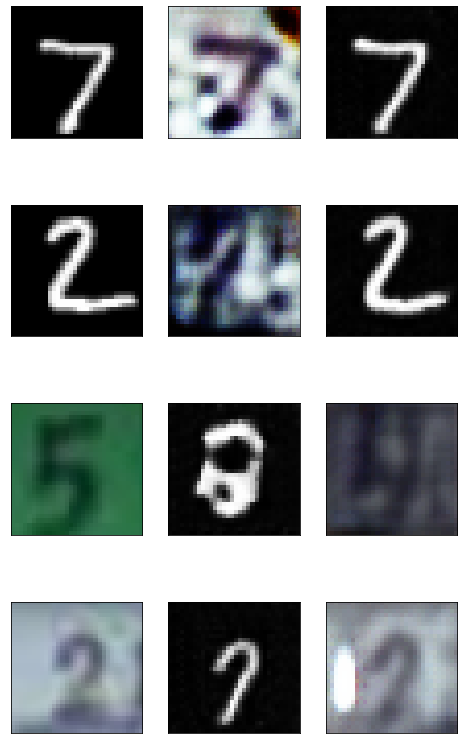

Step[16400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0084, g_loss: 1.0682


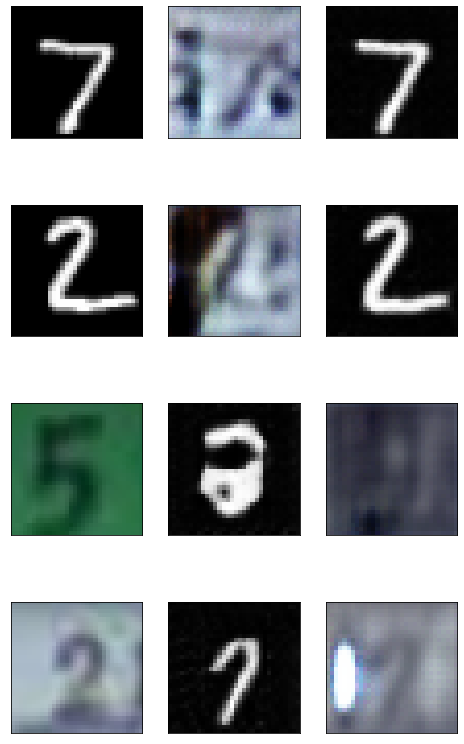

Step[16600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0314


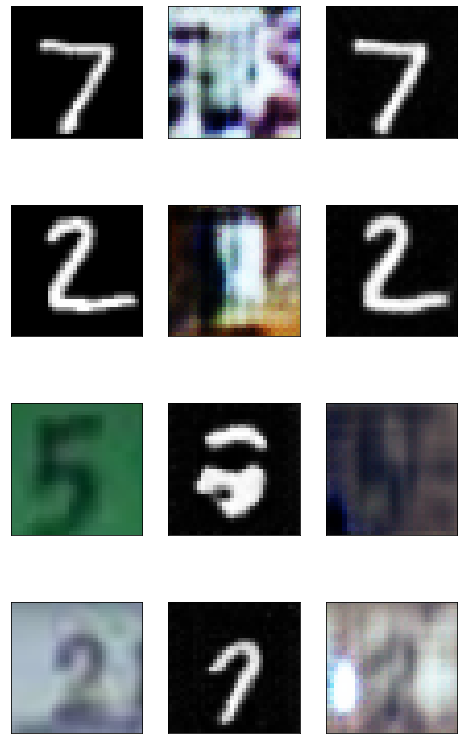

Step[16800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0008, g_loss: 1.0704


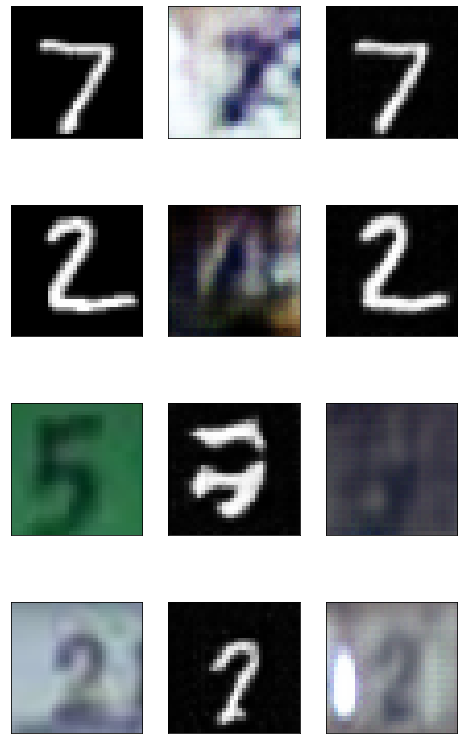

Step[17000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0076, g_loss: 1.1012


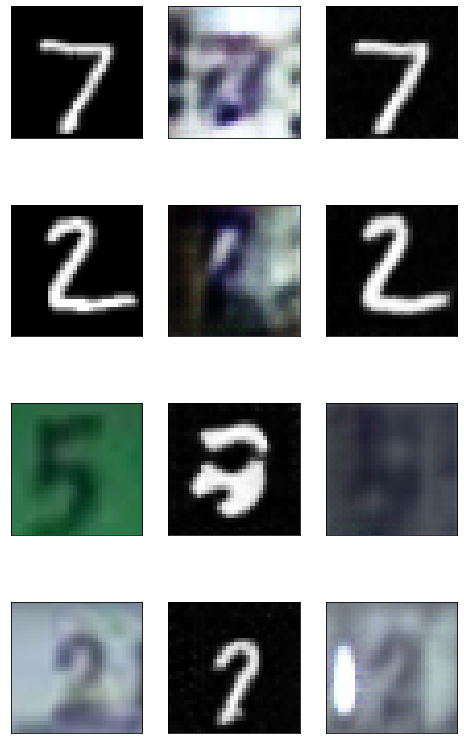

Step[17200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1433


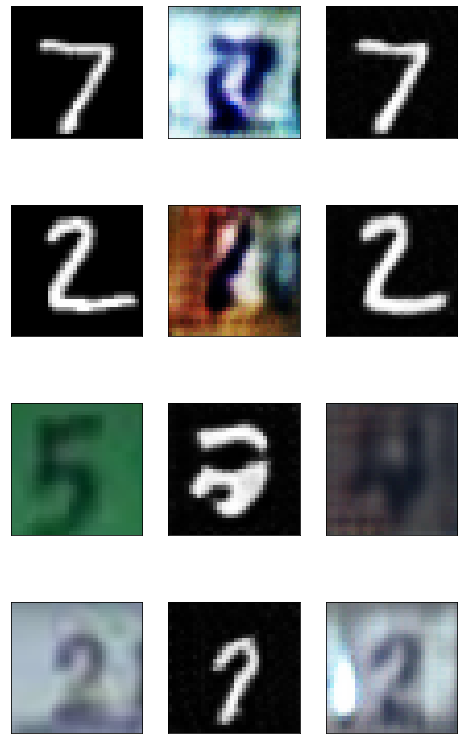

Step[17400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0879


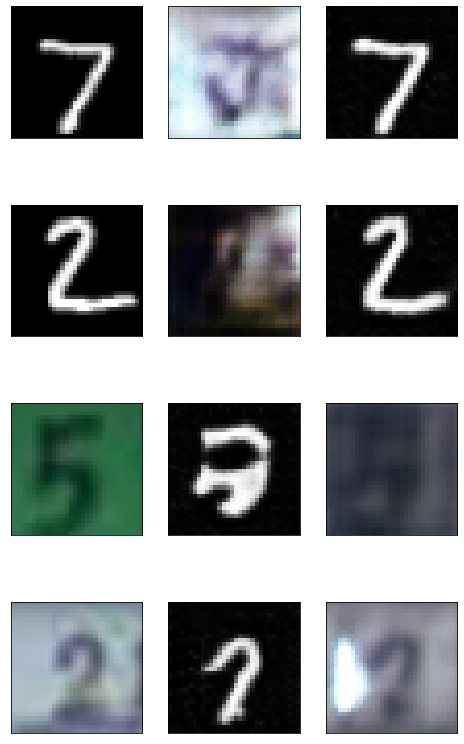

Step[17600/50000], d_real_loss: 0.0001, d_fake_loss: 0.0013, g_loss: 1.0266


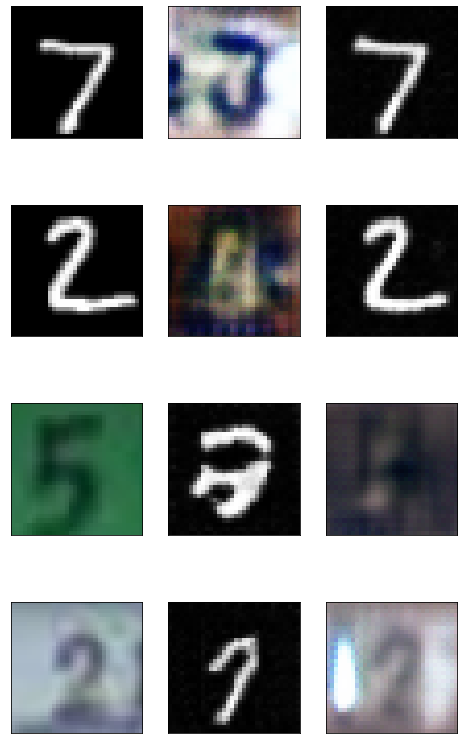

Step[17800/50000], d_real_loss: 0.0007, d_fake_loss: 0.0001, g_loss: 1.0793


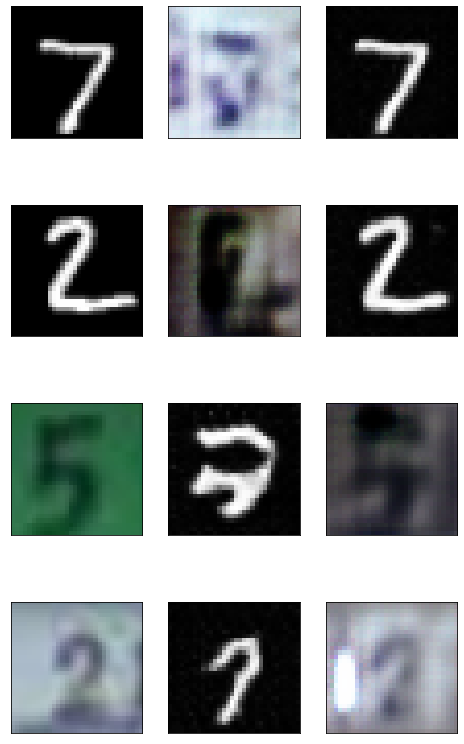

Step[18000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0423


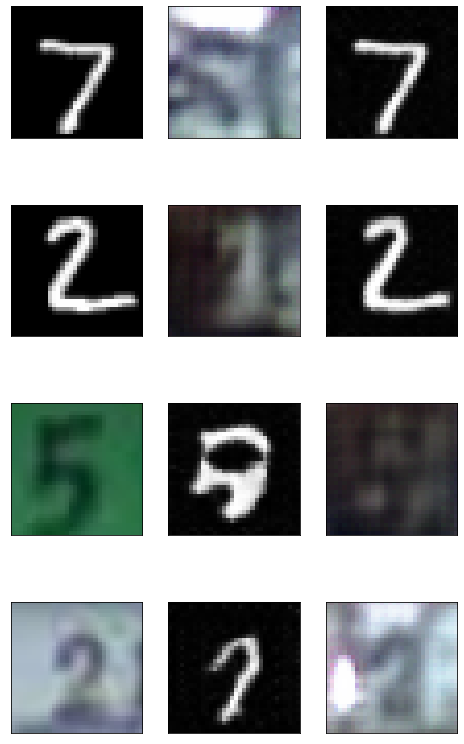

Step[18200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0742


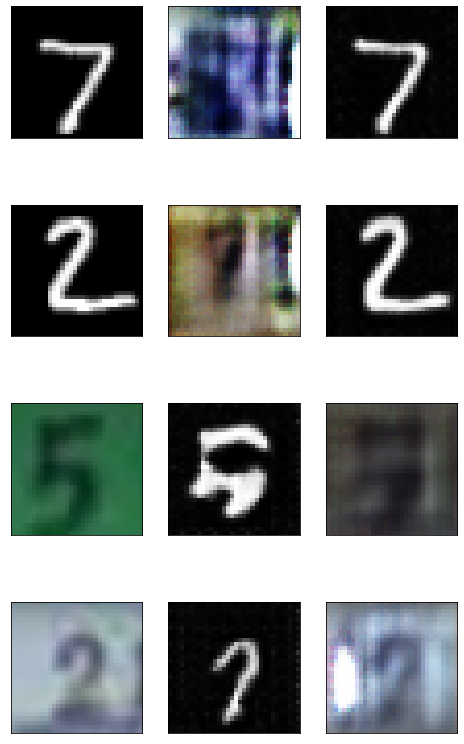

Step[18400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0274, g_loss: 1.0377


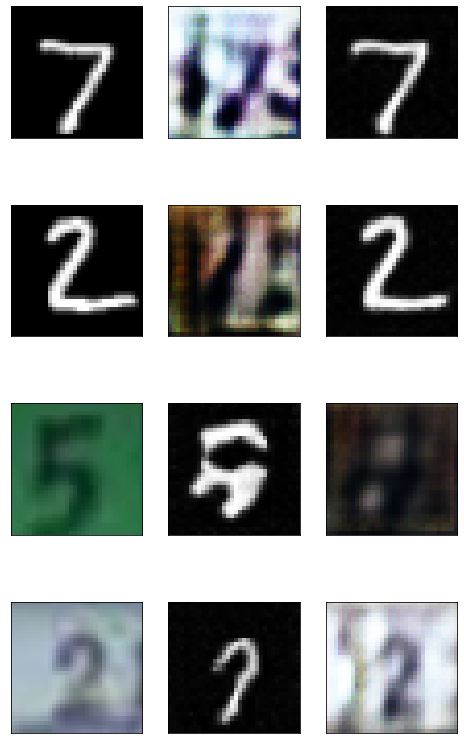

Step[18600/50000], d_real_loss: 0.2898, d_fake_loss: 0.0018, g_loss: 1.0710


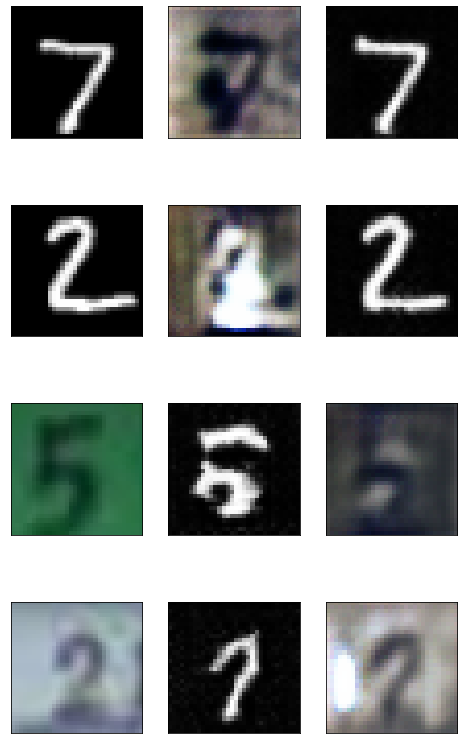

Step[18800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1193


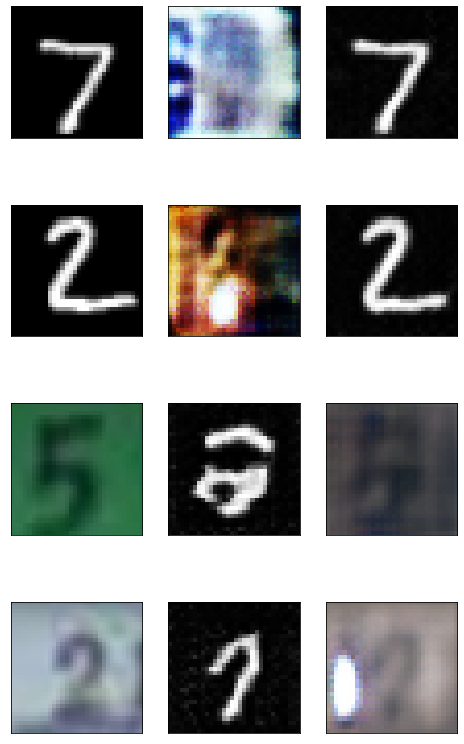

Step[19000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0014, g_loss: 1.0633


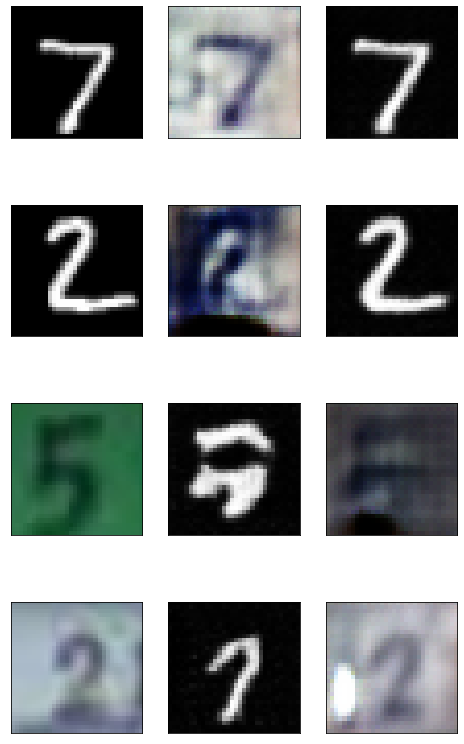

Step[19200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0308


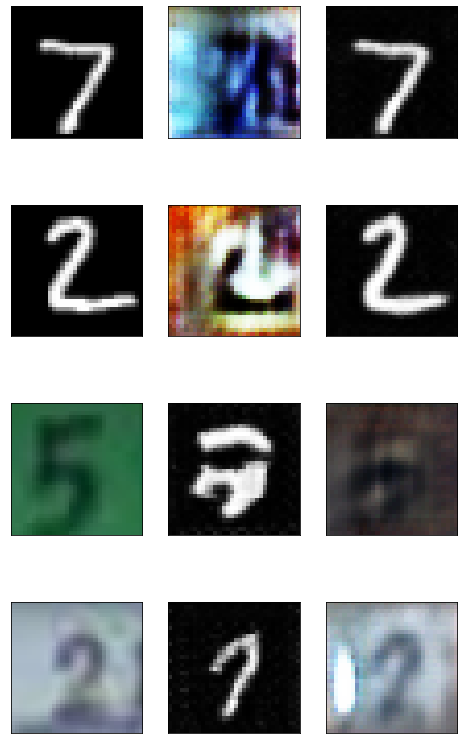

Step[19400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.1218


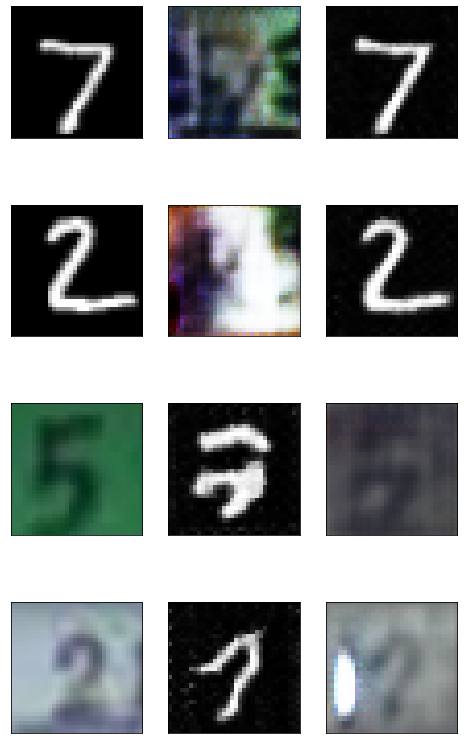

Step[19600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.2230


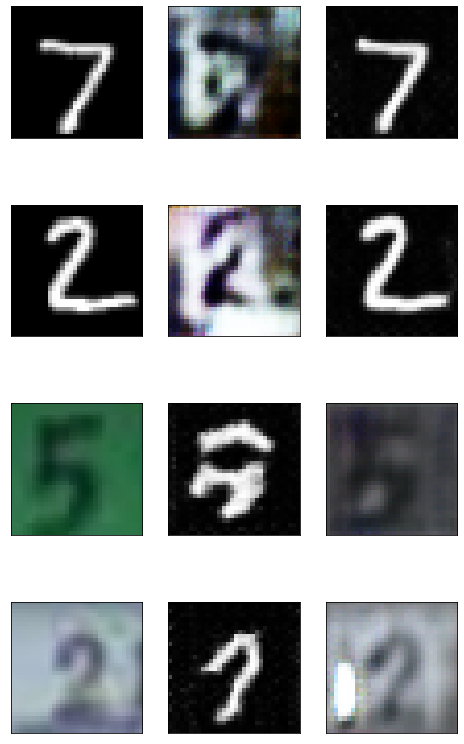

Step[19800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0367


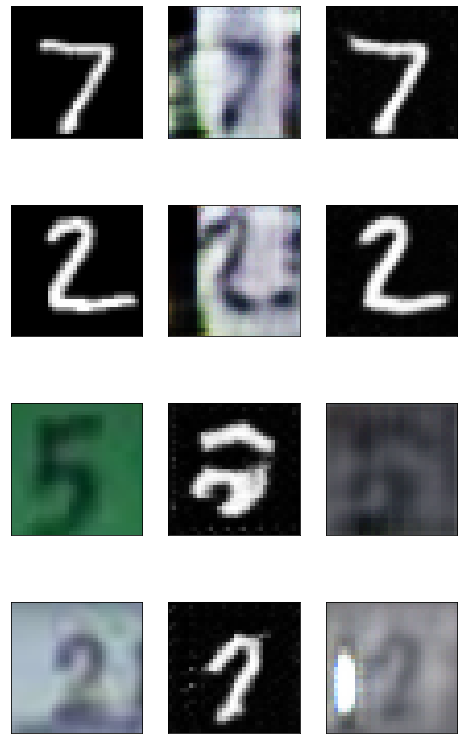

Step[20000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0376


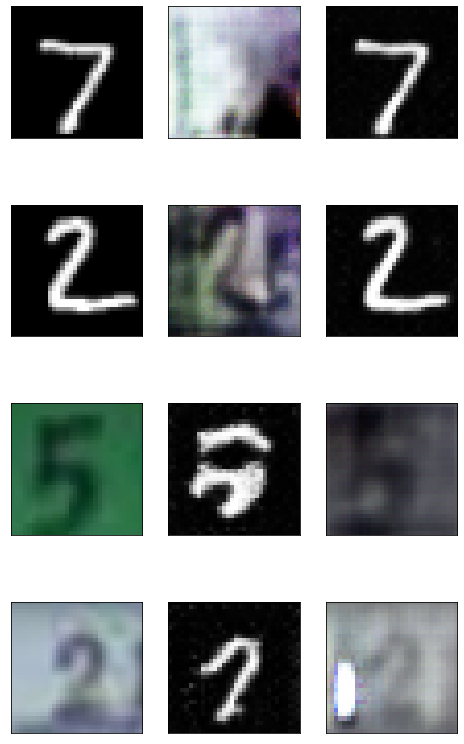

Step[20200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.1035


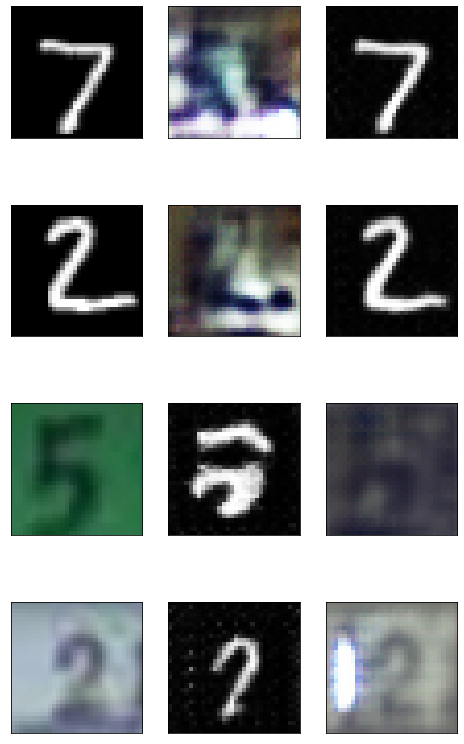

Step[20400/50000], d_real_loss: 0.0006, d_fake_loss: 0.0067, g_loss: 1.0502


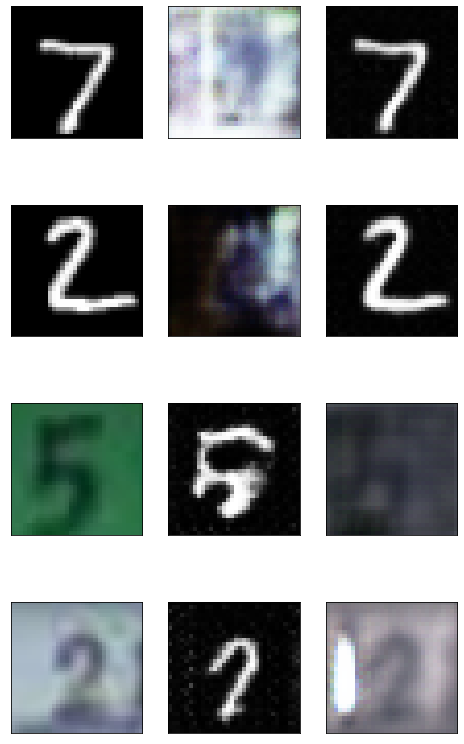

Step[20600/50000], d_real_loss: 0.0280, d_fake_loss: 0.0029, g_loss: 1.0317


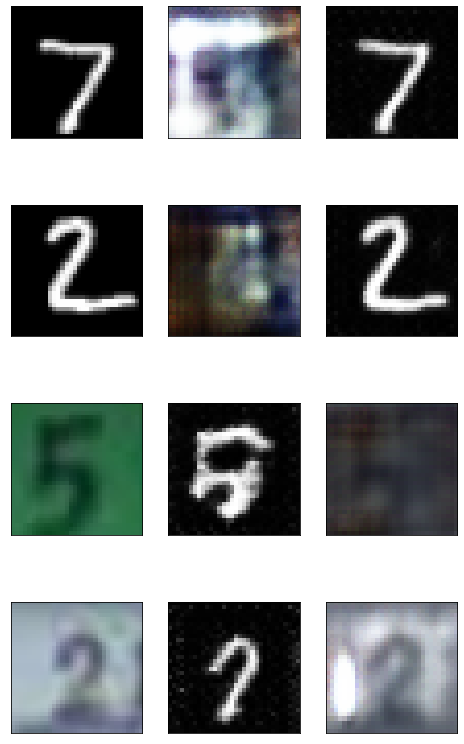

Step[20800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0418


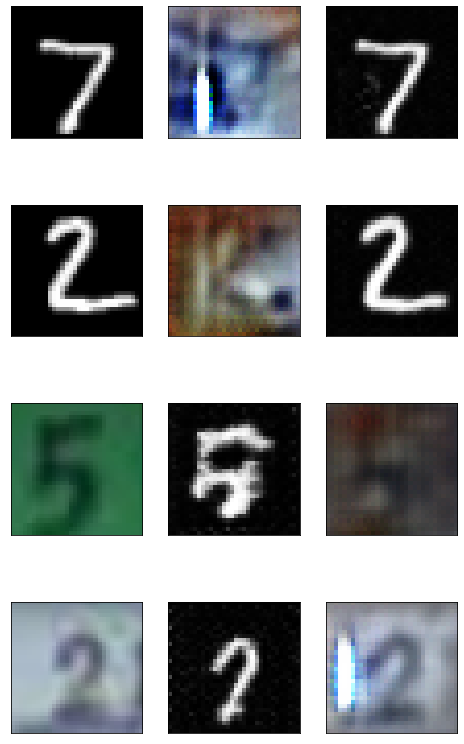

Step[21000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0022, g_loss: 1.0429


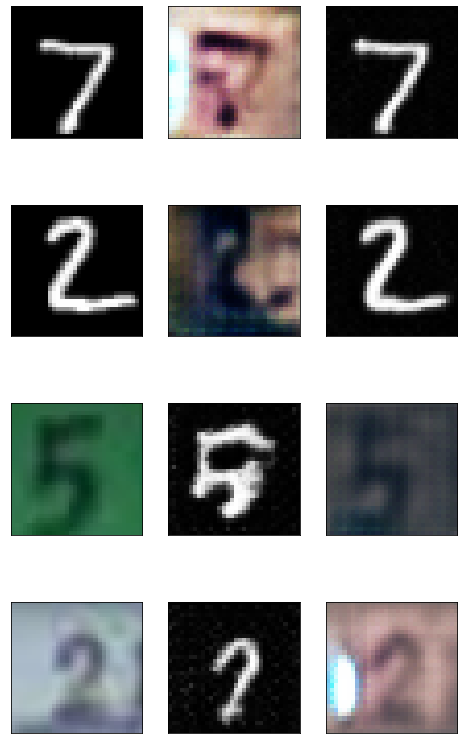

Step[21200/50000], d_real_loss: 0.0015, d_fake_loss: 0.0007, g_loss: 1.0422


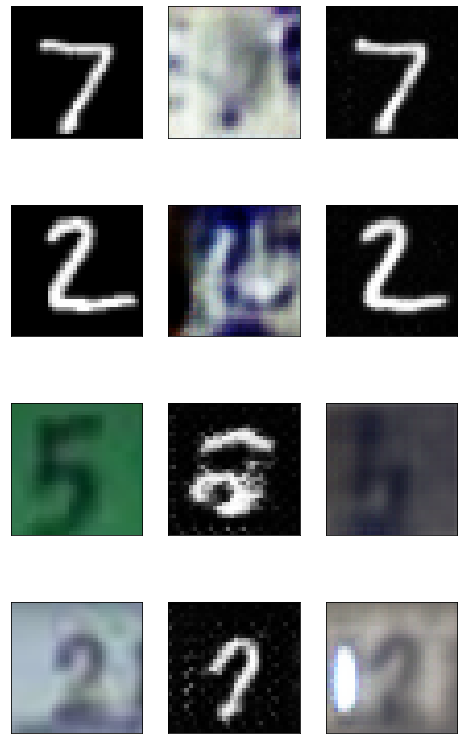

Step[21400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0432


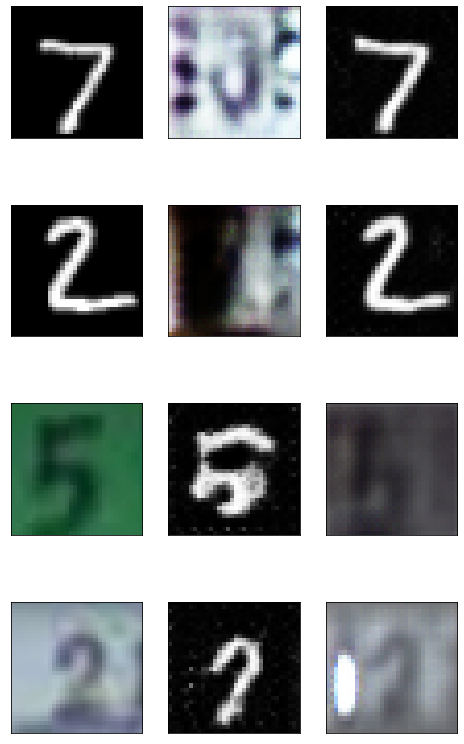

Step[21600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0426, g_loss: 1.0311


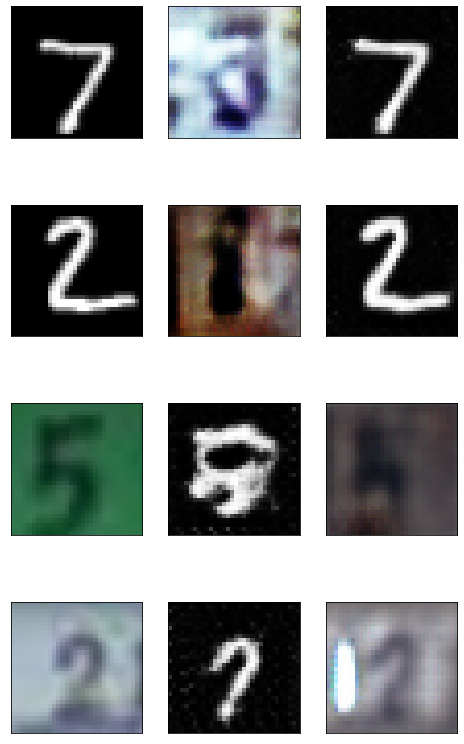

Step[21800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0002, g_loss: 1.0664


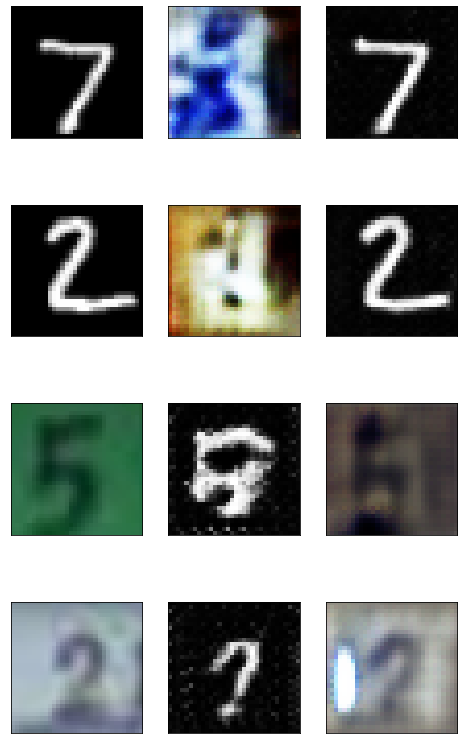

Step[22000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0684


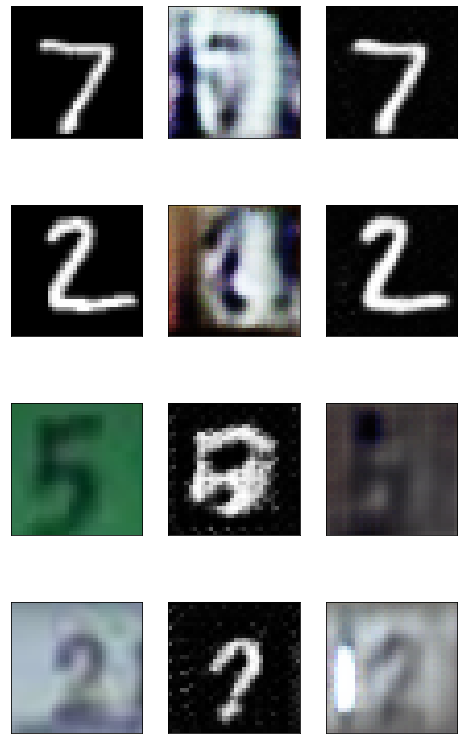

Step[22200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0057, g_loss: 1.1287


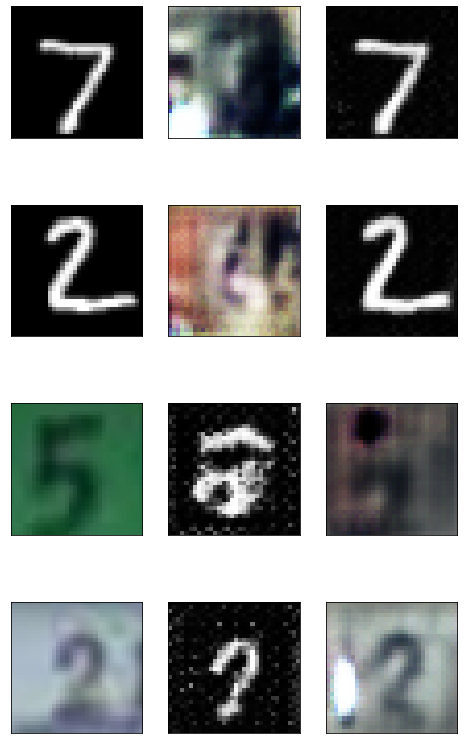

Step[22400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0584


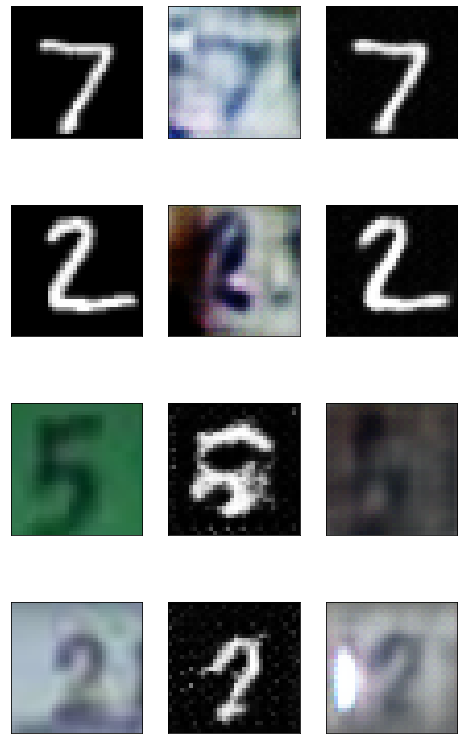

Step[22600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0002, g_loss: 1.0244


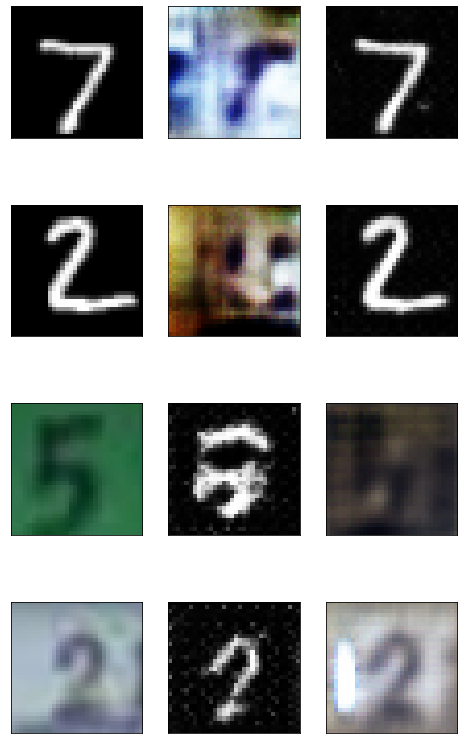

Step[22800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0629


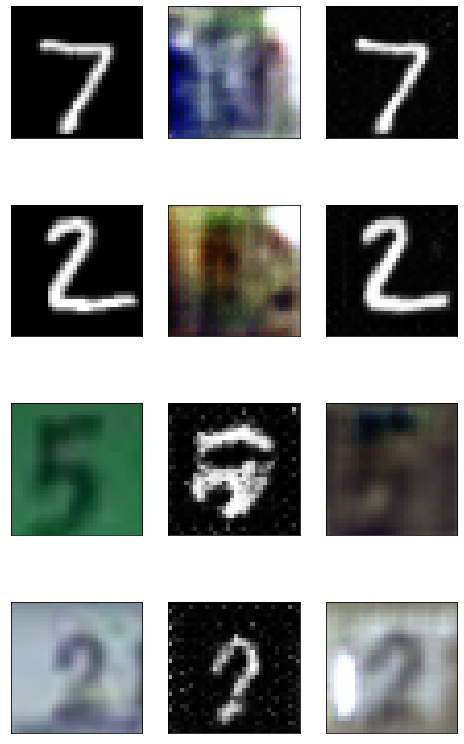

Step[23000/50000], d_real_loss: 0.1583, d_fake_loss: 0.2869, g_loss: 1.0354


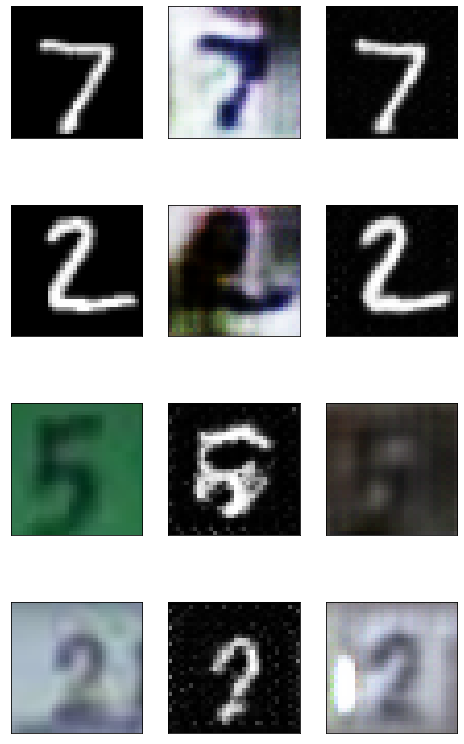

Step[23200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0656


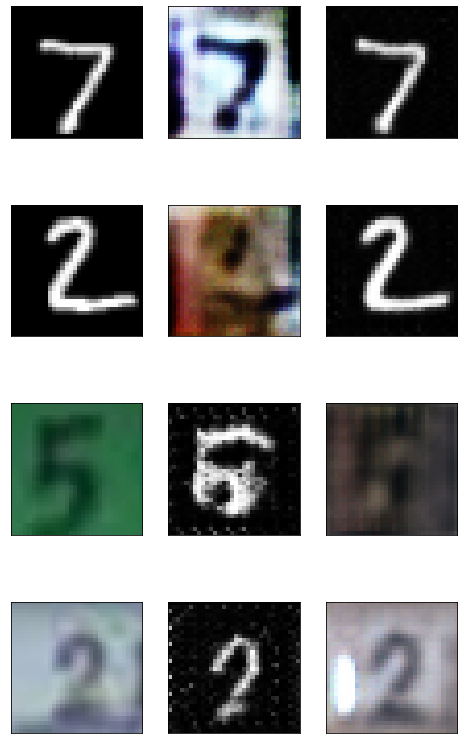

Step[23400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0340


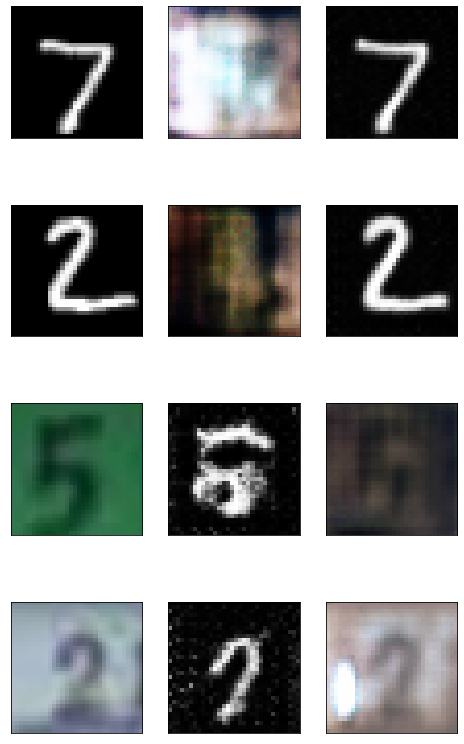

Step[23600/50000], d_real_loss: 0.0141, d_fake_loss: 0.0044, g_loss: 1.0261


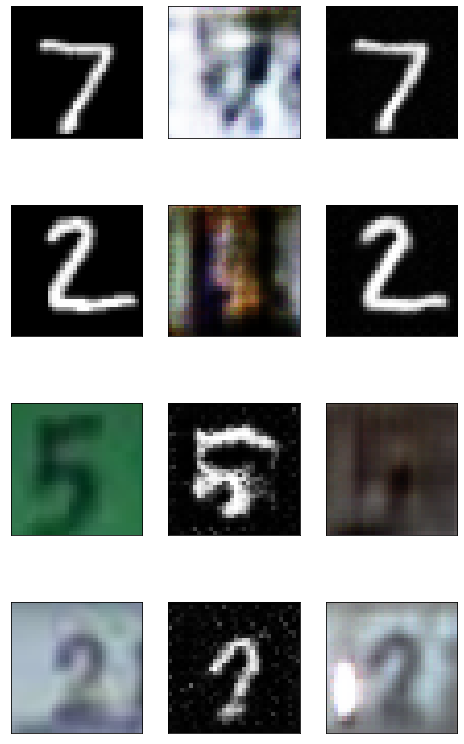

Step[23800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1050


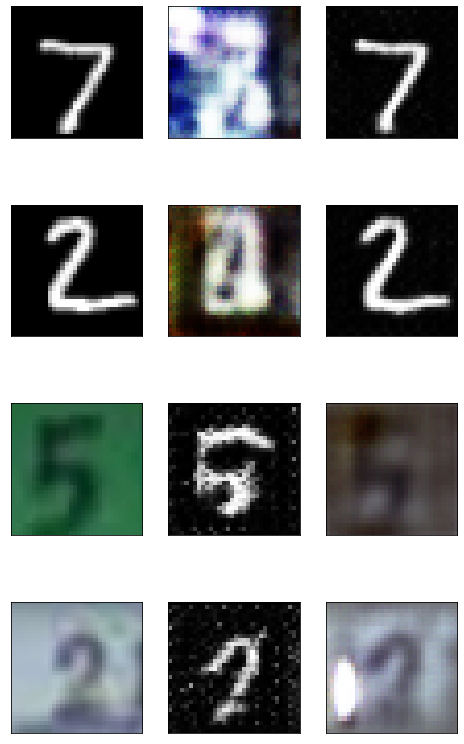

Step[24000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0687


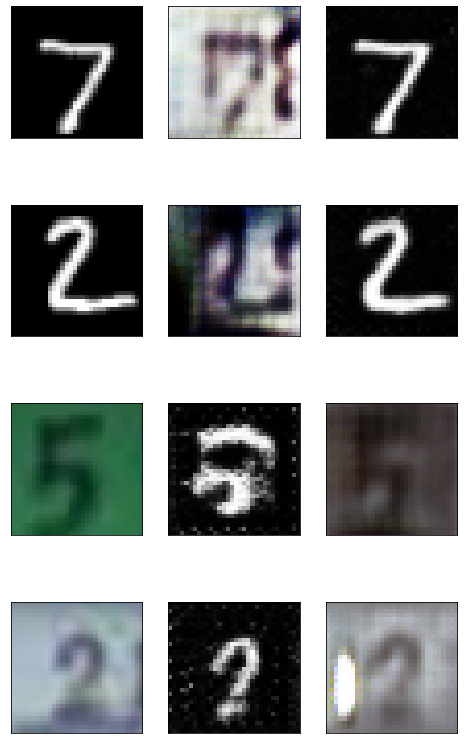

Step[24200/50000], d_real_loss: 0.1410, d_fake_loss: 0.0000, g_loss: 1.0326


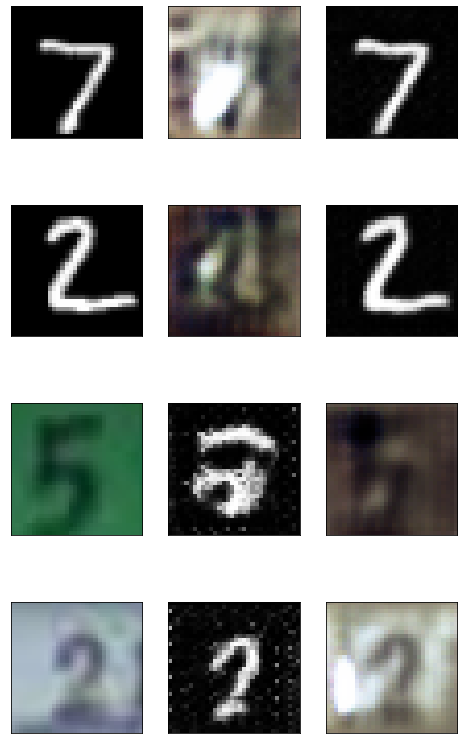

Step[24400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0271, g_loss: 1.1033


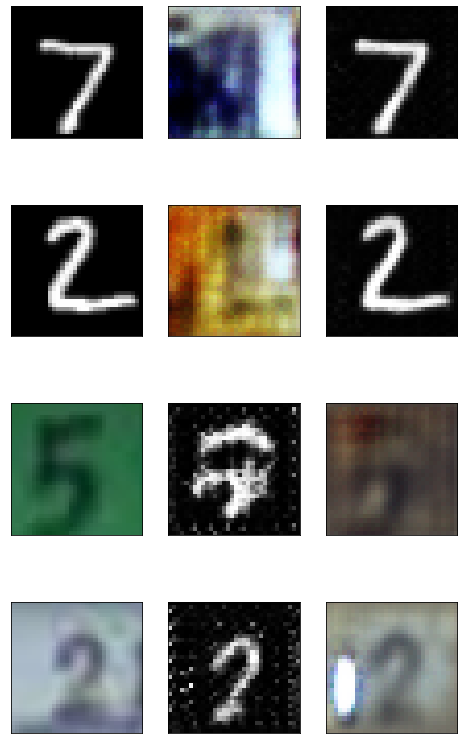

Step[24600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.2536


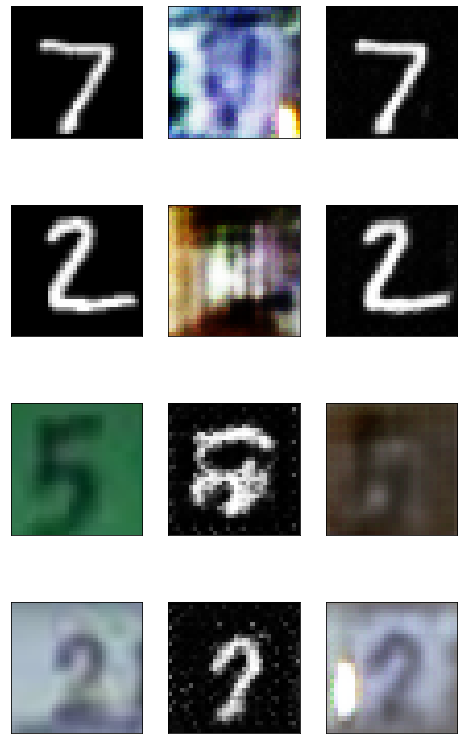

Step[24800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0384


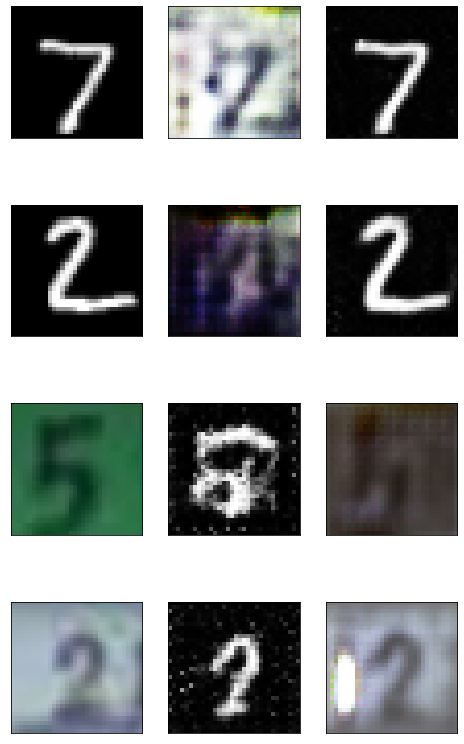

Step[25000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0296


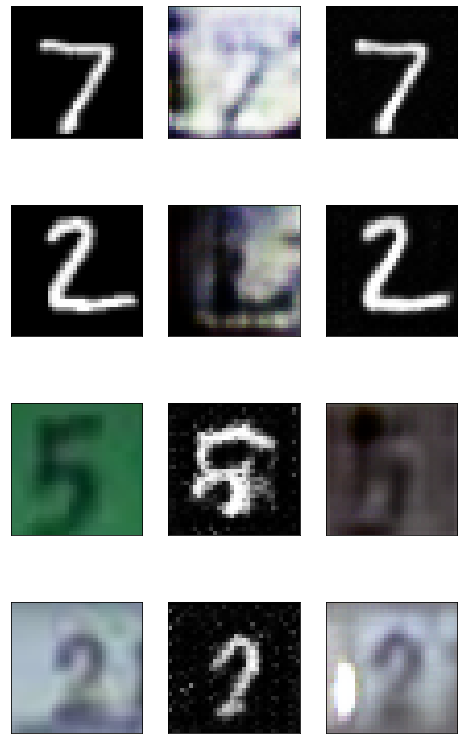

Step[25200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0768


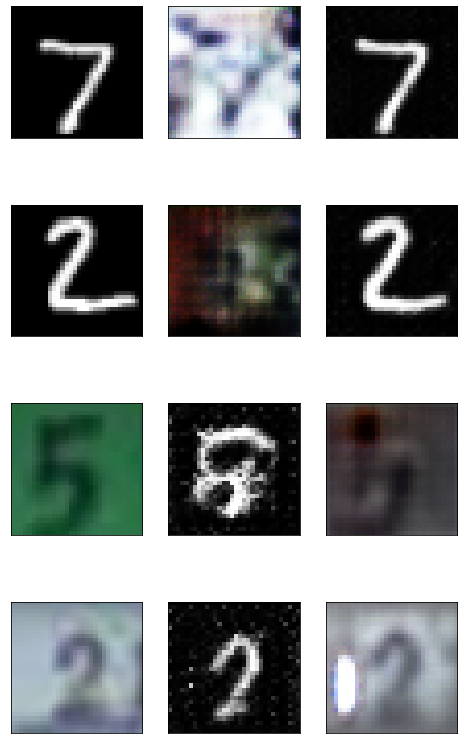

Step[25400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0392


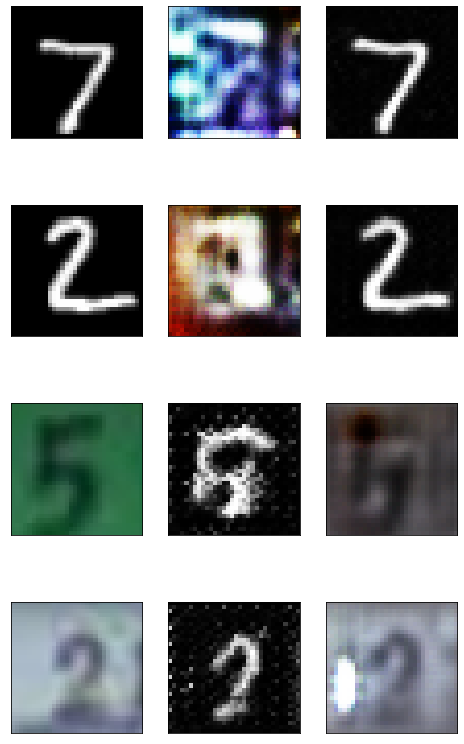

Step[25600/50000], d_real_loss: 0.0010, d_fake_loss: 0.0028, g_loss: 1.0258


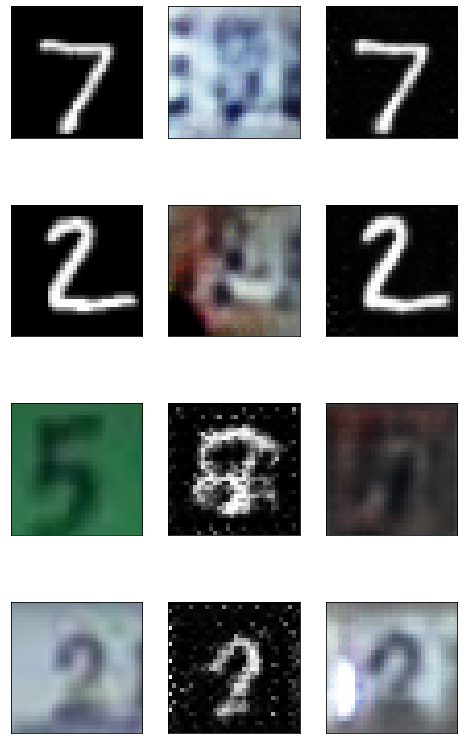

Step[25800/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.0474


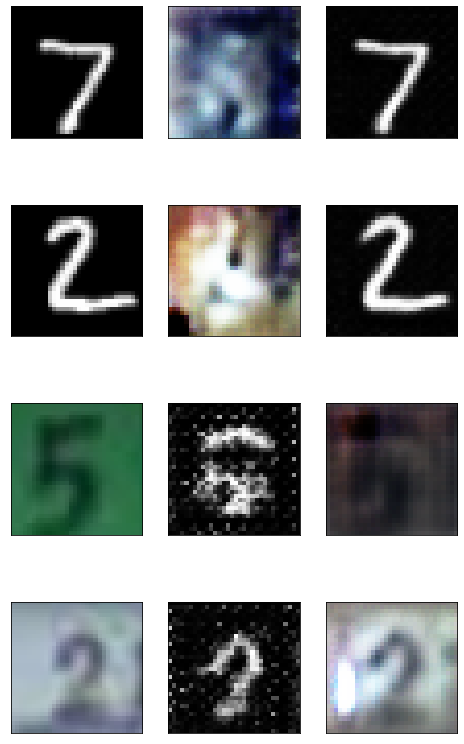

Step[26000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0244


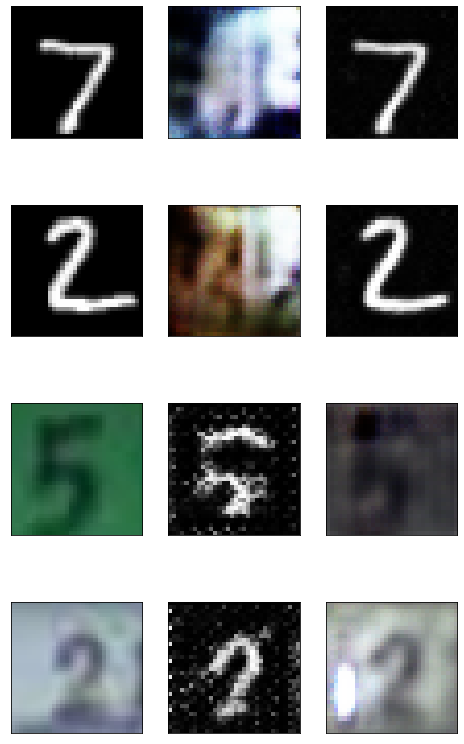

Step[26200/50000], d_real_loss: 0.0027, d_fake_loss: 0.0001, g_loss: 1.0379


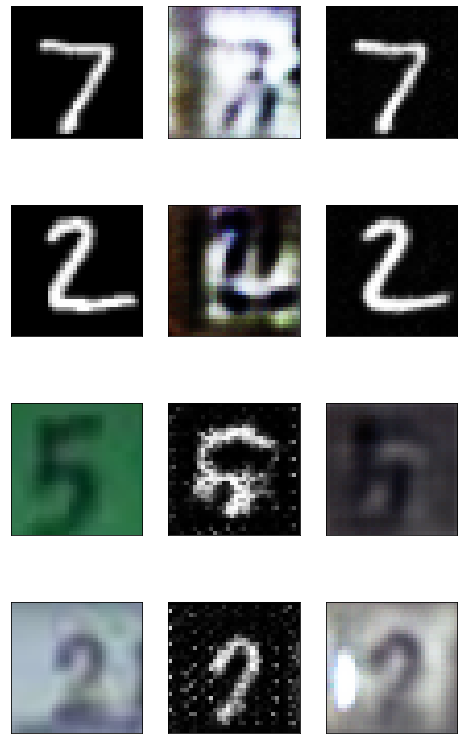

Step[26400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0002, g_loss: 1.0389


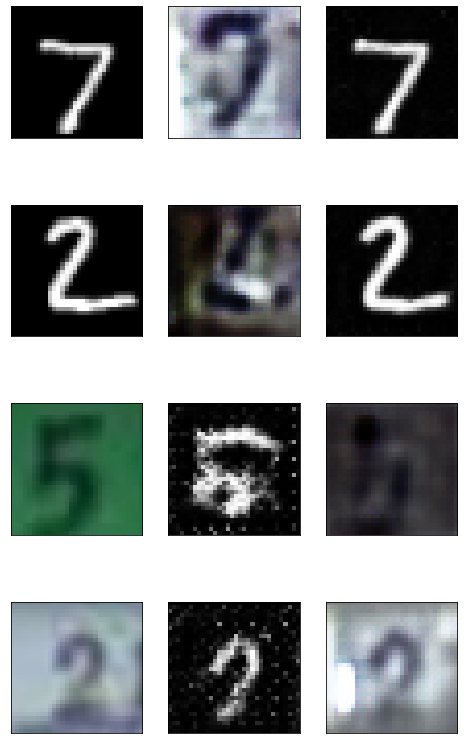

Step[26600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0414, g_loss: 1.0276


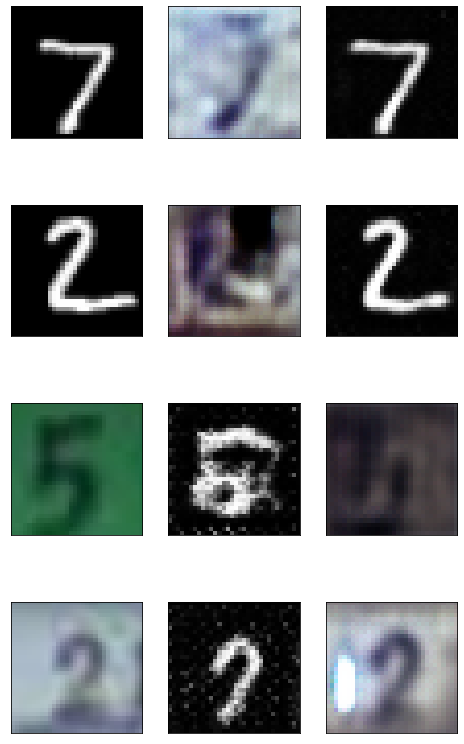

Step[26800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0752


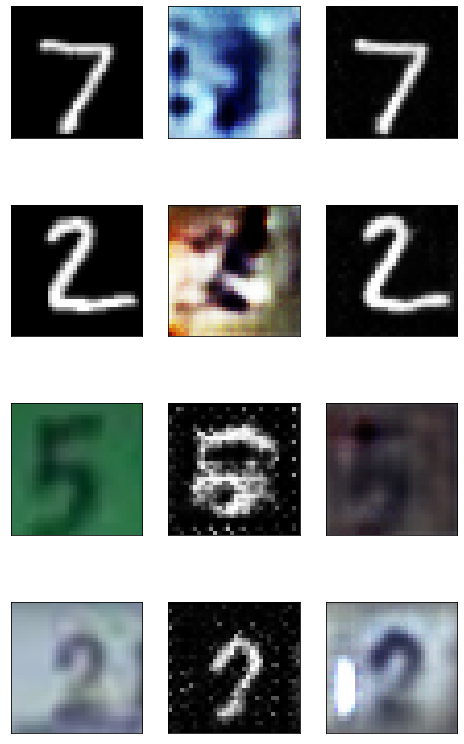

Step[27000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0599


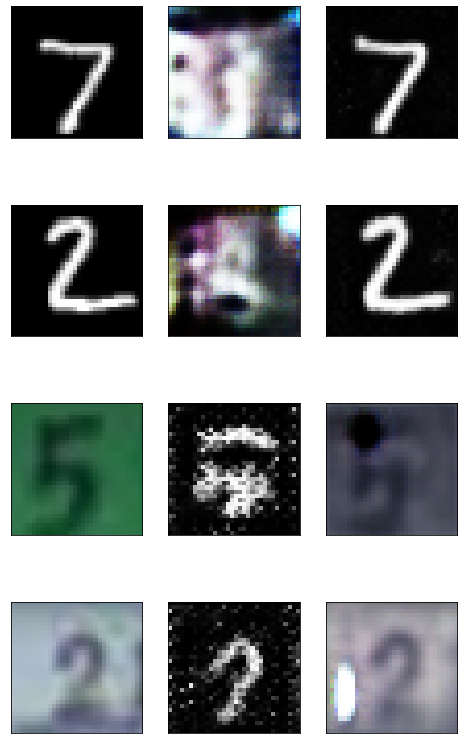

Step[27200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1122


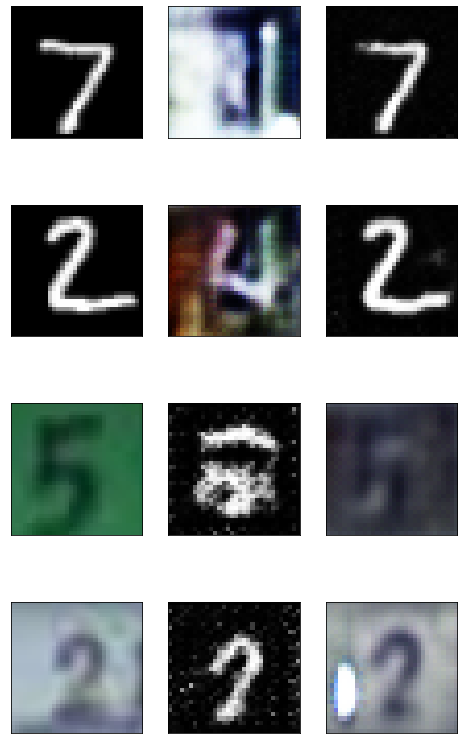

Step[27400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0816


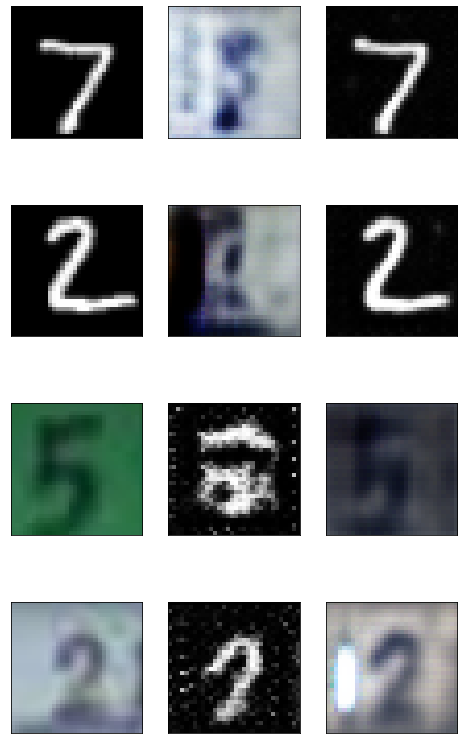

Step[27600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0220


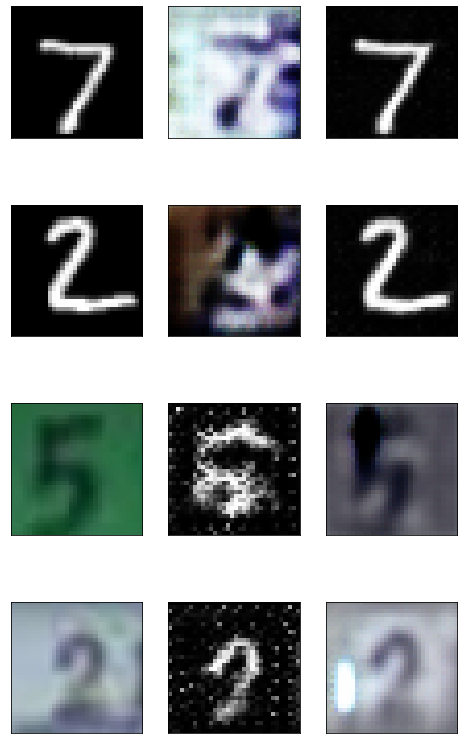

Step[27800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0449


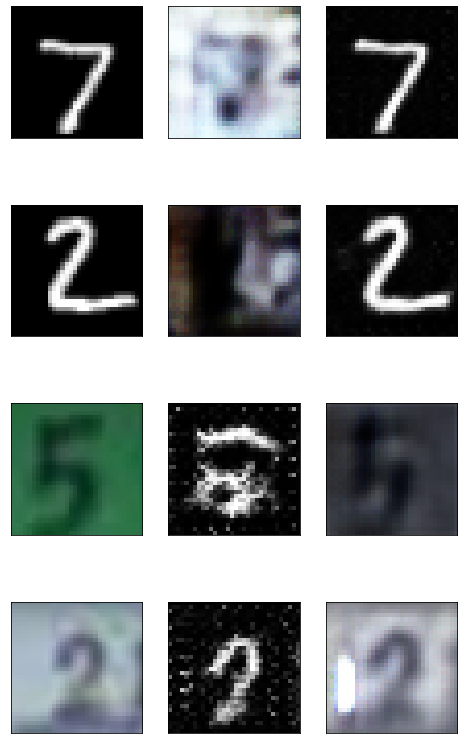

Step[28000/50000], d_real_loss: 0.0009, d_fake_loss: 0.0001, g_loss: 1.0302


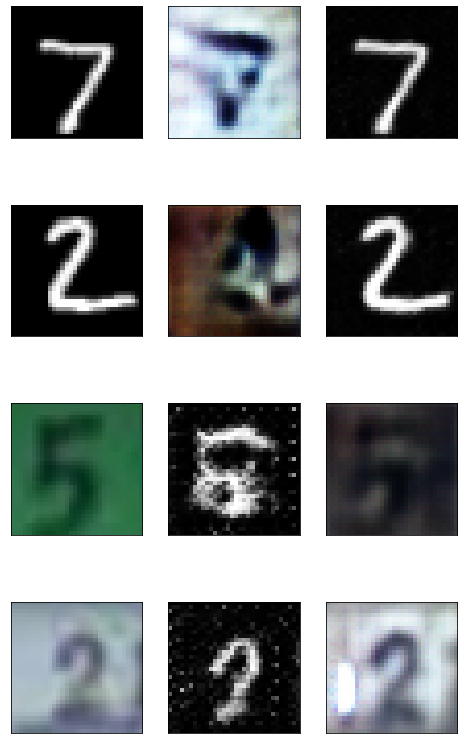

Step[28200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0002, g_loss: 1.0579


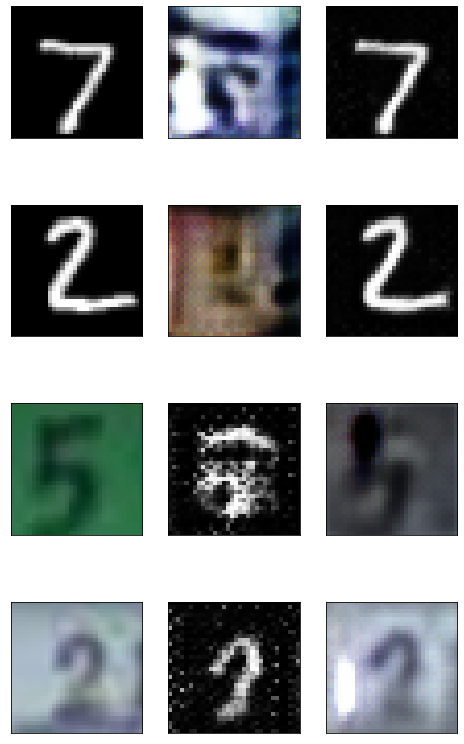

Step[28400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.0256


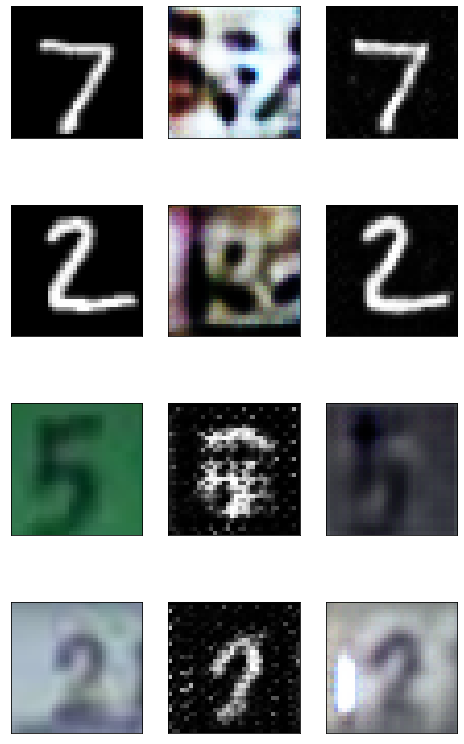

Step[28600/50000], d_real_loss: 0.0084, d_fake_loss: 0.0923, g_loss: 1.0331


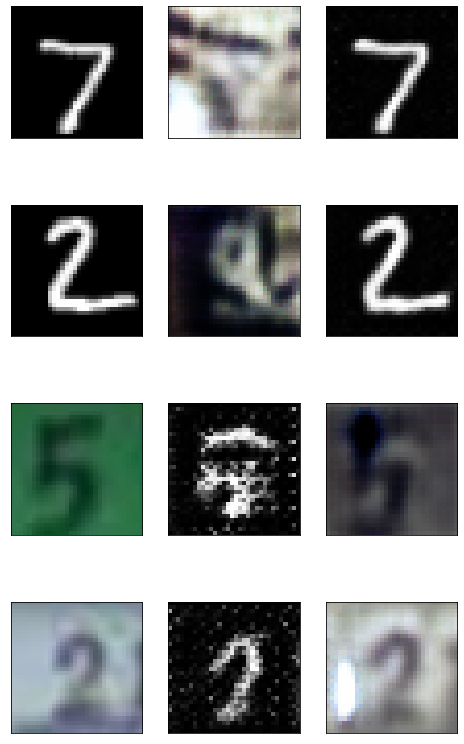

Step[28800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0874


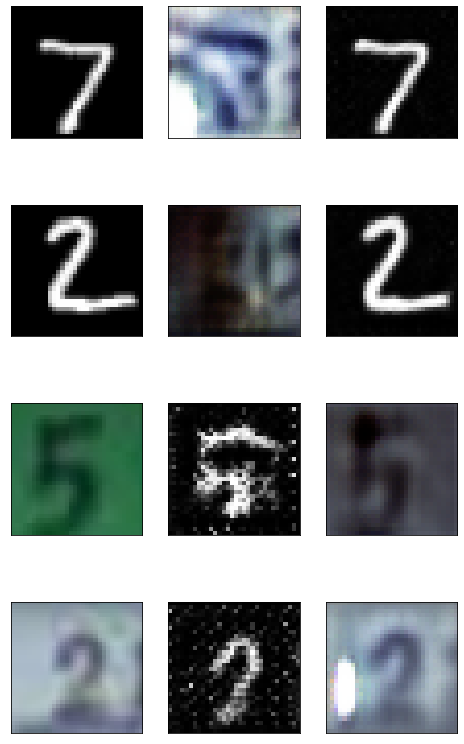

Step[29000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0486


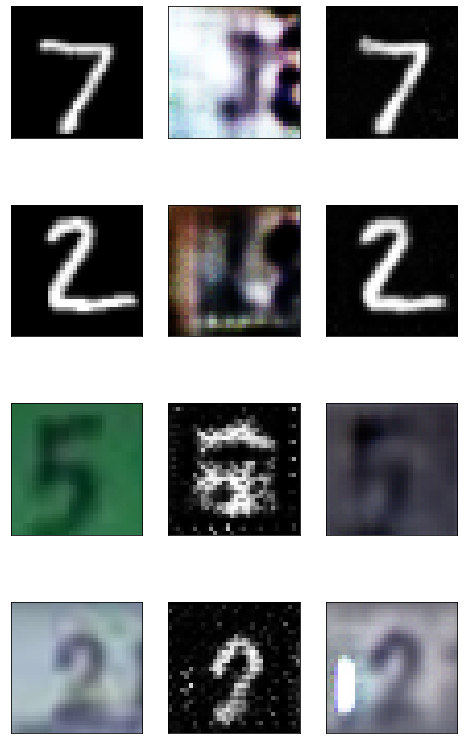

Step[29200/50000], d_real_loss: 0.0006, d_fake_loss: 0.0000, g_loss: 1.0225


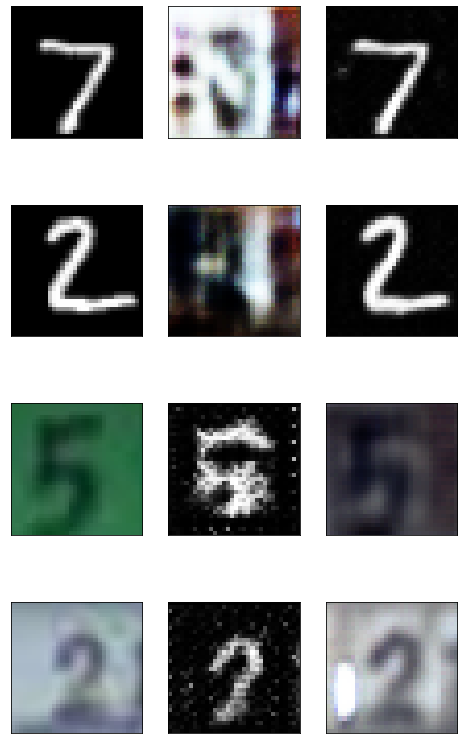

Step[29400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0858


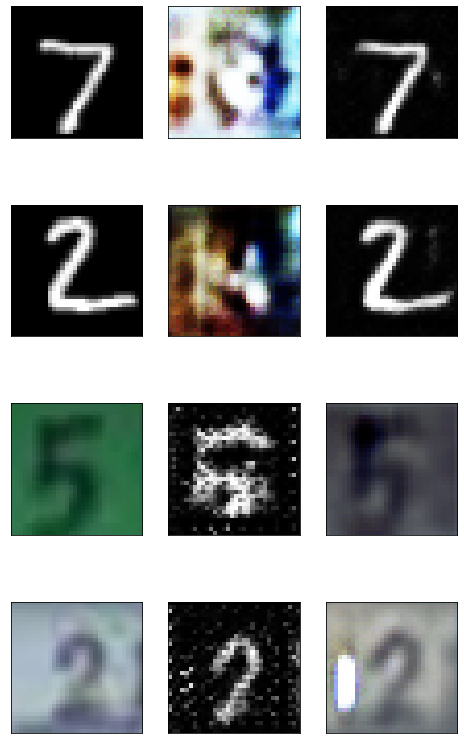

Step[29600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.2380


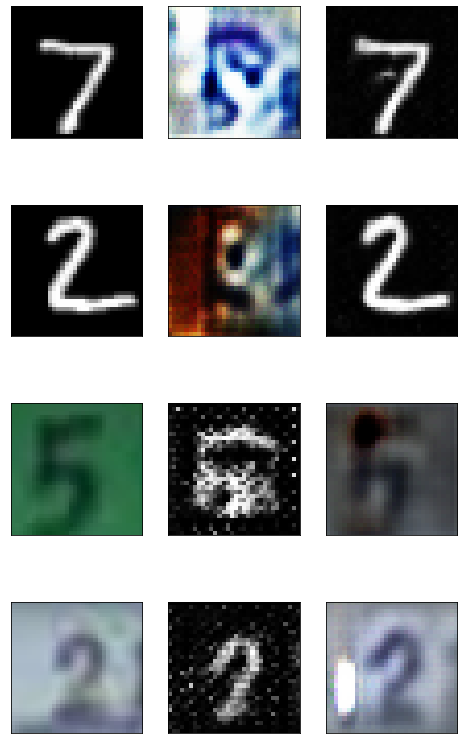

Step[29800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0277


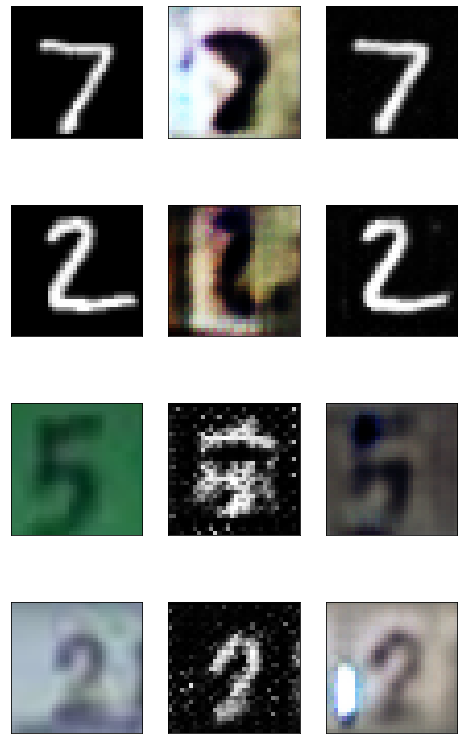

Step[30000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0279


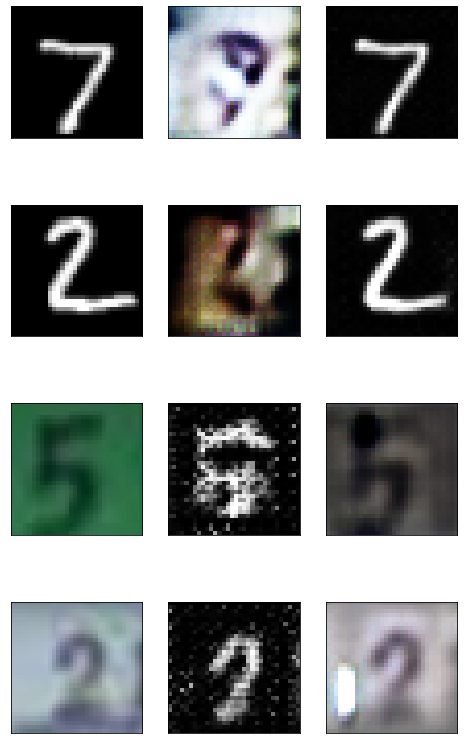

Step[30200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0840


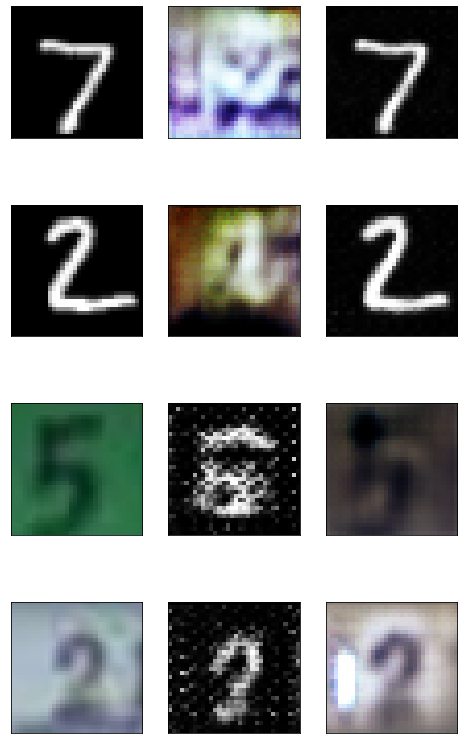

Step[30400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0008, g_loss: 1.0262


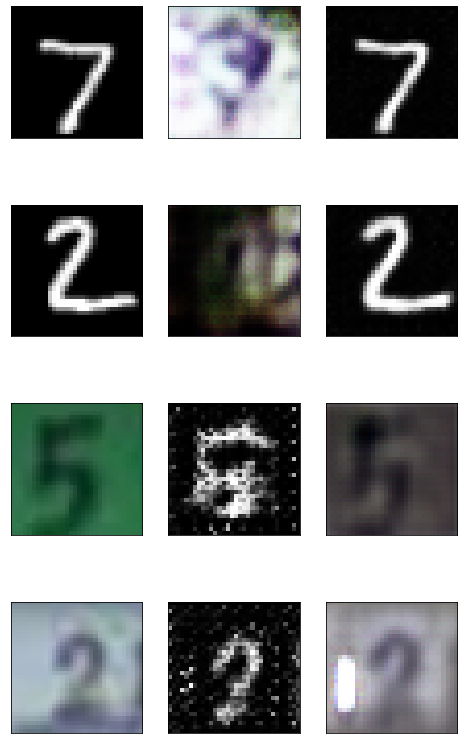

Step[30600/50000], d_real_loss: 0.0003, d_fake_loss: 0.0000, g_loss: 1.0244


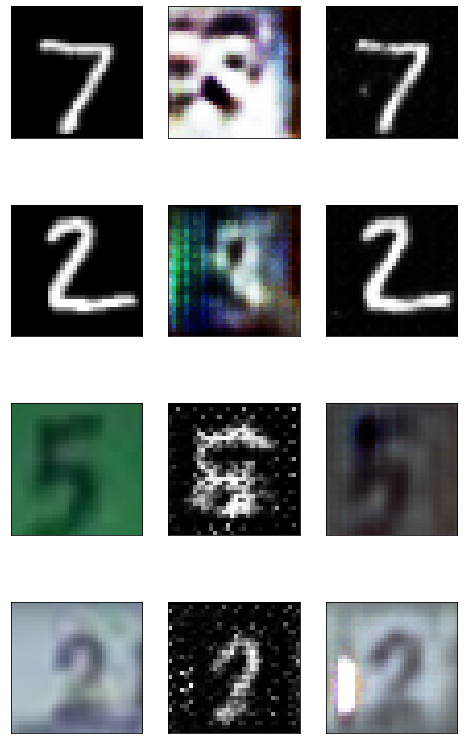

Step[30800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0318


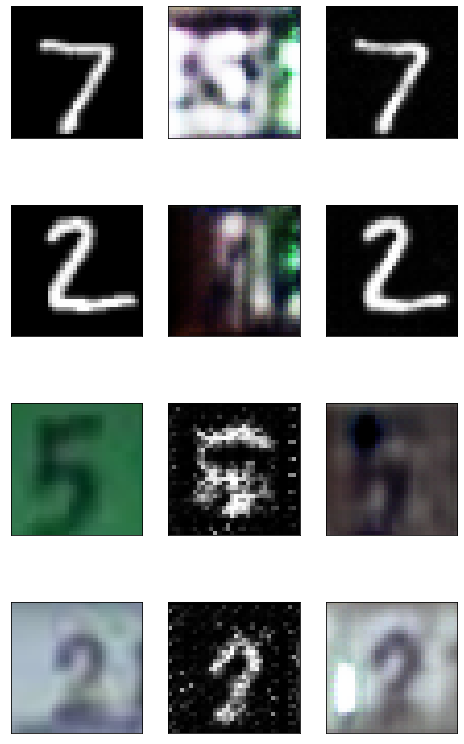

Step[31000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0194


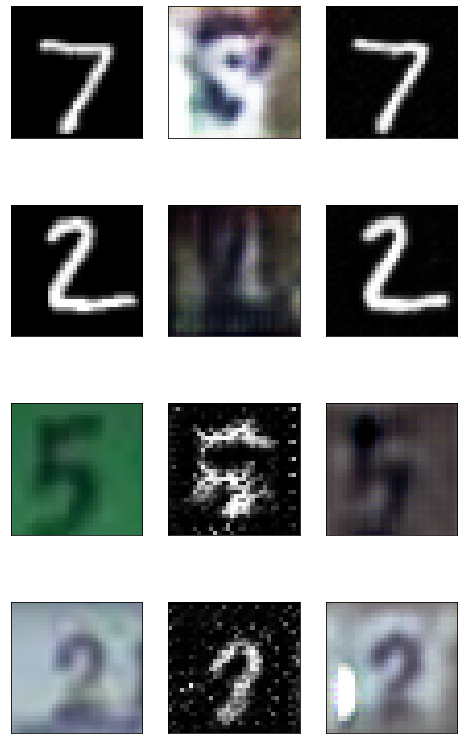

Step[31200/50000], d_real_loss: 0.0003, d_fake_loss: 0.0000, g_loss: 1.0298


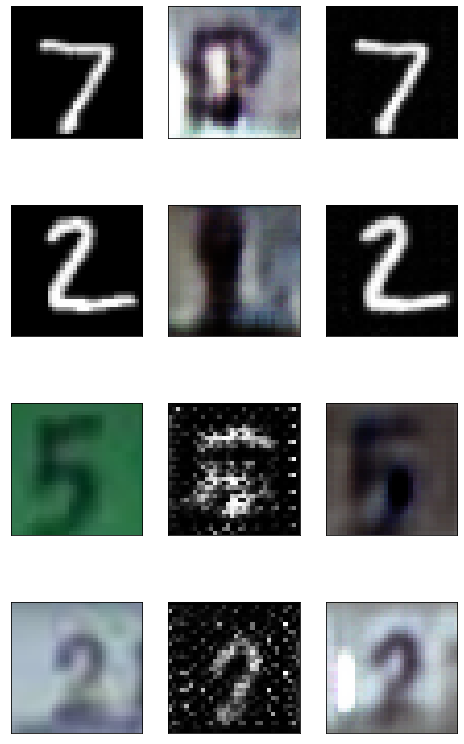

Step[31400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0312


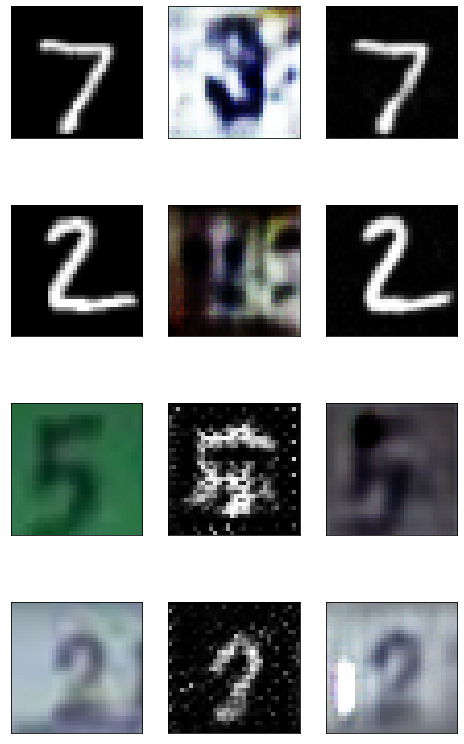

Step[31600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0660, g_loss: 1.0250


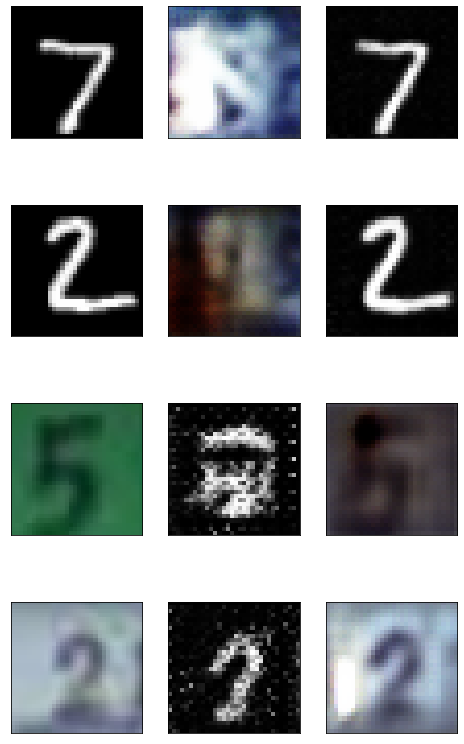

Step[31800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0006, g_loss: 1.0630


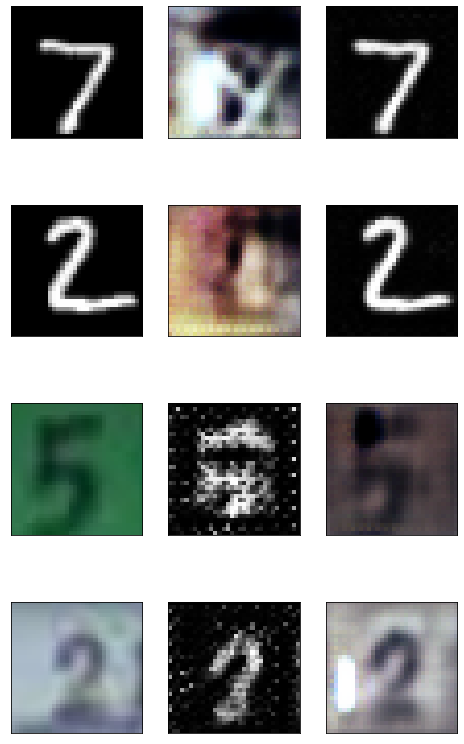

Step[32000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0560


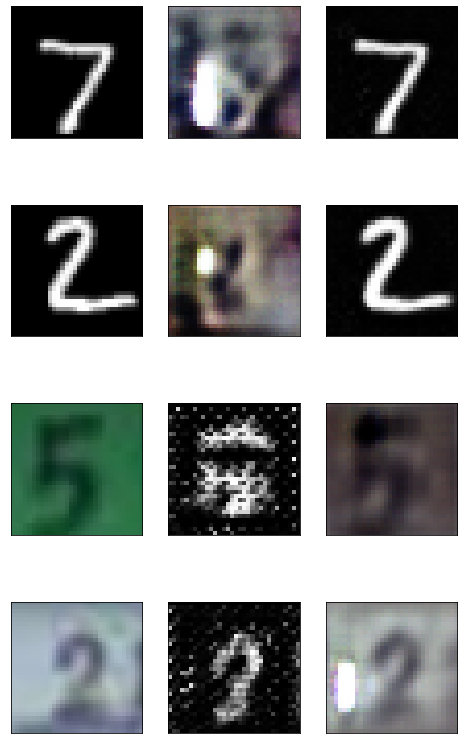

Step[32200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1108


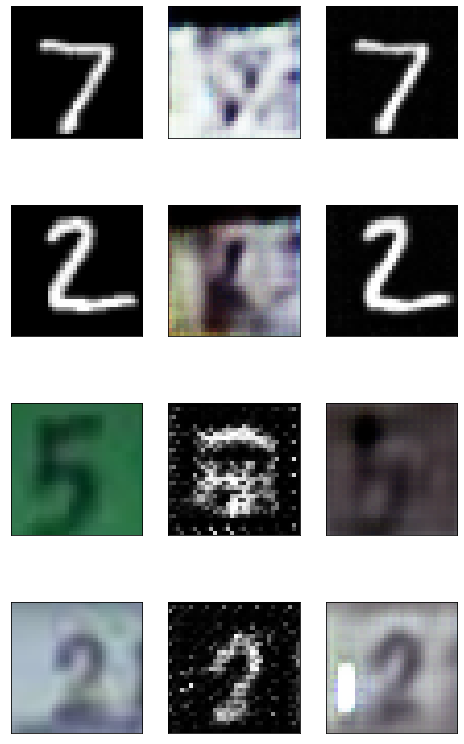

Step[32400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0436


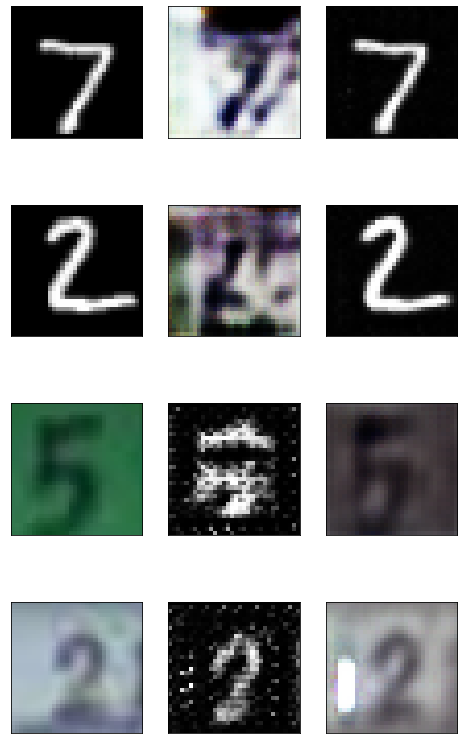

Step[32600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0228, g_loss: 1.0164


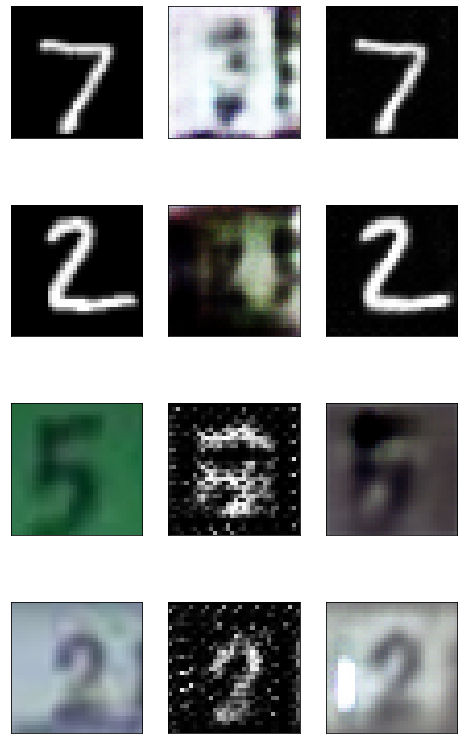

Step[32800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0418


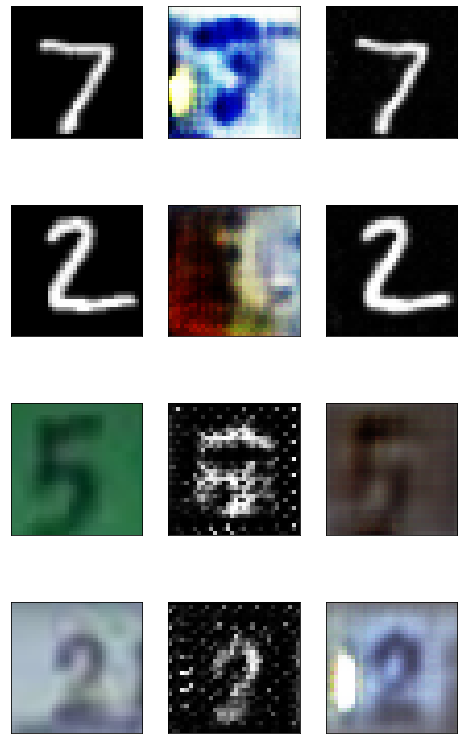

Step[33000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0004, g_loss: 1.0283


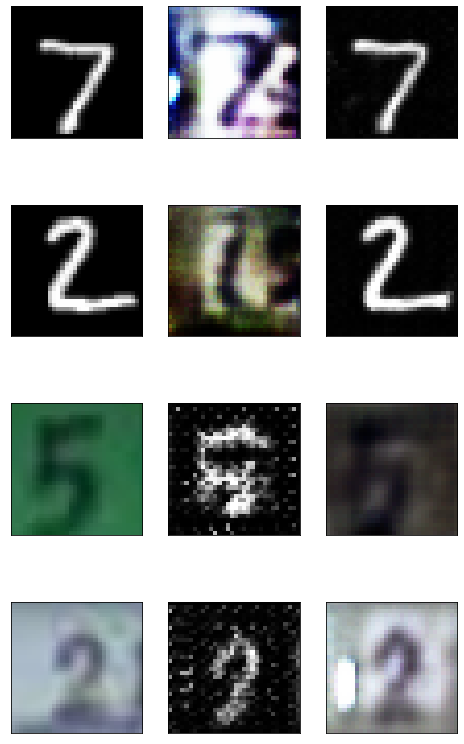

Step[33200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0477


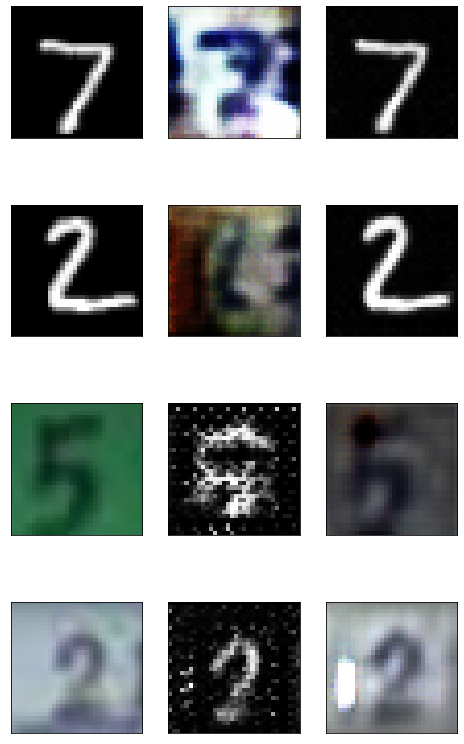

Step[33400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.0258


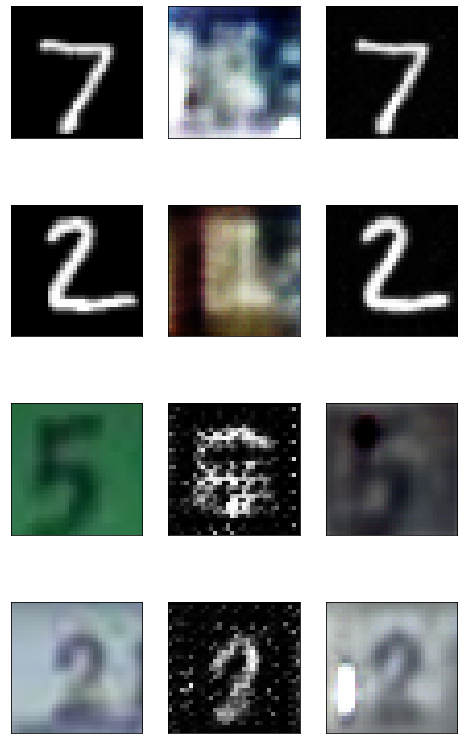

Step[33600/50000], d_real_loss: 0.0002, d_fake_loss: 0.0120, g_loss: 1.0337


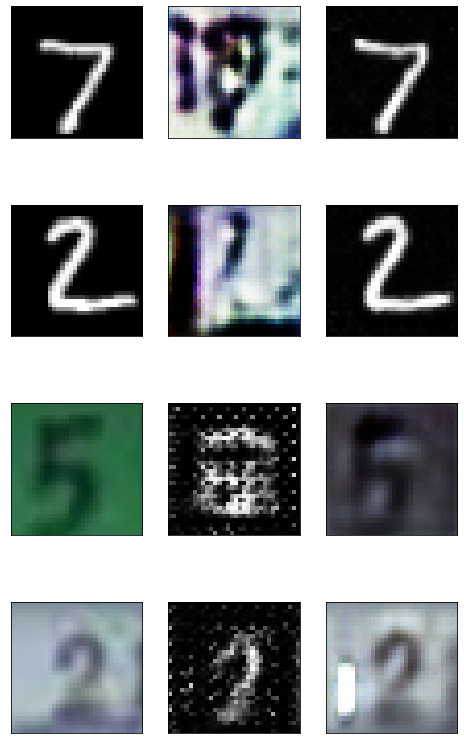

Step[33800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0781


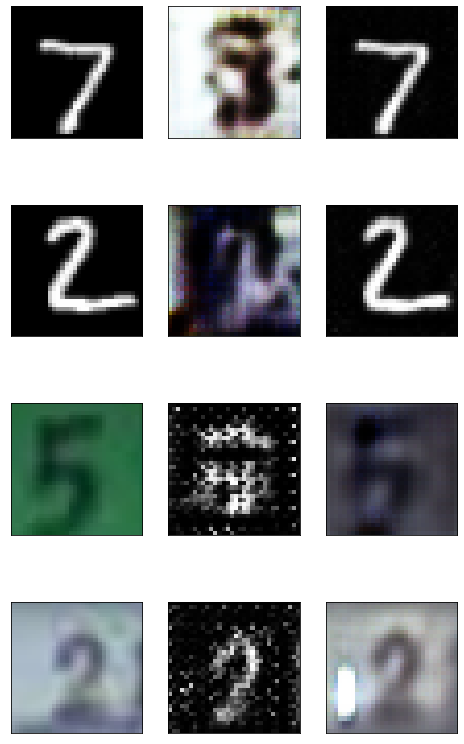

Step[34000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0067, g_loss: 1.0435


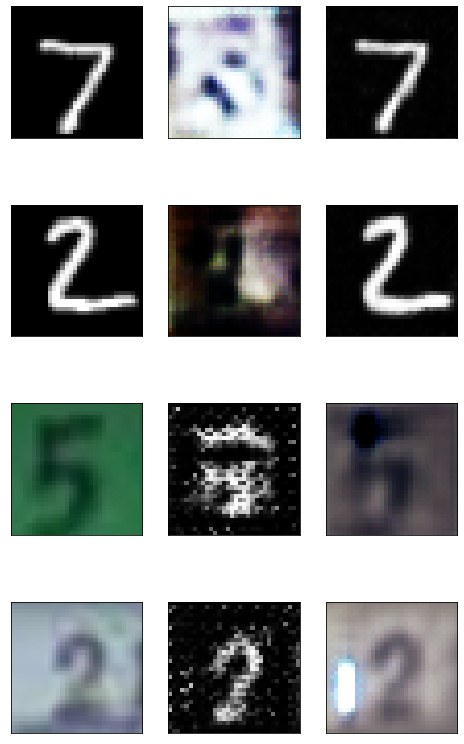

Step[34200/50000], d_real_loss: 0.1178, d_fake_loss: 0.0000, g_loss: 1.0254


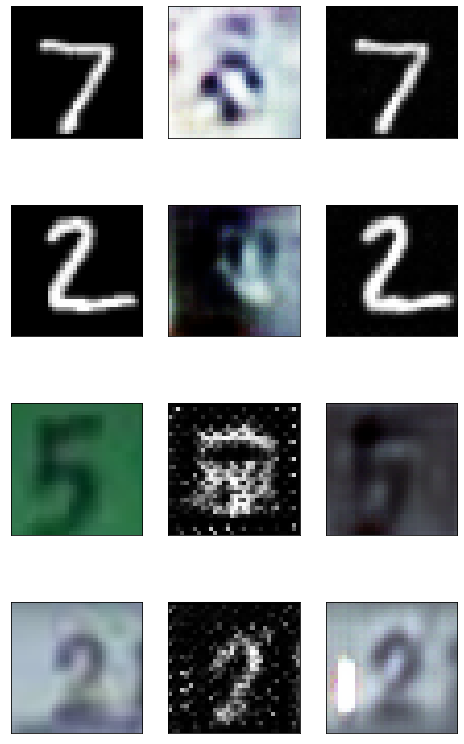

Step[34400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0031, g_loss: 1.0825


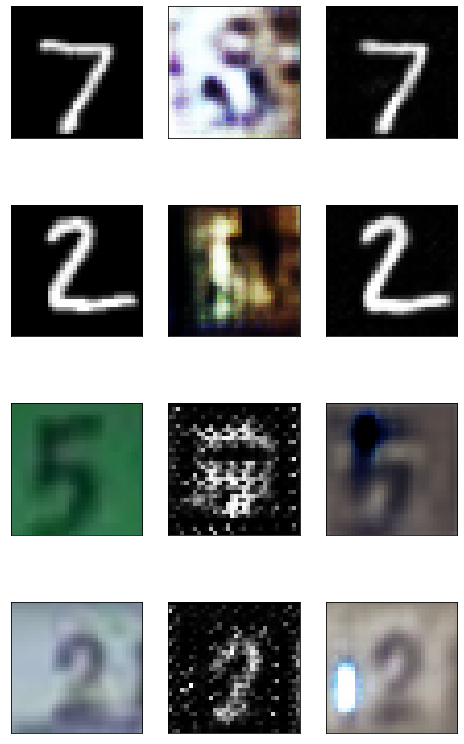

Step[34600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.2044


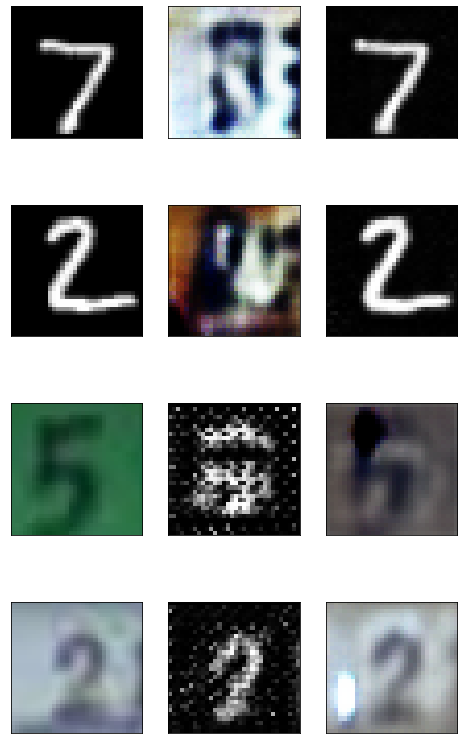

Step[34800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0319


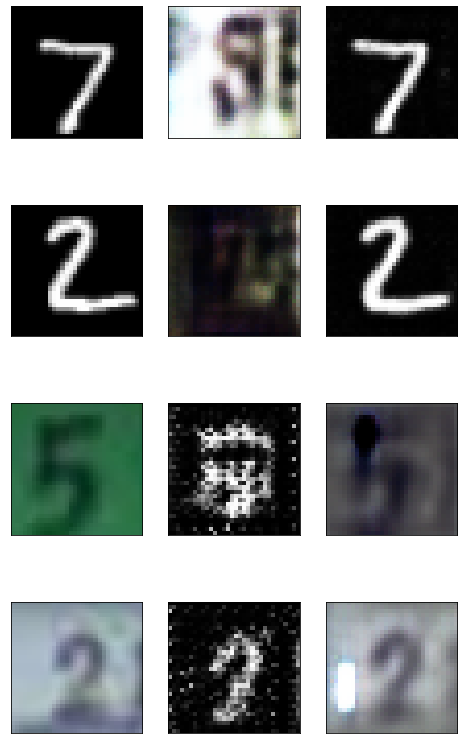

Step[35000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0242


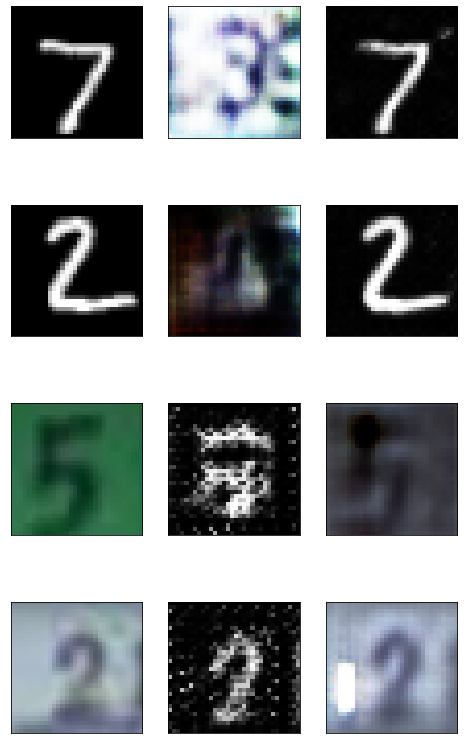

Step[35200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0028, g_loss: 1.0659


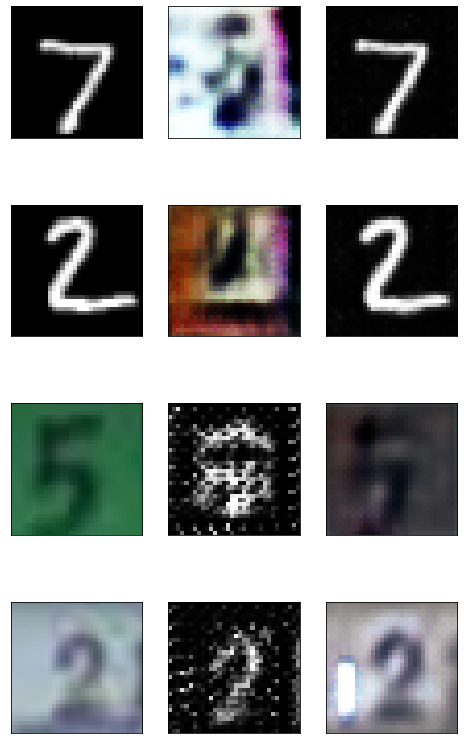

Step[35400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0704, g_loss: 1.0525


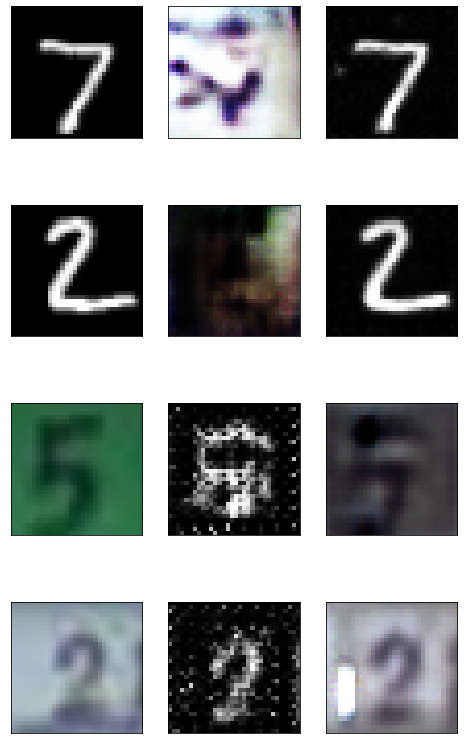

Step[35600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0253


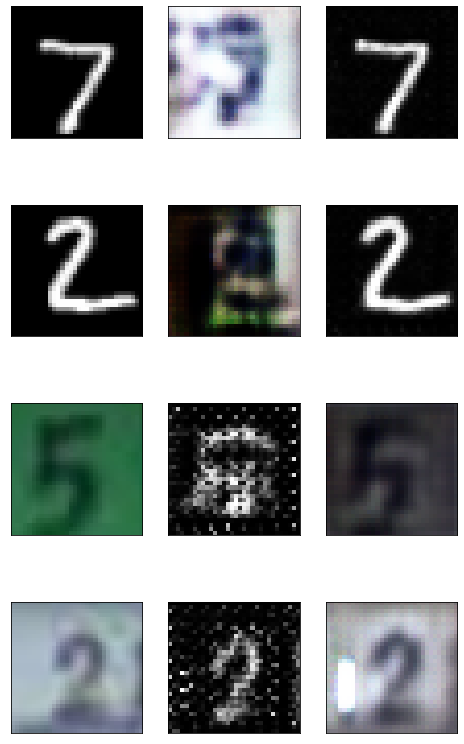

Step[35800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0045, g_loss: 1.0269


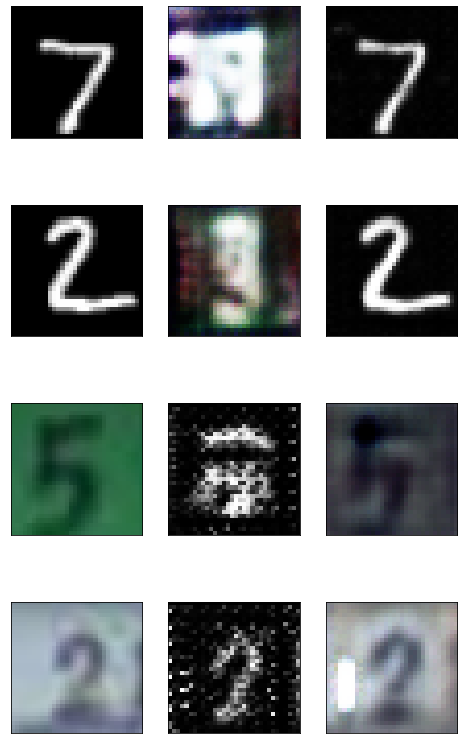

Step[36000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0189


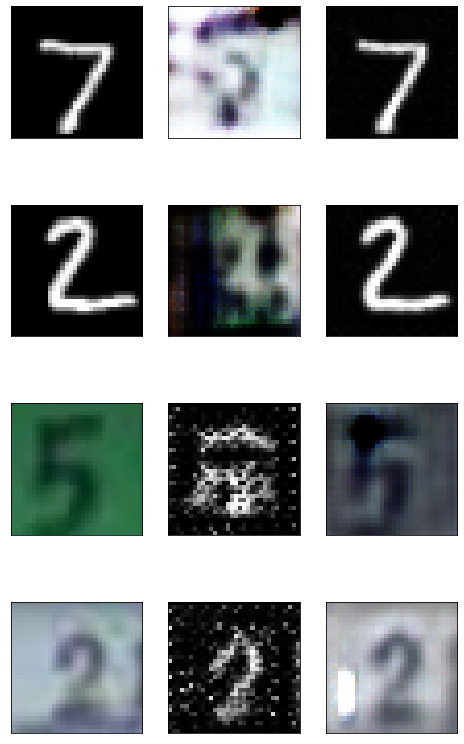

Step[36200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0070, g_loss: 1.0388


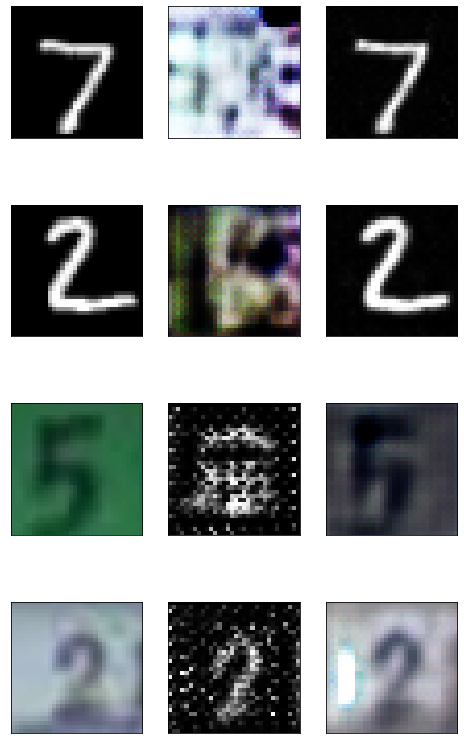

Step[36400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0299


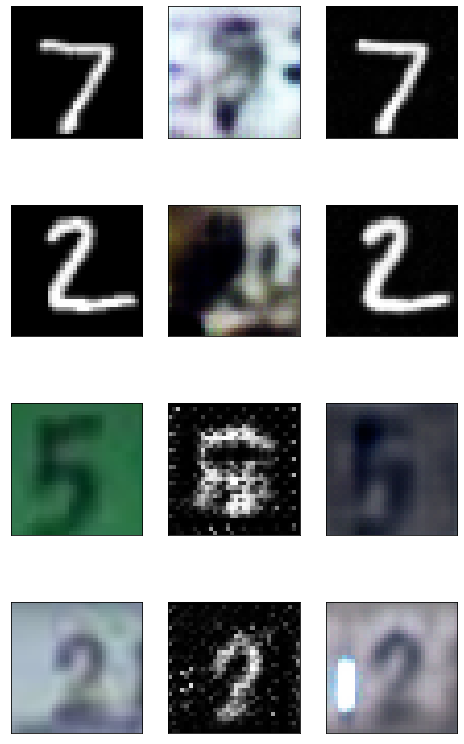

Step[36600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0004, g_loss: 1.0267


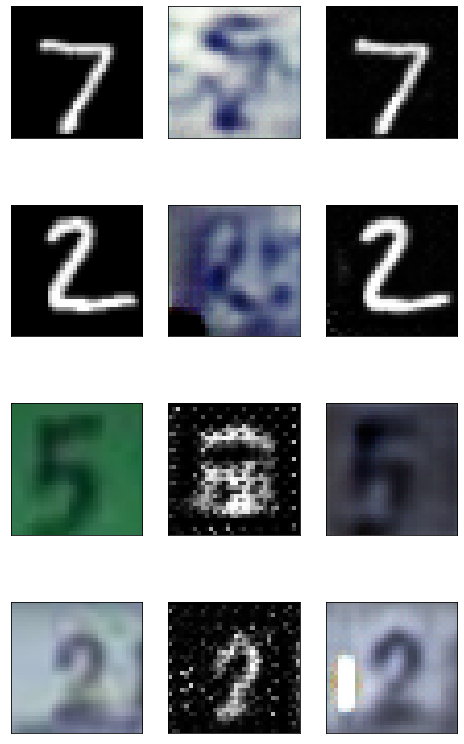

Step[36800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0533


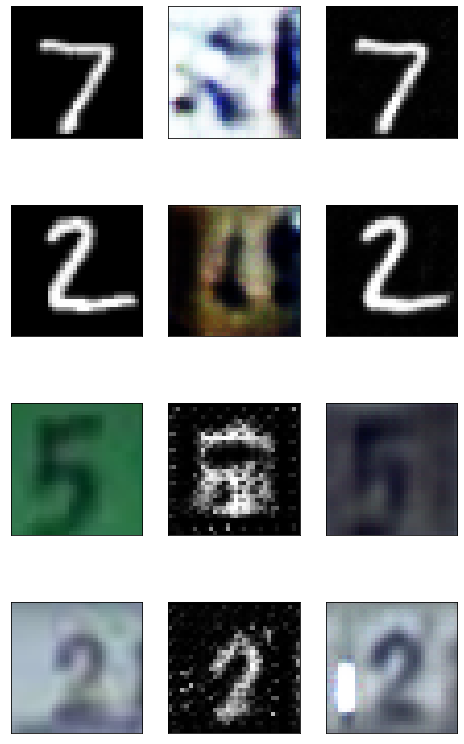

Step[37000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0559


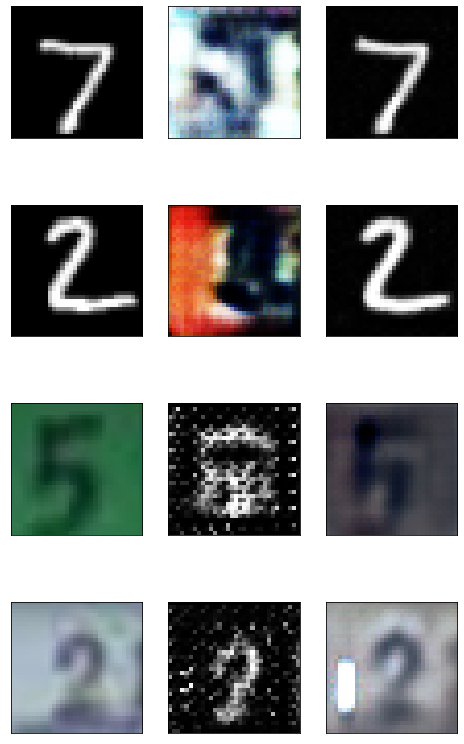

Step[37200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1062


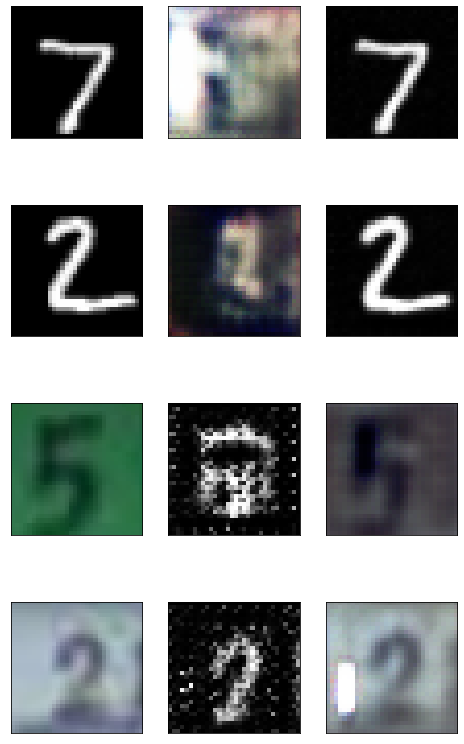

Step[37400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0012, g_loss: 1.0540


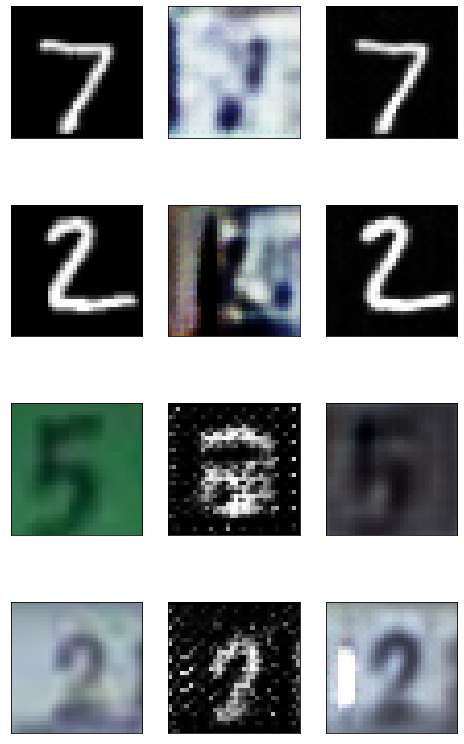

Step[37600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0055, g_loss: 1.0288


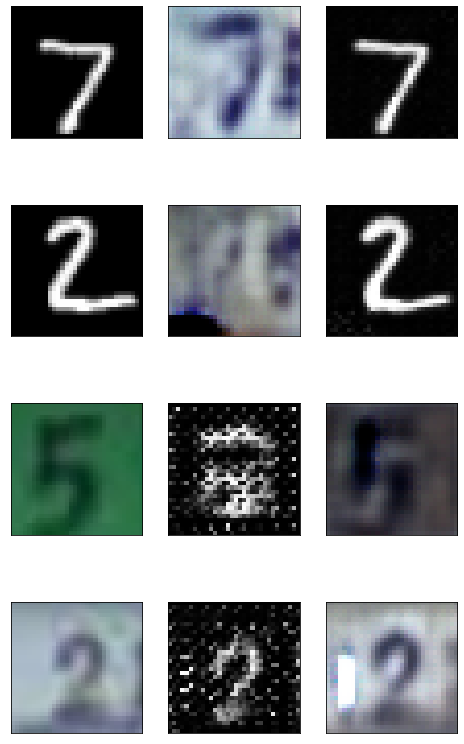

Step[37800/50000], d_real_loss: 0.0003, d_fake_loss: 0.0000, g_loss: 1.0433


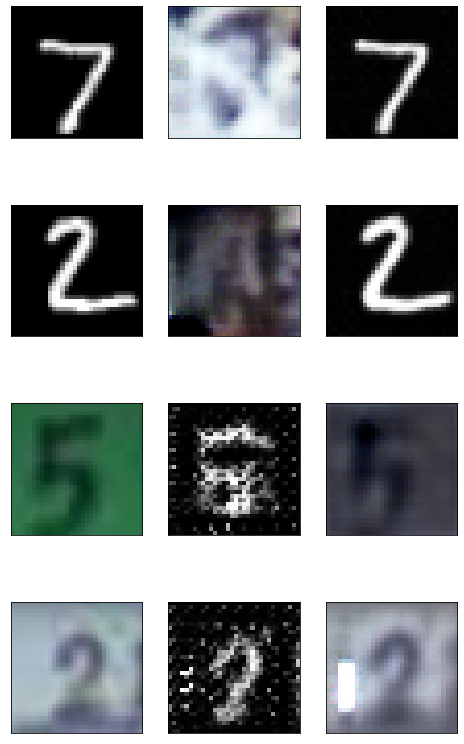

Step[38000/50000], d_real_loss: 0.0170, d_fake_loss: 0.0000, g_loss: 1.0318


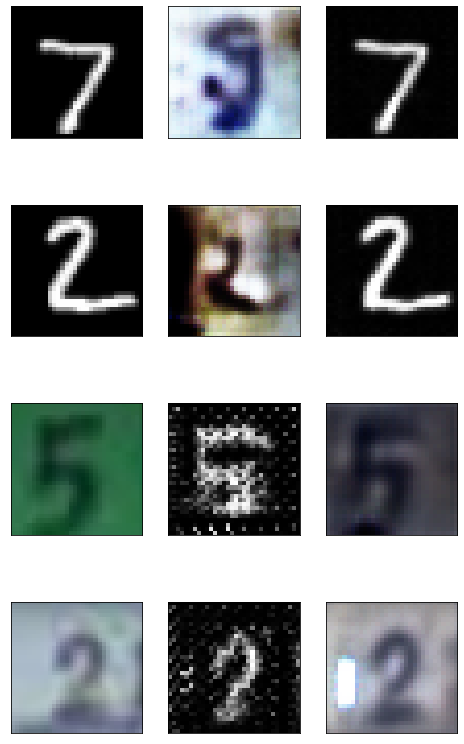

Step[38200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0008, g_loss: 1.0390


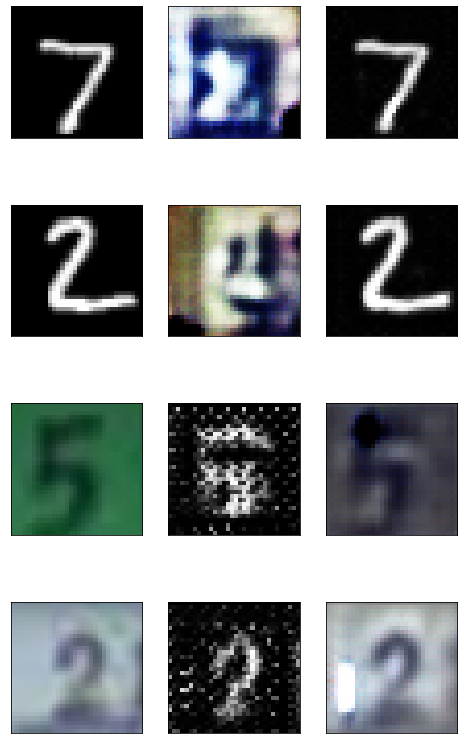

Step[38400/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.0181


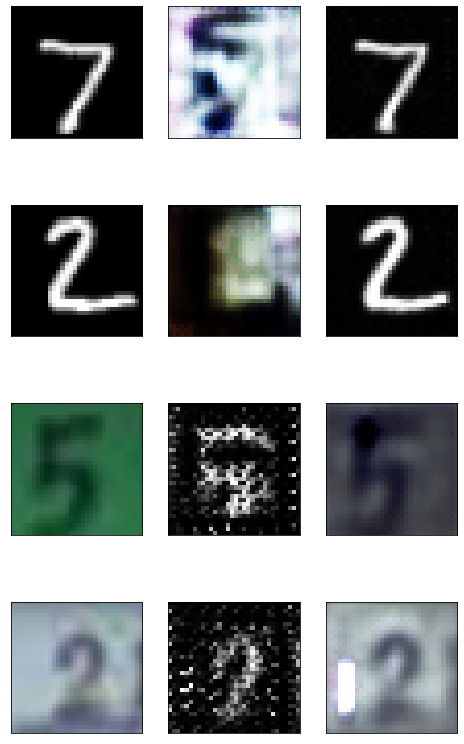

Step[38600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0237


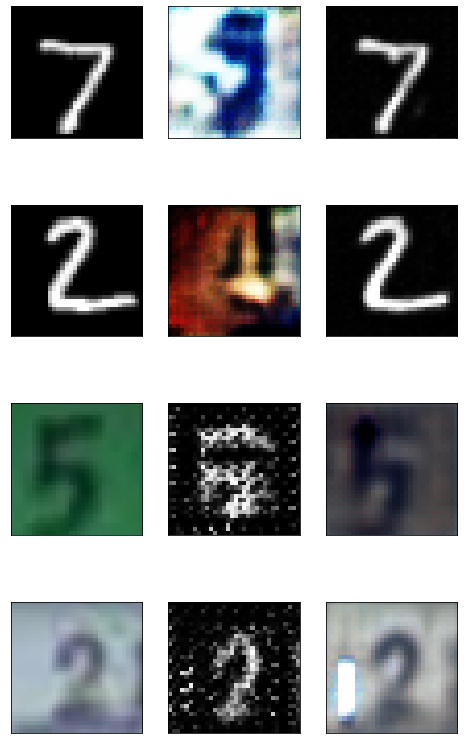

Step[38800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0596


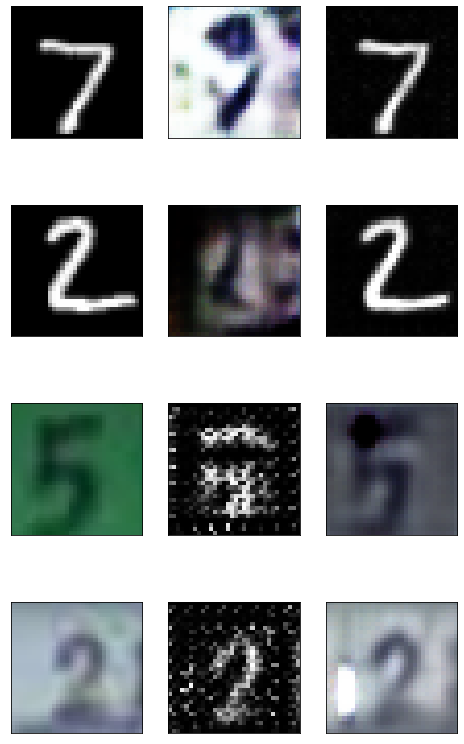

Step[39000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0371


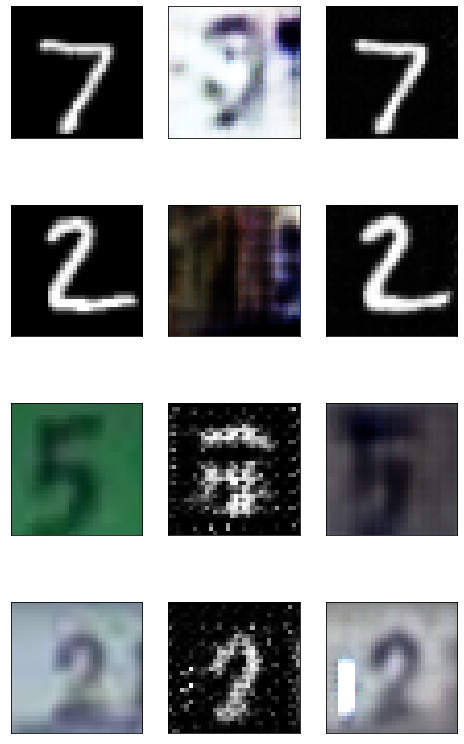

Step[39200/50000], d_real_loss: 0.0430, d_fake_loss: 0.0000, g_loss: 1.0186


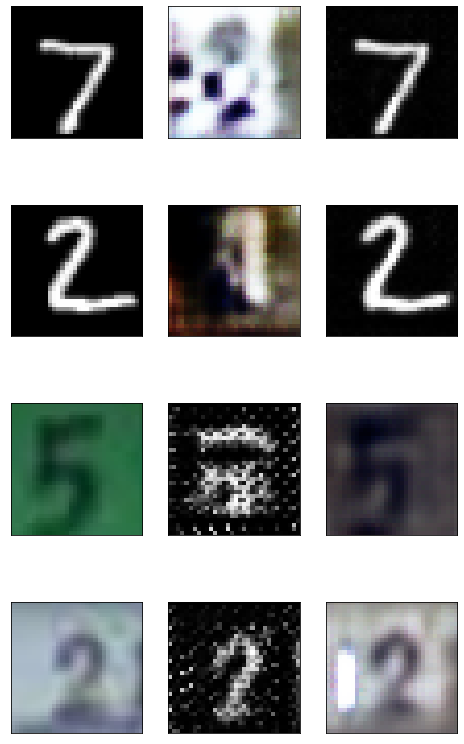

Step[39400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0589


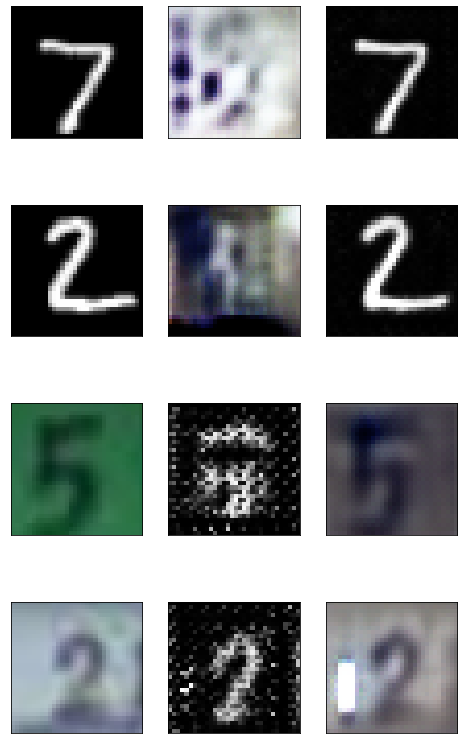

Step[39600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1508


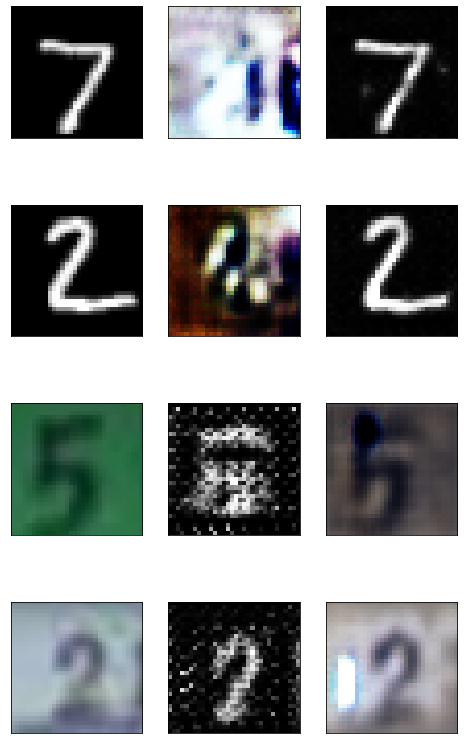

Step[39800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0297


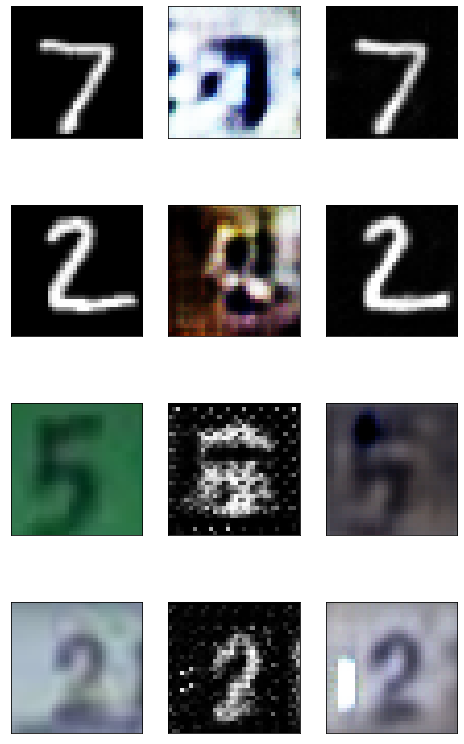

Step[40000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0275


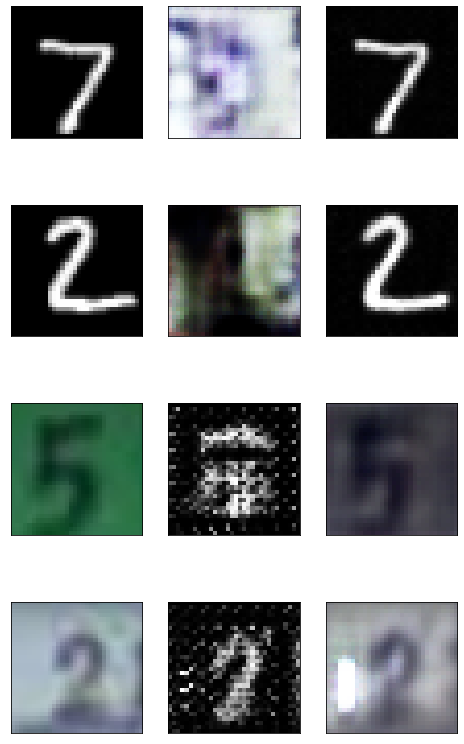

Step[40200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0779


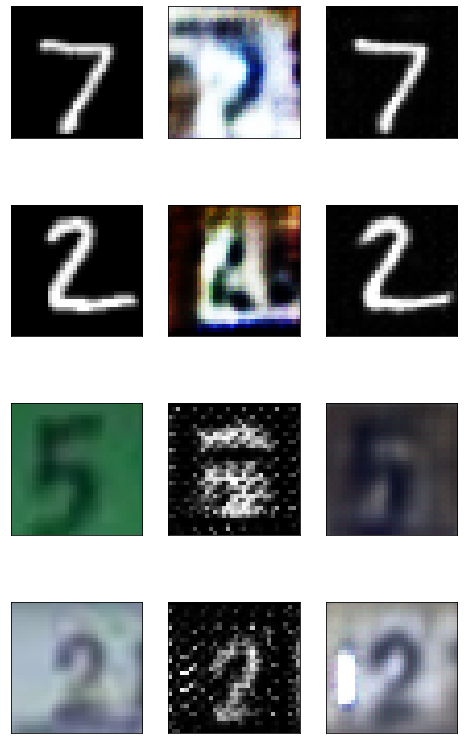

Step[40400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0017, g_loss: 1.0390


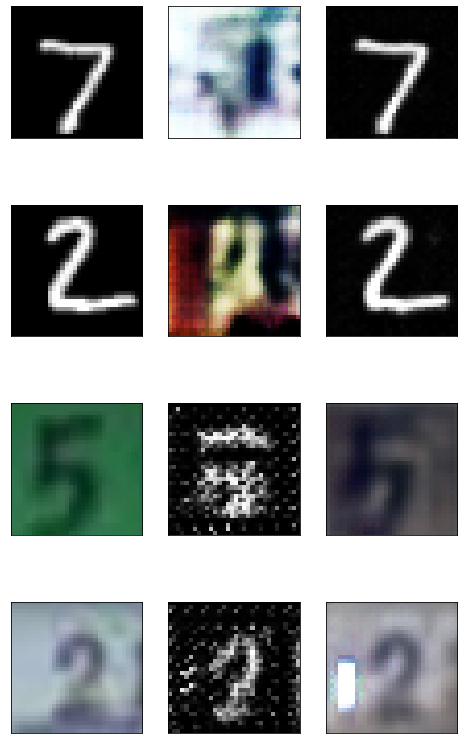

Step[40600/50000], d_real_loss: 0.0151, d_fake_loss: 0.0000, g_loss: 1.0184


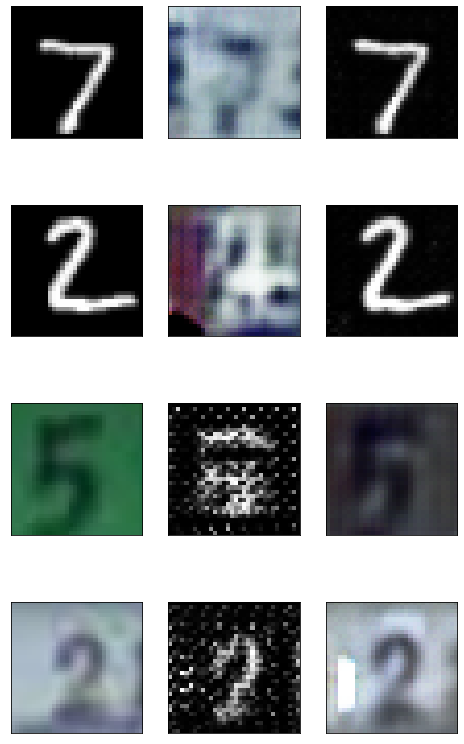

Step[40800/50000], d_real_loss: 0.0302, d_fake_loss: 0.0000, g_loss: 1.0419


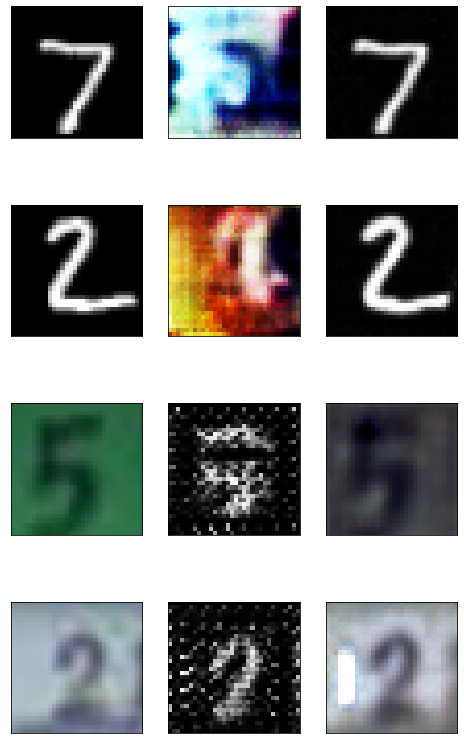

Step[41000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0003, g_loss: 1.0204


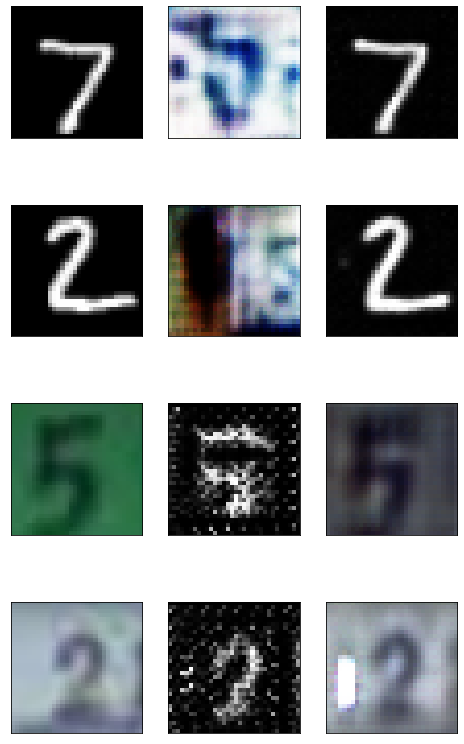

Step[41200/50000], d_real_loss: 0.0002, d_fake_loss: 0.0001, g_loss: 1.0318


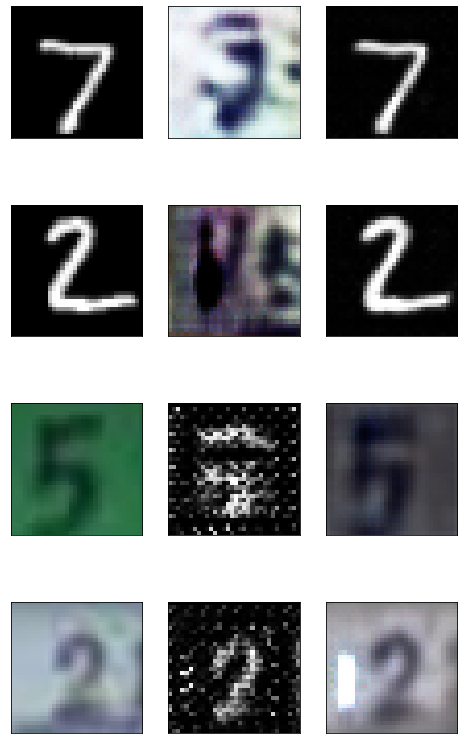

Step[41400/50000], d_real_loss: 0.0189, d_fake_loss: 0.0059, g_loss: 1.0298


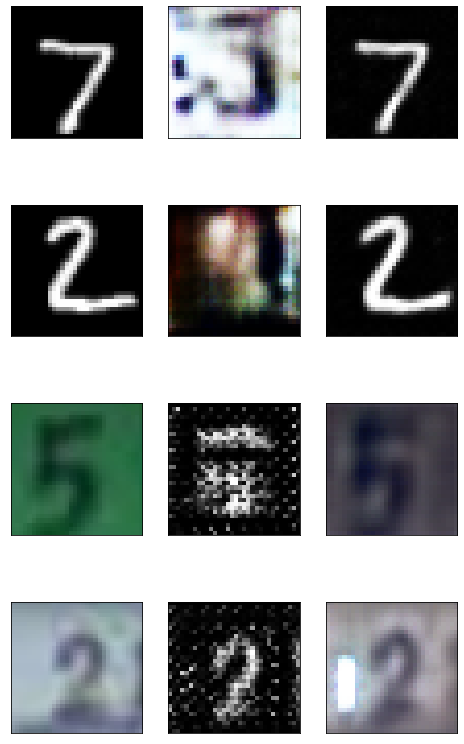

Step[41600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0256


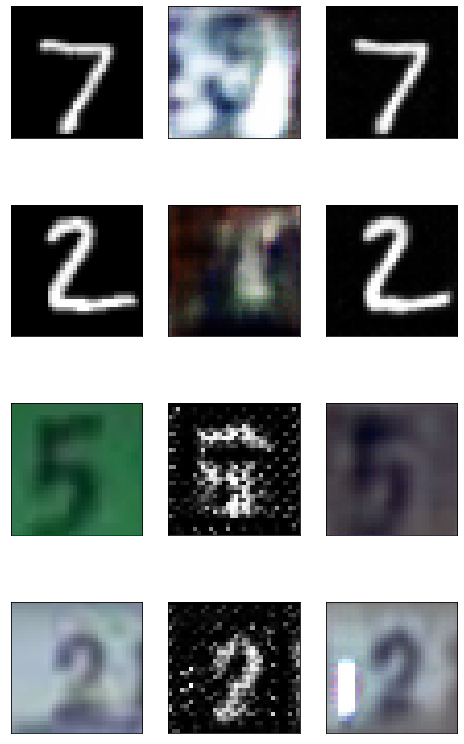

Step[41800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0065, g_loss: 1.0344


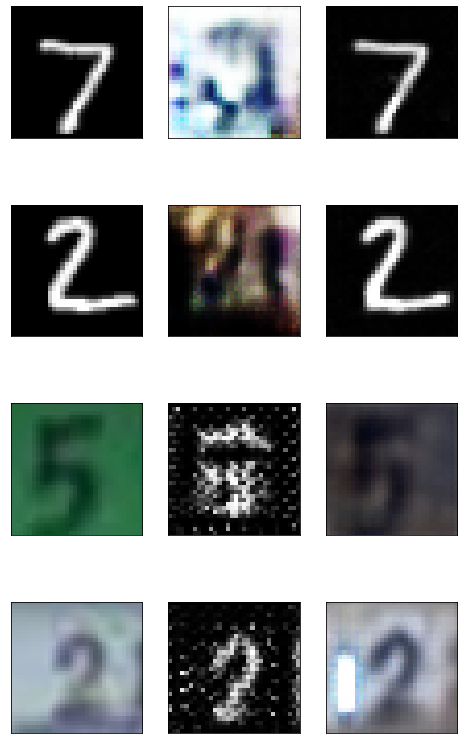

Step[42000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0677


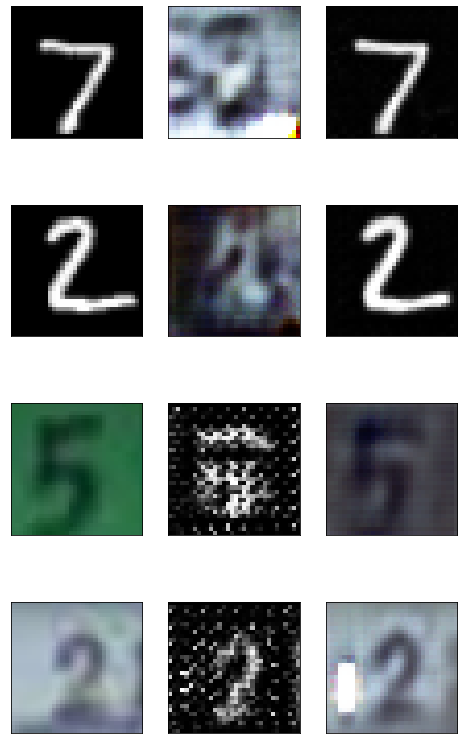

Step[42200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0093, g_loss: 1.1087


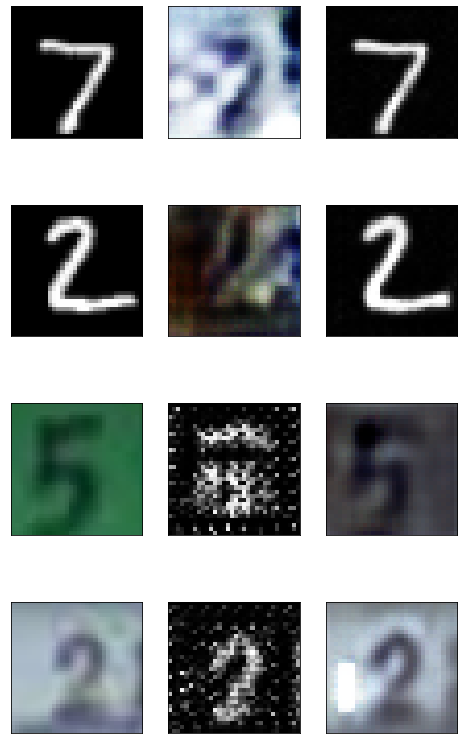

Step[42400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0594


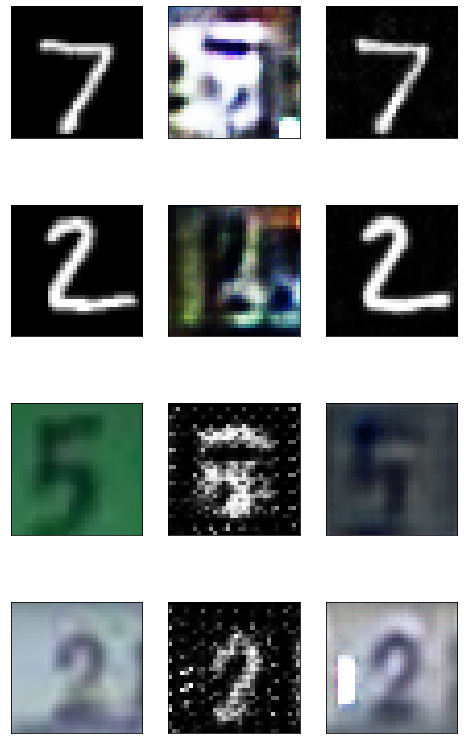

Step[42600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0176


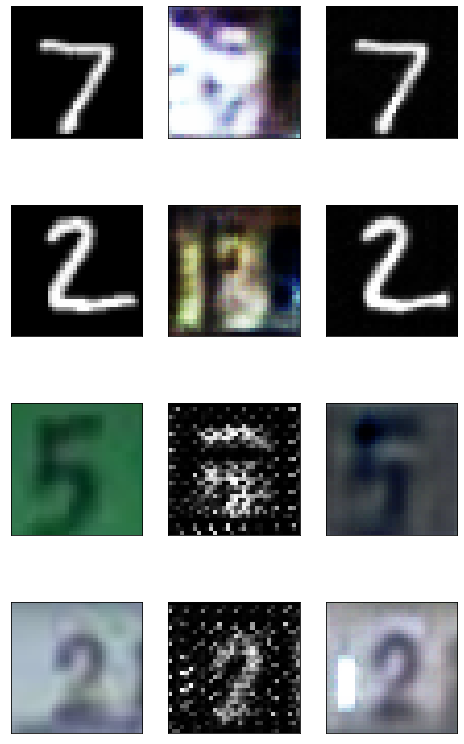

Step[42800/50000], d_real_loss: 0.1204, d_fake_loss: 0.0000, g_loss: 1.0390


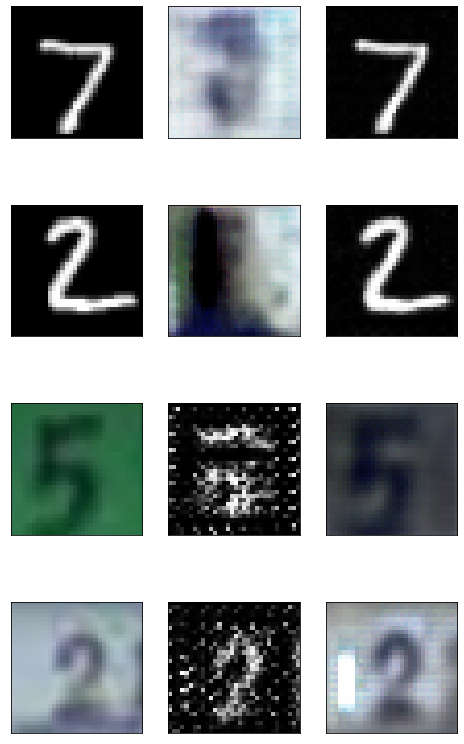

Step[43000/50000], d_real_loss: 0.0267, d_fake_loss: 0.0001, g_loss: 1.0423


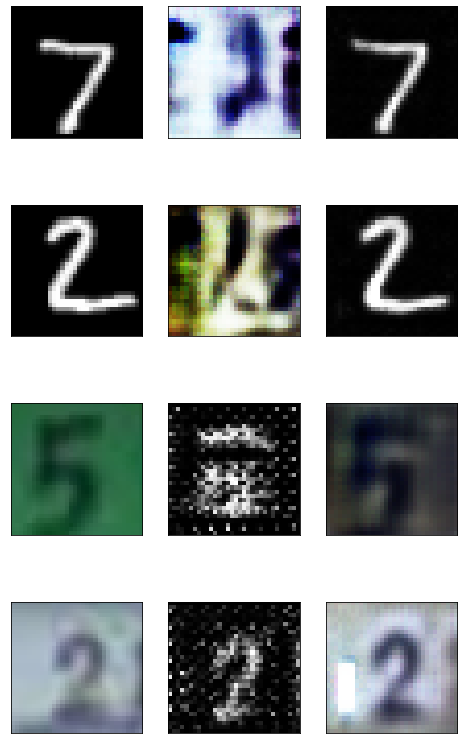

Step[43200/50000], d_real_loss: 0.0742, d_fake_loss: 0.0012, g_loss: 1.0310


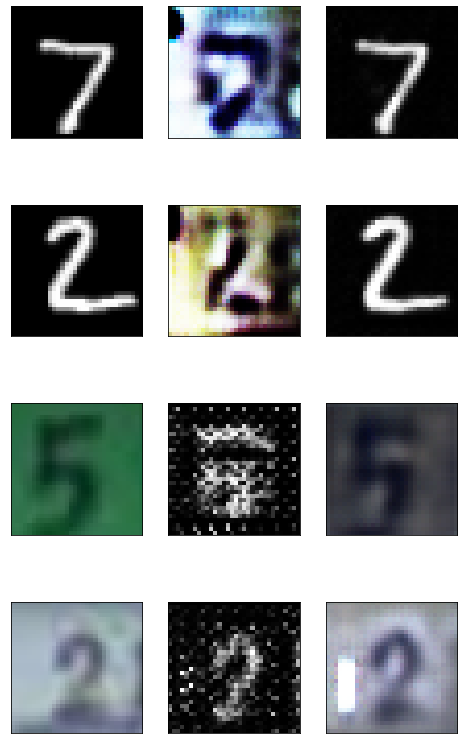

Step[43400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0001, g_loss: 1.0275


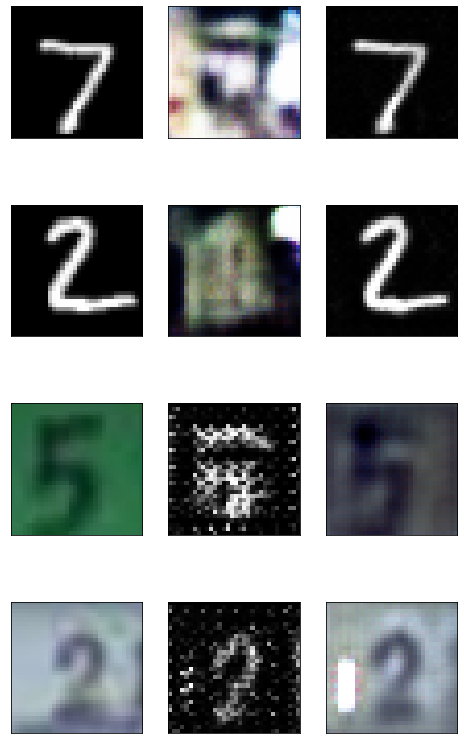

Step[43600/50000], d_real_loss: 0.0006, d_fake_loss: 0.0005, g_loss: 1.0346


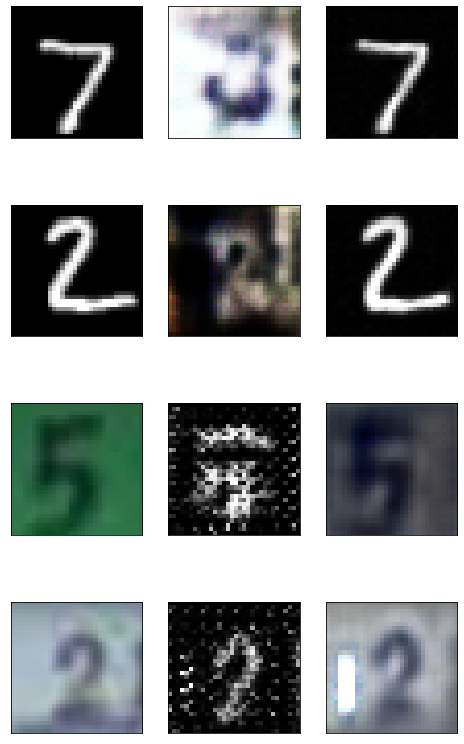

Step[43800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0635


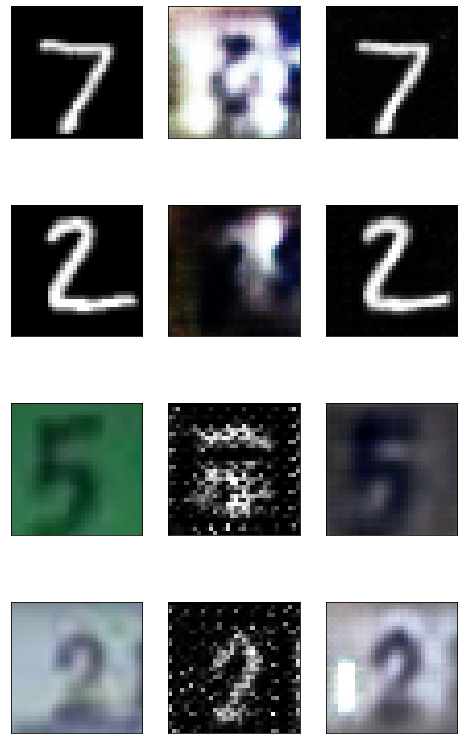

Step[44000/50000], d_real_loss: 0.0000, d_fake_loss: 0.5179, g_loss: 1.0302


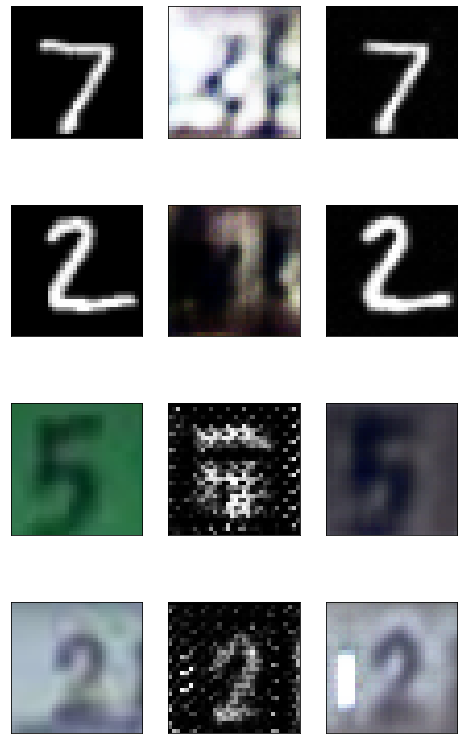

Step[44200/50000], d_real_loss: 0.0000, d_fake_loss: 0.2235, g_loss: 1.0190


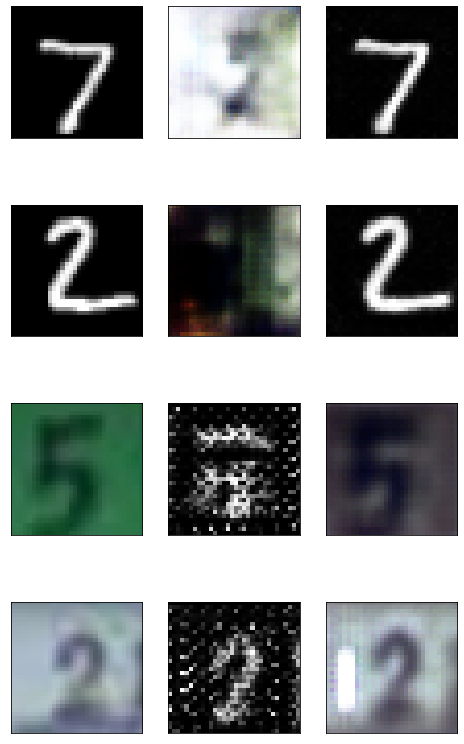

Step[44400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0562


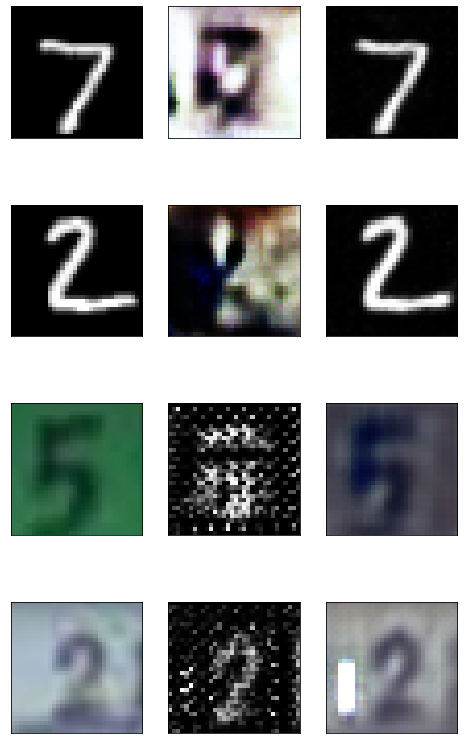

Step[44600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.1478


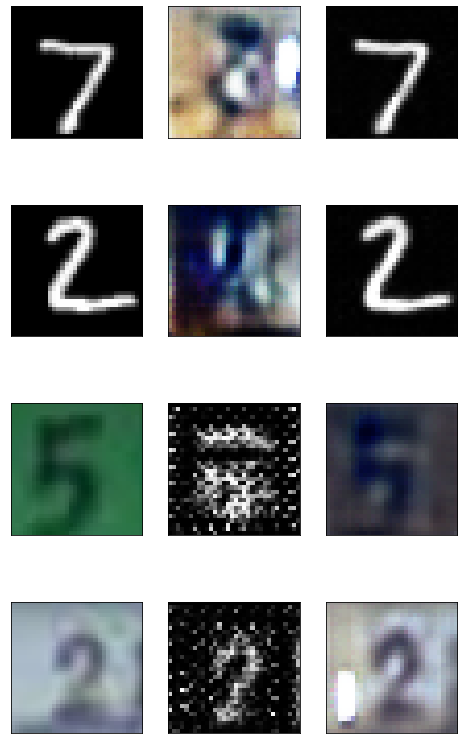

Step[44800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0328


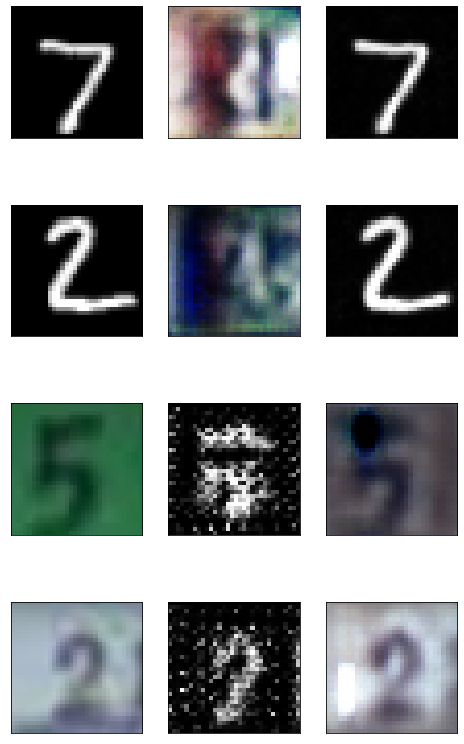

Step[45000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0267


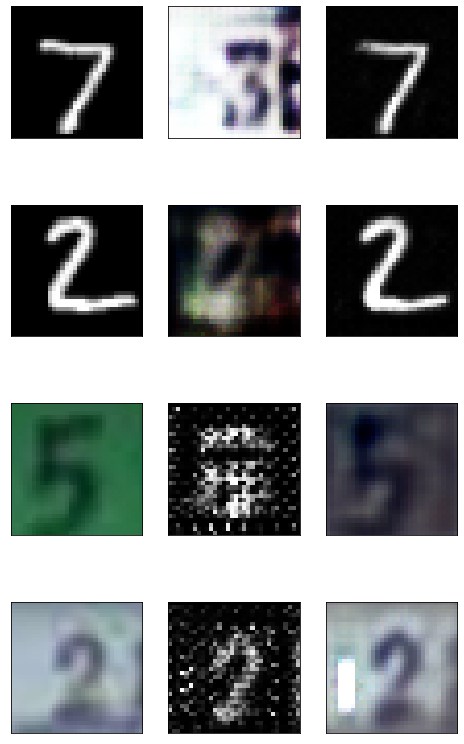

Step[45200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0751


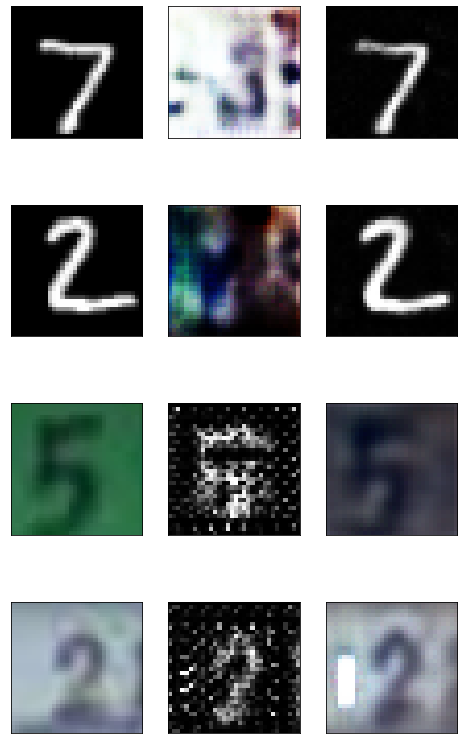

Step[45400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0002, g_loss: 1.0371


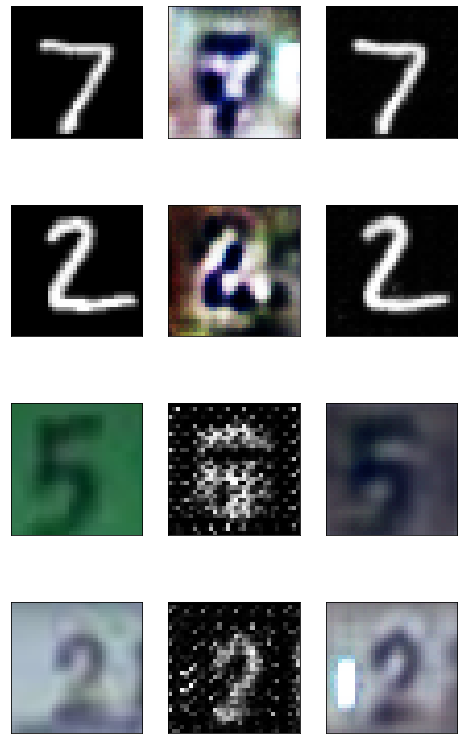

Step[45600/50000], d_real_loss: 0.4672, d_fake_loss: 0.0010, g_loss: 1.0201


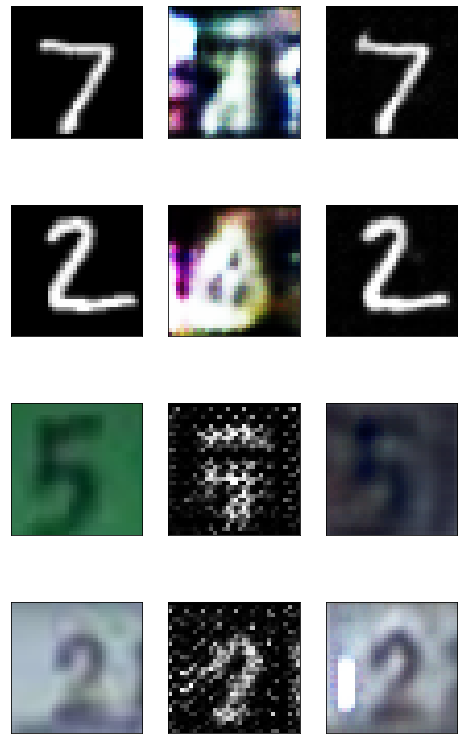

Step[45800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0347


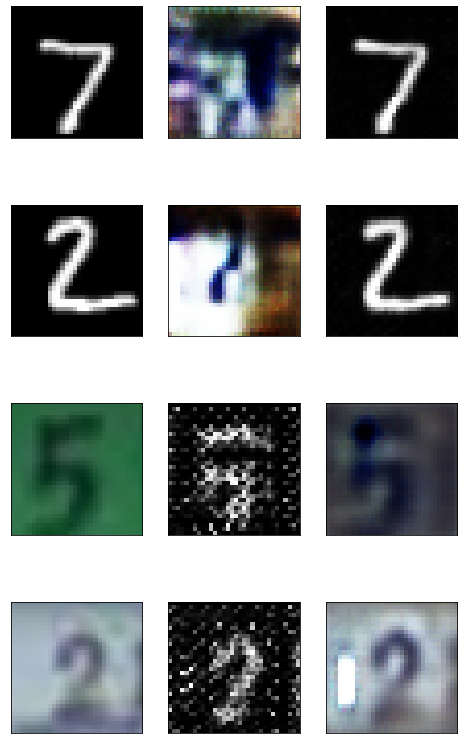

Step[46000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0227


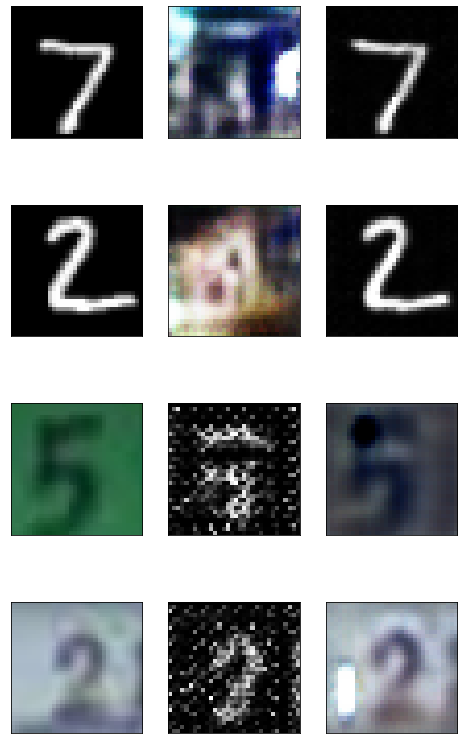

Step[46200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0325


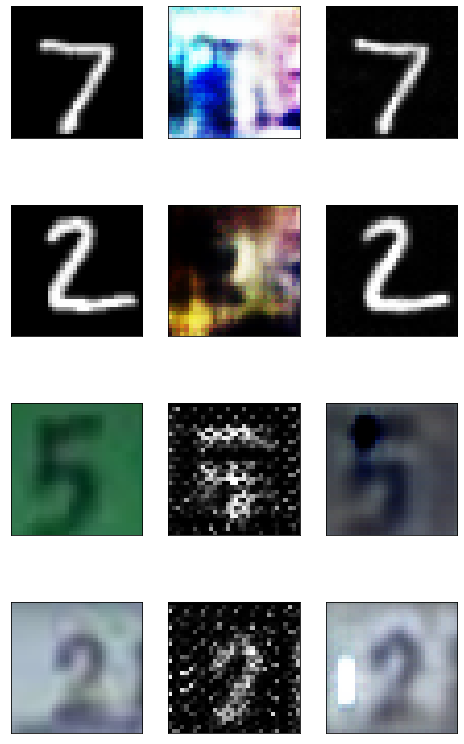

Step[46400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0004, g_loss: 1.0269


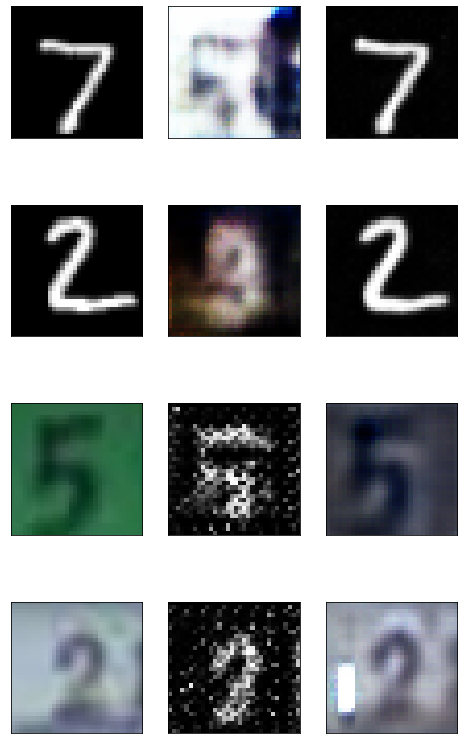

Step[46600/50000], d_real_loss: 0.0013, d_fake_loss: 0.1428, g_loss: 1.0256


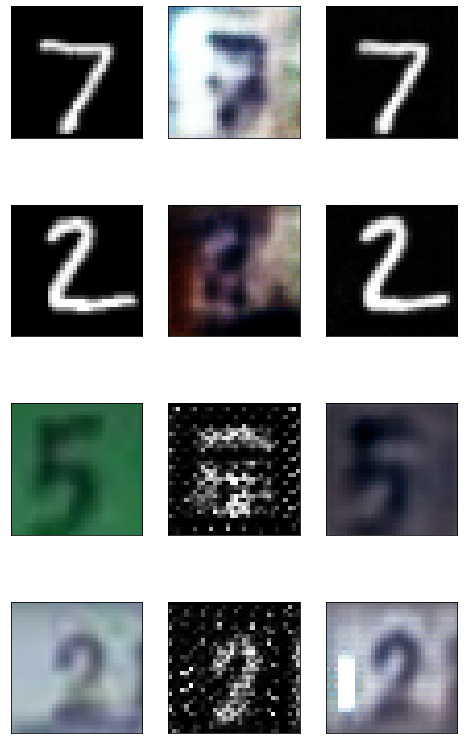

Step[46800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0044, g_loss: 1.0385


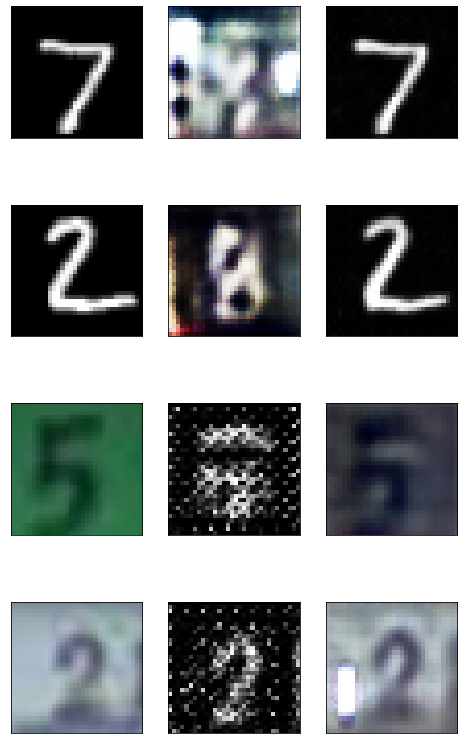

Step[47000/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0541


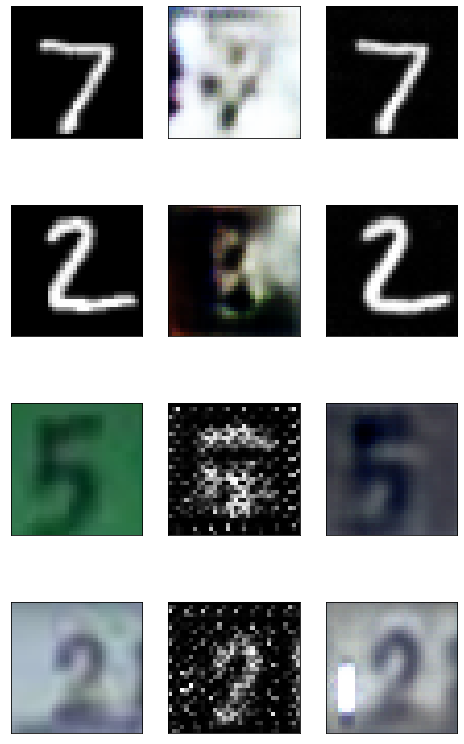

Step[47200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0937


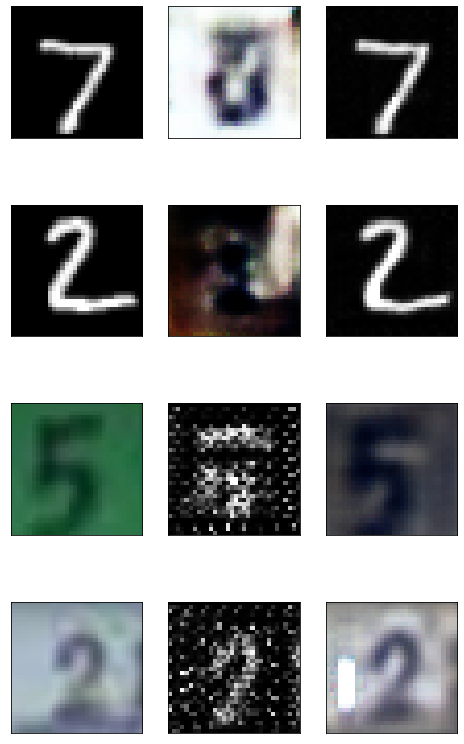

Step[47400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0558


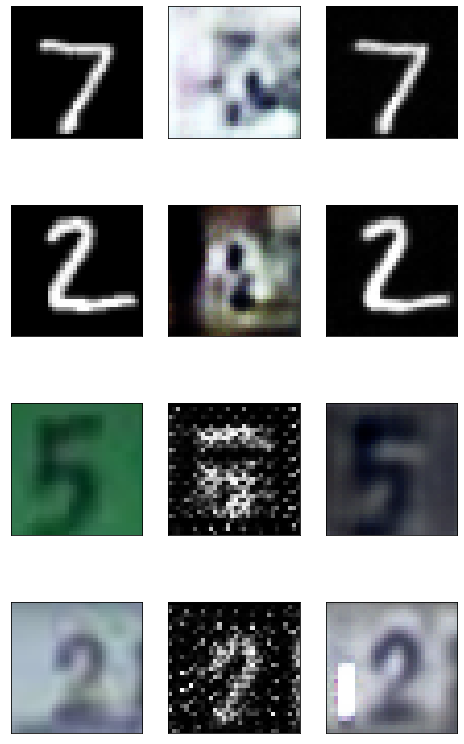

Step[47600/50000], d_real_loss: 0.0000, d_fake_loss: 0.1971, g_loss: 1.0155


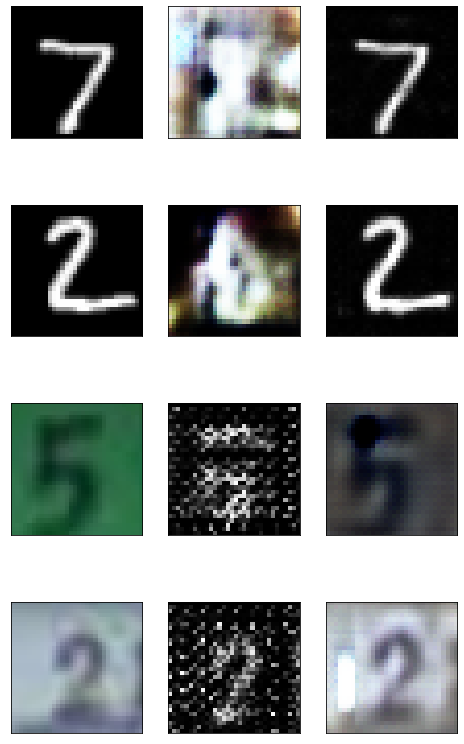

Step[47800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0353


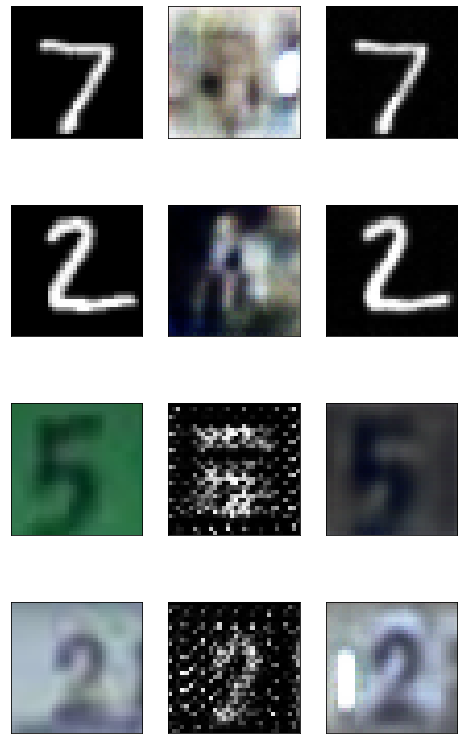

Step[48000/50000], d_real_loss: 0.3430, d_fake_loss: 0.0101, g_loss: 1.0343


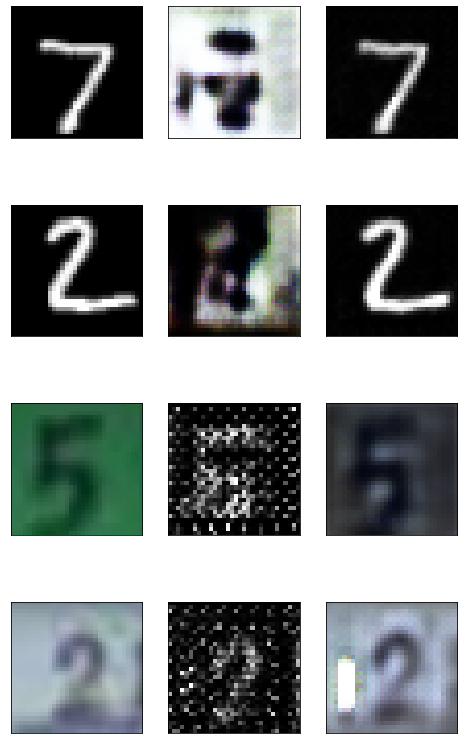

Step[48200/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0382


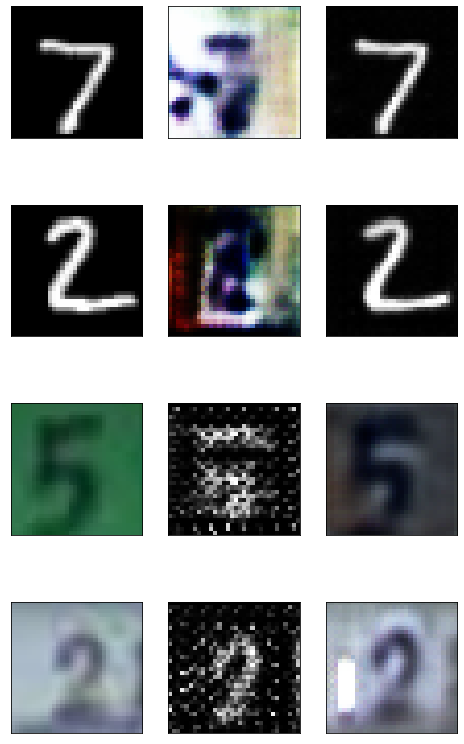

Step[48400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0253


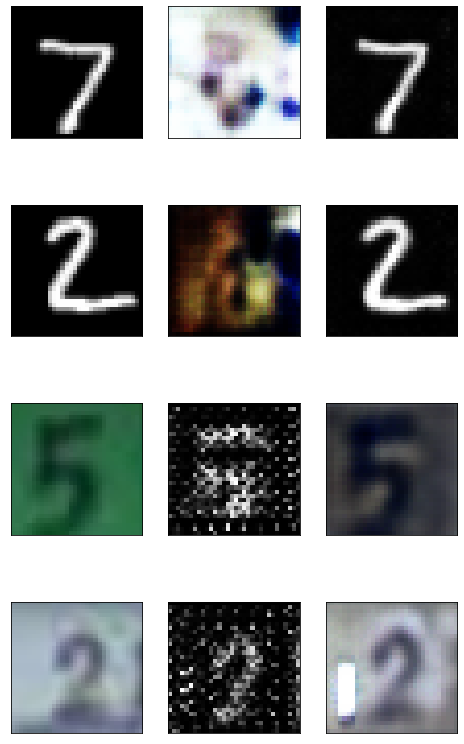

Step[48600/50000], d_real_loss: 0.0005, d_fake_loss: 0.0049, g_loss: 1.0302


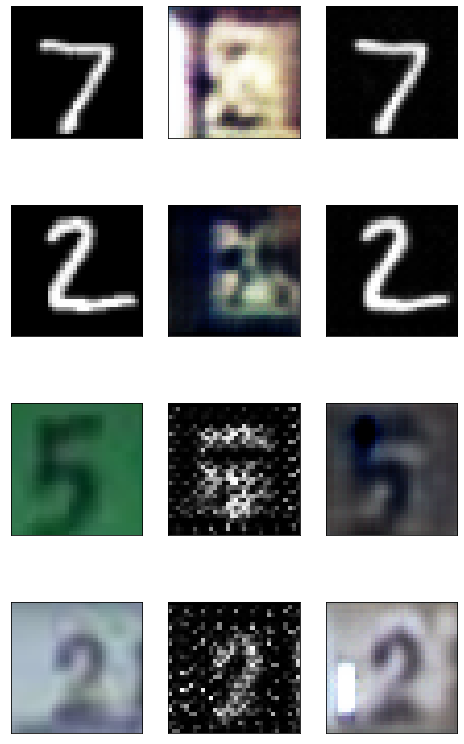

Step[48800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0586


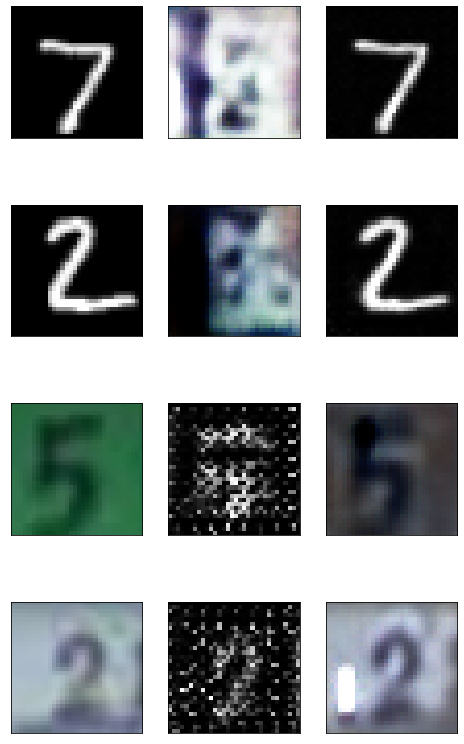

Step[49000/50000], d_real_loss: 0.0001, d_fake_loss: 0.0000, g_loss: 1.0278


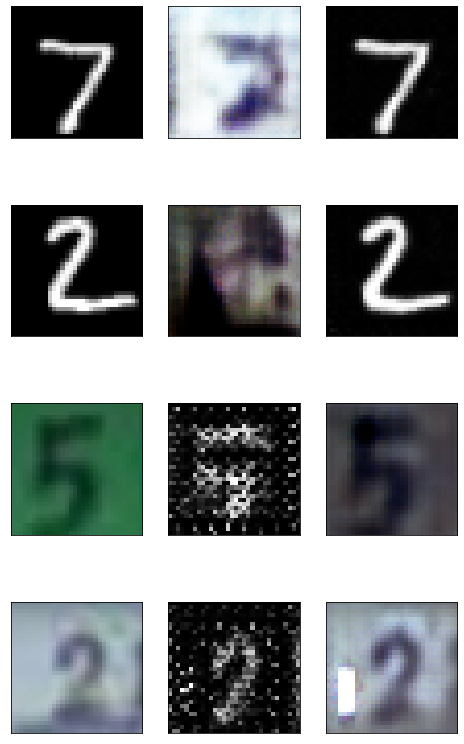

Step[49200/50000], d_real_loss: 0.0193, d_fake_loss: 0.0017, g_loss: 1.0214


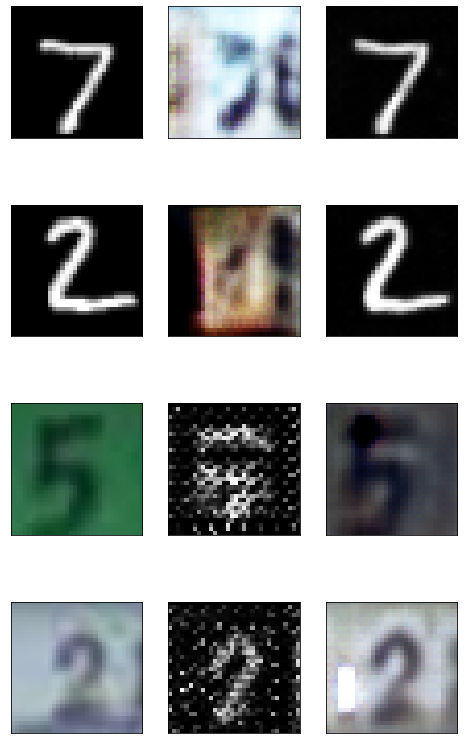

Step[49400/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0590


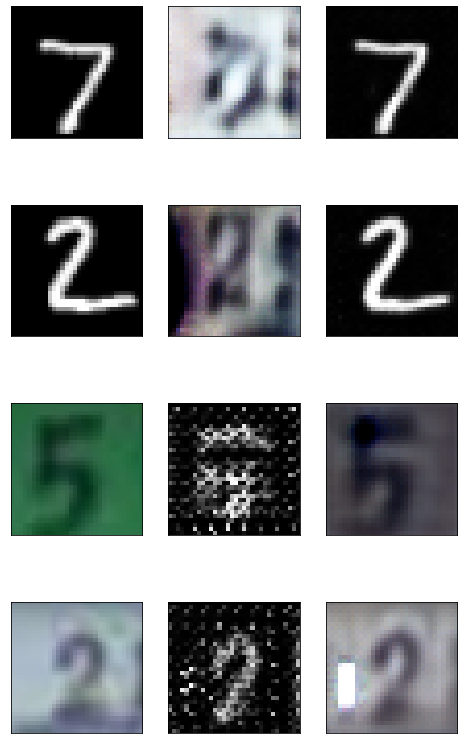

Step[49600/50000], d_real_loss: 0.0000, d_fake_loss: 0.0002, g_loss: 1.1447


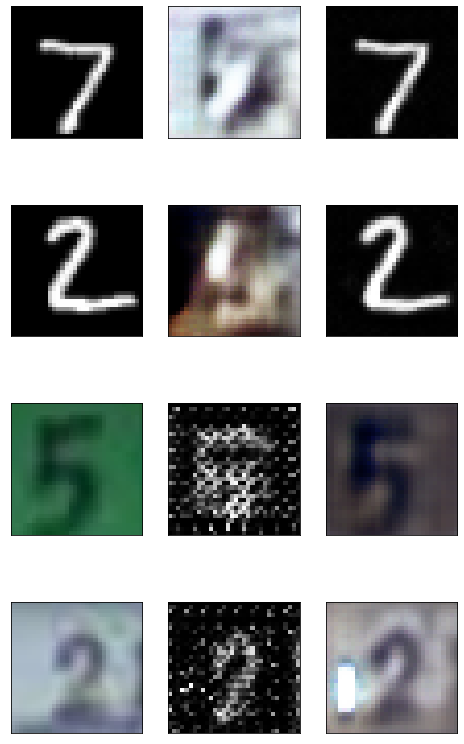

Step[49800/50000], d_real_loss: 0.0000, d_fake_loss: 0.0000, g_loss: 1.0182


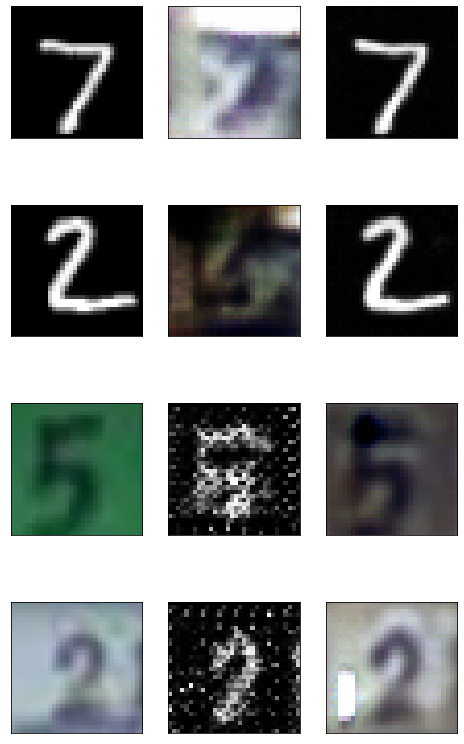

In [70]:
# Iteration 수 선언
iters = 50000

# trainig 과정에서 생성되는 이미지가 어떻게 변화하는지 볼 수 있도록 고정된 데이터를 가지고 있으면 좋습니다.
mnist_iter = iter(mnist_testloader)
svhn_iter = iter(svhn_testloader)

# 각 도메인별로 처음 2개만 생성해 보겠습니다 
fixed_mnist = next(mnist_iter)[0][:2].cuda()
fixed_svhn = next(svhn_iter)[0][:2].cuda()

for i in range(iters):
    
    # 각 도메인의 데이터들을 불러와 줍니다. 
    try:
        mnist, m_labels = next(mnist_iter) 
        svhn, s_labels = next(svhn_iter)
    except:
        mnist_iter = iter(mnist_testloader)
        svhn_iter = iter(svhn_testloader)
        mnist, m_labels = next(mnist_iter) 
        svhn, s_labels = next(svhn_iter)

    # To GPU
    mnist, m_labels = mnist.cuda(), m_labels.cuda()
    svhn, s_labels = svhn.cuda(), s_labels.cuda()
    
    #============= Train the discriminator =============#
    
    # Real images를 통해 D를 학습합니다 
    out = D_m(mnist)
    d_loss_mnist = torch.mean((out-1)**2)  #MSE Loss
    
    out = D_s(svhn)
    d_loss_svhn = torch.mean((out-1)**2)  #MSE Loss
    
    d_real_loss = d_loss_mnist + d_loss_svhn
    
    d_optimizer.zero_grad()
    d_real_loss.backward()
    d_optimizer.step()
    
    # Fake images(generated images)를 통해 D를 학습합니다.
    fake_svhn = G_ms(mnist)
    out = D_s(fake_svhn)
    d_loss_mnist = torch.mean(out**2)
    
    fake_mnist = G_sm(svhn)
    out = D_m(fake_mnist)
    d_loss_svhn = torch.mean(out**2)

    d_fake_loss = d_loss_mnist + d_loss_svhn
  
    d_optimizer.zero_grad()
    d_fake_loss.backward()
    d_optimizer.step()
    
    #=============== Train the generator ===============#
    # mnist-svhn-mnist cycle loss를 발생 시킵니다.
    fake_svhn = G_ms(mnist)
    out = D_s(fake_svhn)
    reconstructed_mnist = G_sm(fake_svhn)
    # Cycle loss
    g_loss = torch.mean((out-1)**2) # Discriminator를 속이도록 gradient 정보가 흐를 수 있습니다. 
    g_loss += torch.mean((mnist - reconstructed_mnist)**2) # MNIST를 다시 만들어 내야 합니다

    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()
    
    # svhn-mnist-svhn loss를 발생 시킵니다.
    fake_mnist = G_sm(svhn)
    out = D_m(fake_mnist)
    reconstructed_svhn = G_ms(fake_mnist)
    # Cycle loss
    g_loss = torch.mean((out-1)**2) # Discriminator를 속이도록 gradient 정보가 흐를 수 있습니다.
    g_loss += torch.mean((svhn - reconstructed_svhn)**2) # SVHN를 다시 만들어 내야 합니다    

    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()
    
    # print the log info
    if i % 200 == 0:    
        # fixed image 로 이미지 생성
        mnist_to_svhn = G_ms(fixed_mnist)
        mnist_recon = G_sm(mnist_to_svhn) 

        svhn_to_mnist = G_sm(fixed_svhn)
        svhn_recon = G_ms(svhn_to_mnist)

        print('======================================================================================================')
        print('Step[%d/%d], d_real_loss: %.4f, d_fake_loss: %.4f, g_loss: %.4f' 
                  %(i, iters, d_real_loss.item(), d_fake_loss.item(), g_loss.item()))
        print('======================================================================================================')
        show_images([fixed_mnist.detach().cpu().numpy()*0.5+0.5, mnist_to_svhn.detach().cpu().numpy()*0.5+0.5, mnist_recon.detach().cpu().numpy()*0.5+0.5
                        ,fixed_svhn.detach().cpu().numpy()*0.5+0.5, svhn_to_mnist.detach().cpu().numpy()*0.5+0.5, svhn_recon.detach().cpu().numpy()*0.5+0.5])

# Reference
- https://github.com/eriklindernoren/PyTorch-GAN/blob/36d3c77e5ff20ebe0aeefd322326a134a279b93e/implementations/cyclegan/cyclegan.py#L50
- Fastcampus, The Red 주재걸 교수님 실습 자료 中